In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
import tensorflow as tf
from keras.constraints import max_norm
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize

files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
dates=list()   
prices=list()
sentiment=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDatasetUpdated/Sentiment/'+file+'.csv')
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    #sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDataset/SentimentFul/'+file+'.csv')
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    #alignment of data
    maxdata=max(sentimentVector['initTime'])
    mindata=min(sentimentVector['initTime'])
    price['Unnamed: 0'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['Unnamed: 0']]
    price['Unnamed: 0'] = [row-timedelta(hours=8) for row in price['Unnamed: 0']]
    price=price[price['Unnamed: 0']>=mindata]
    price=price[price['Unnamed: 0']<=maxdata]
    dates.append(price['Unnamed: 0'])
    sentimentVector=sentimentVector.drop(['Unnamed: 0', 'initTime' ], axis=1)
    meanvector=np.concatenate((sentimentVector,sentimentVector.rolling(5).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(10).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(15).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(20).mean()),axis=1)
    price=price.drop(['Unnamed: 0'],axis=1)
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    sentiment.append(meanvector)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
def buildModel(l,n,d,le):
    opt=optimizers.SGD(lr=le, decay=1e-6, momentum=0.9, nesterov=True)
    model = Sequential()  
    model.add(Dense(n, input_dim=151,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model
def reset_weights(model):
    session=K.get_session()
    for layer in model.layers:
        if(hasattr(layer,'kernel_initializer')):
            layer.kernel.initializer.run(session=session)
            
           

Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


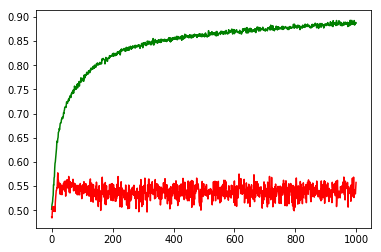

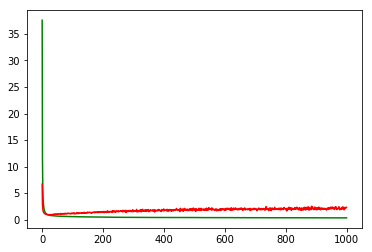

working on d,u and l,le 0.5 64 0.01 0.0001


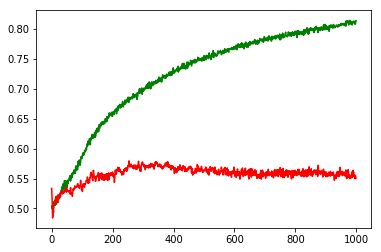

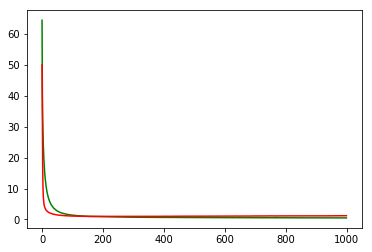

working on d,u and l,le 0.5 64 0.01 1e-05


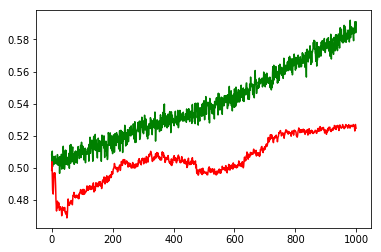

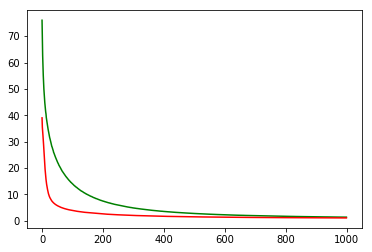

working on d,u and l,le 0.5 64 0.05 0.001


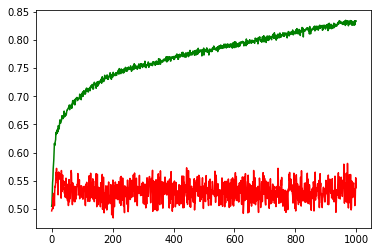

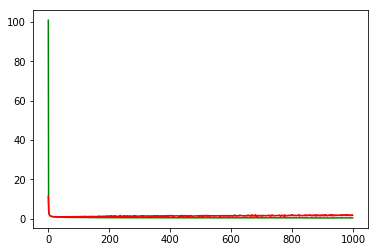

working on d,u and l,le 0.5 64 0.05 0.0001


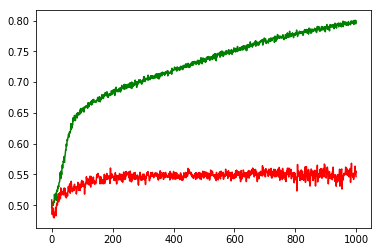

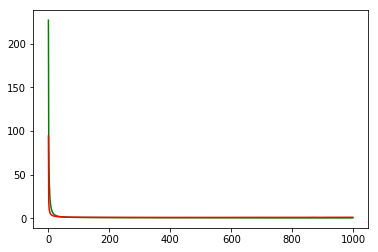

working on d,u and l,le 0.5 64 0.05 1e-05


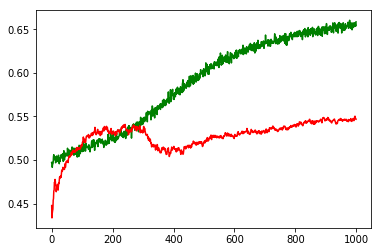

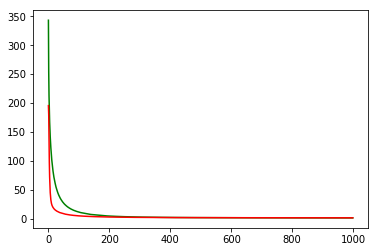

working on d,u and l,le 0.5 128 0.01 0.001


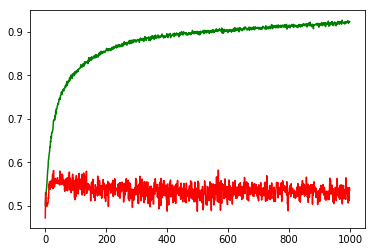

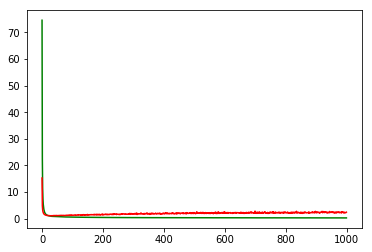

working on d,u and l,le 0.5 128 0.01 0.0001


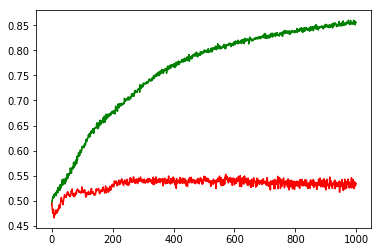

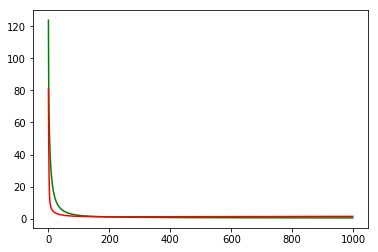

working on d,u and l,le 0.5 128 0.01 1e-05


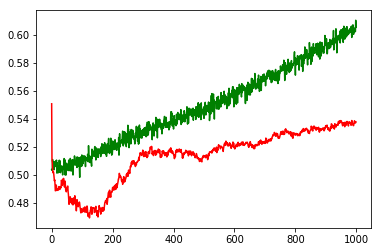

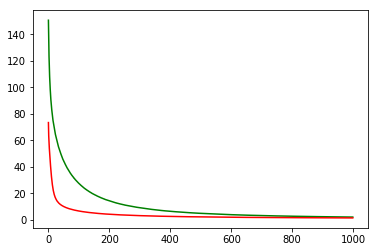

working on d,u and l,le 0.5 128 0.05 0.001


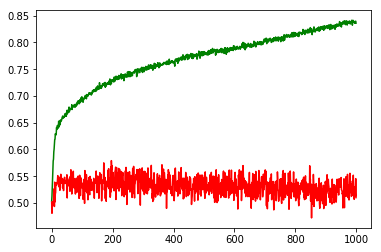

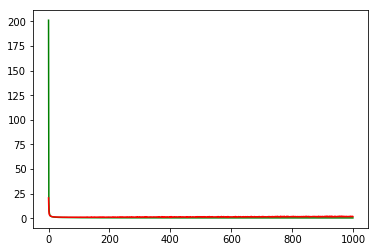

working on d,u and l,le 0.5 128 0.05 0.0001


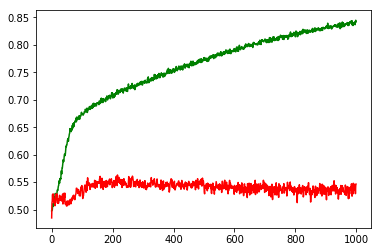

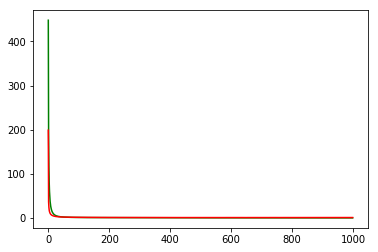

working on d,u and l,le 0.5 128 0.05 1e-05


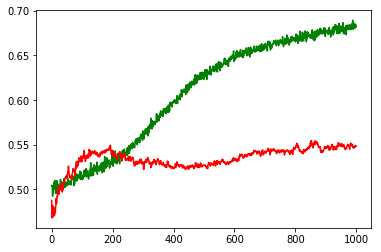

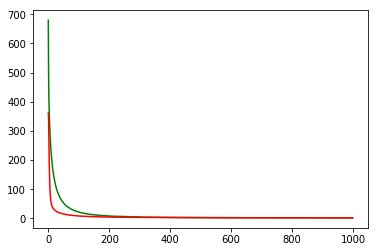

working on d,u and l,le 0.5 256 0.01 0.001


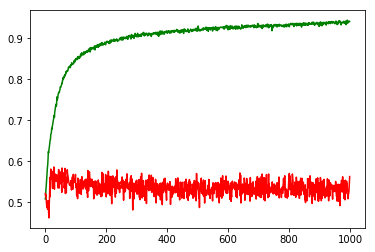

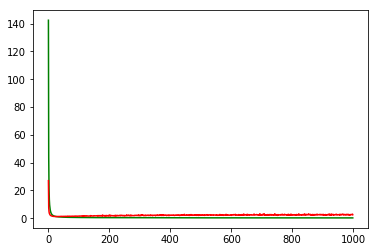

working on d,u and l,le 0.5 256 0.01 0.0001


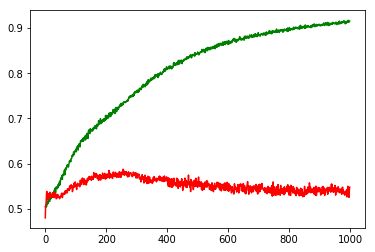

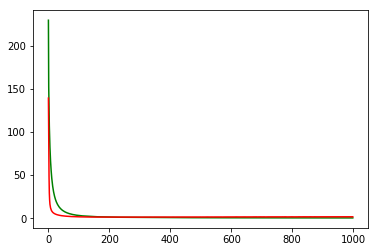

working on d,u and l,le 0.5 256 0.01 1e-05


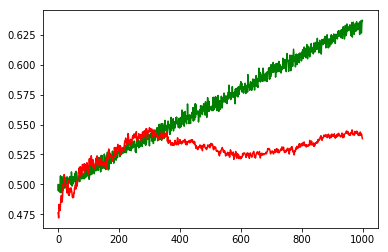

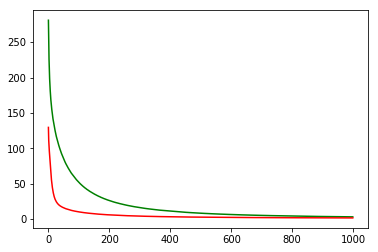

working on d,u and l,le 0.5 256 0.05 0.001


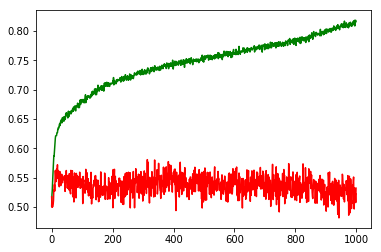

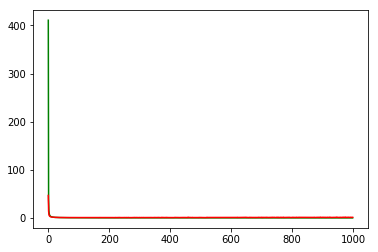

working on d,u and l,le 0.5 256 0.05 0.0001


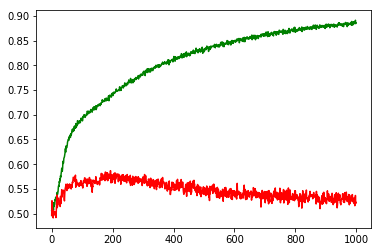

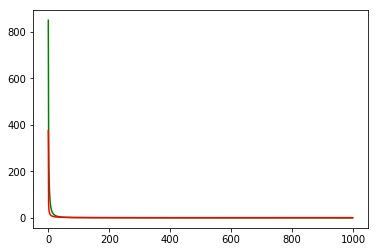

working on d,u and l,le 0.5 256 0.05 1e-05


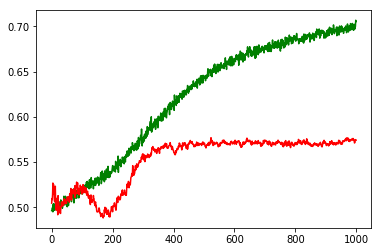

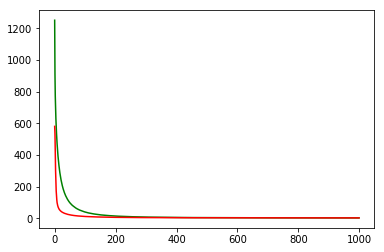

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: AAPL


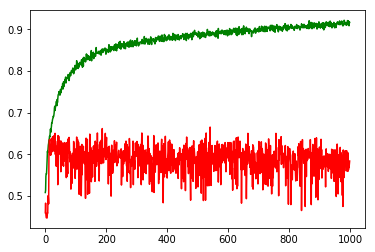

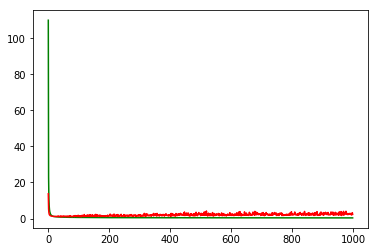

F1,score 0.5472061657032755
G-score: 0.5815479634993211
Accuracy 0.5840707942447831
Window: 140
[[376 130]
 [340 284]]
Vol pos 3.3830415542879217
Vol neg 2.880704247387323
Real Percentage of gain: 58.37895769003361
Percentage of gain: 0.7777667518212272
Total gain: 878.8764295579867
000000000000000000000000000000000000000000000000
Percentile:  0
[[317  61]
 [263 112]]
753/753 [==============================] - 0s 28us/step
[2.352994650157087, 0.5697211155378487]
Percentile:  1
[[32 36]
 [43 41]]
152/152 [==============================] - 0s 41us/step
[2.9574419761958874, 0.48026315789473684]
Percentile:  2
[[27 33]
 [ 8 71]]
139/139 [==============================] - 0s 42us/step
[0.9198633722907348, 0.7050359712230215]
Percentile:  3
[[ 0  0]
 [ 7 42]]
49/49 [==============================] - 0s 59us/step
[0.3679851357425962, 0.8571428571428571]
Percentile:  4
[[ 0  0]
 [18 17]]
35/35 [==============================] - 0s 69us/step
[0.8271313667297363, 0.48571428741727557]
00000000000

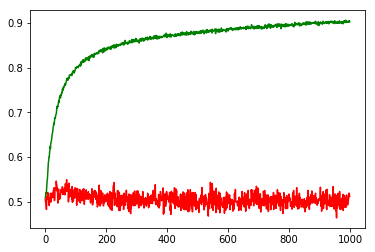

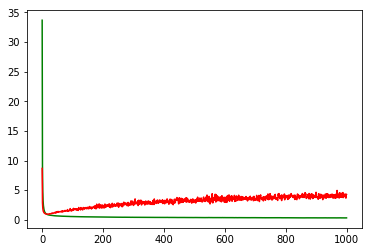

working on d,u and l,le 0.5 64 0.01 0.0001


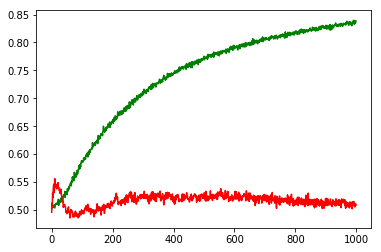

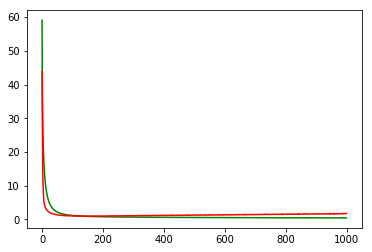

working on d,u and l,le 0.5 64 0.01 1e-05


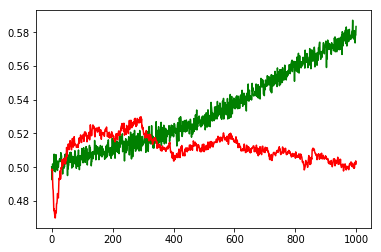

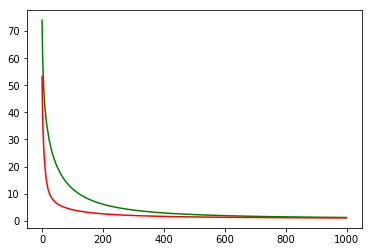

working on d,u and l,le 0.5 64 0.05 0.001


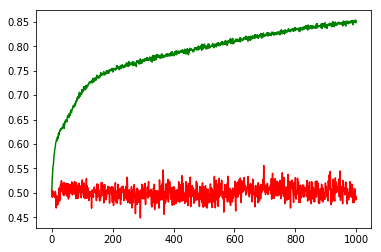

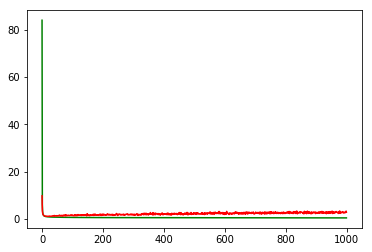

working on d,u and l,le 0.5 64 0.05 0.0001


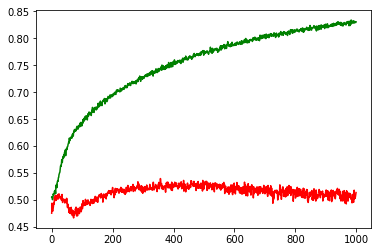

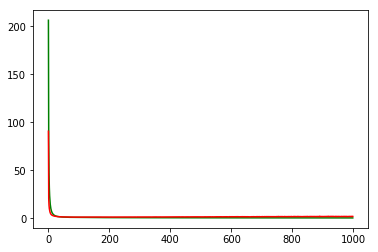

working on d,u and l,le 0.5 64 0.05 1e-05


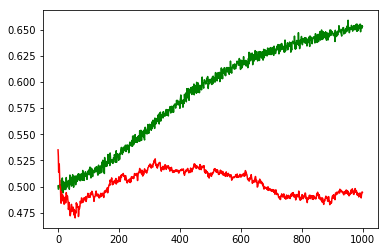

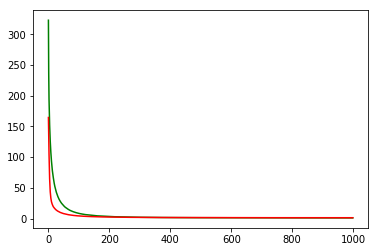

working on d,u and l,le 0.5 128 0.01 0.001


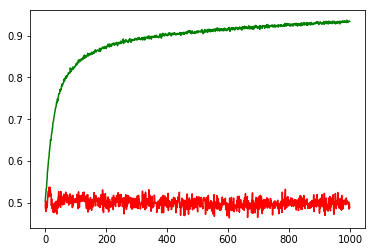

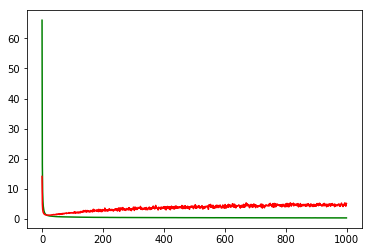

working on d,u and l,le 0.5 128 0.01 0.0001


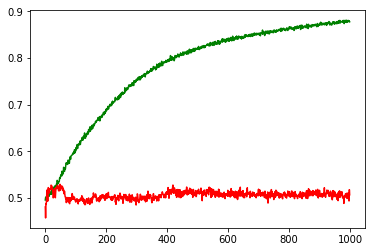

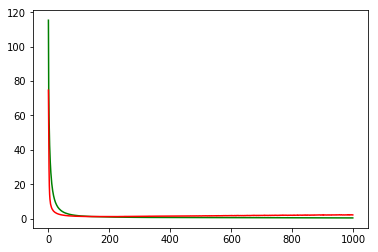

working on d,u and l,le 0.5 128 0.01 1e-05


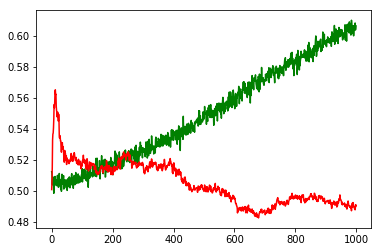

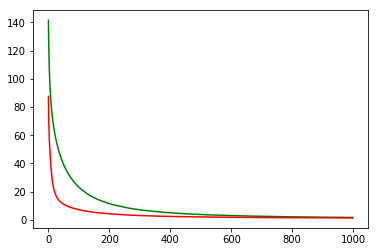

working on d,u and l,le 0.5 128 0.05 0.001


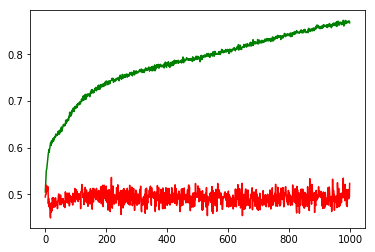

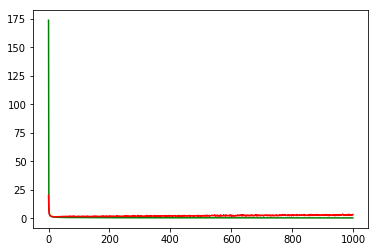

working on d,u and l,le 0.5 128 0.05 0.0001


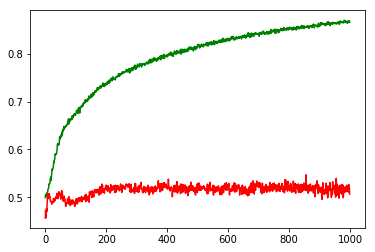

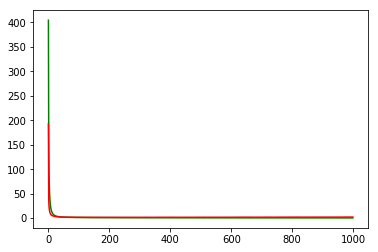

working on d,u and l,le 0.5 128 0.05 1e-05


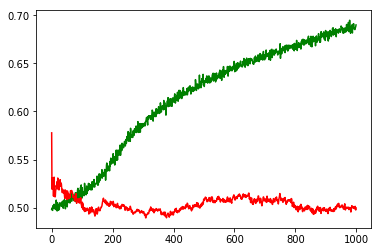

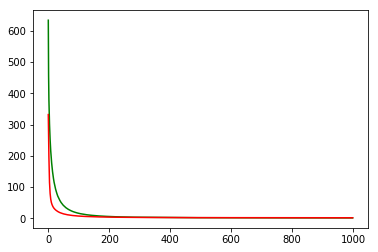

working on d,u and l,le 0.5 256 0.01 0.001


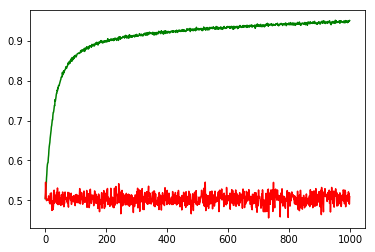

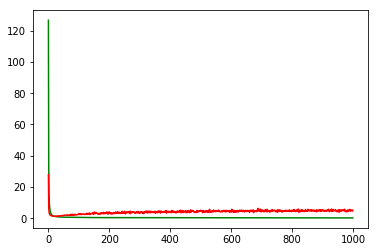

working on d,u and l,le 0.5 256 0.01 0.0001


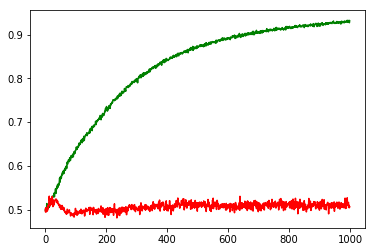

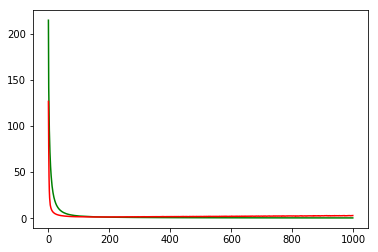

working on d,u and l,le 0.5 256 0.01 1e-05


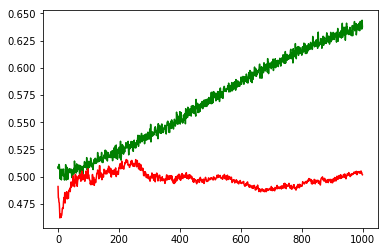

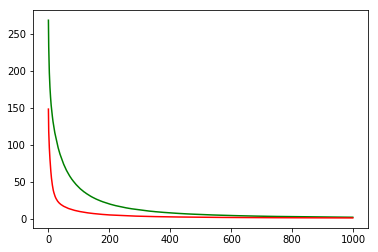

working on d,u and l,le 0.5 256 0.05 0.001


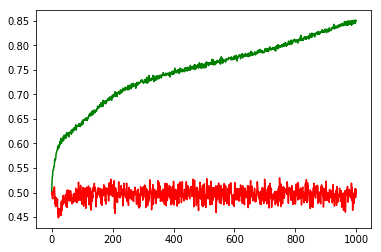

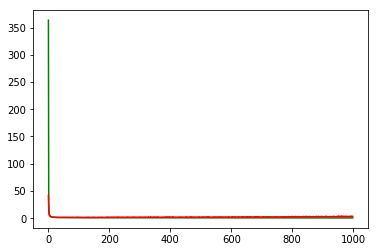

working on d,u and l,le 0.5 256 0.05 0.0001


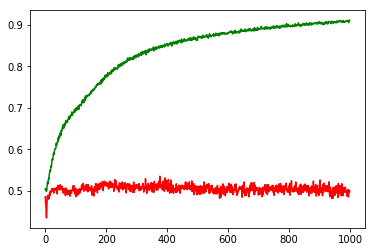

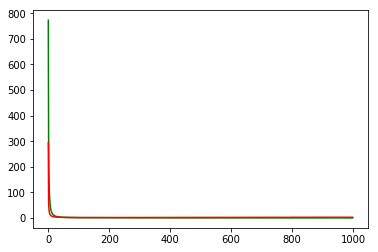

working on d,u and l,le 0.5 256 0.05 1e-05


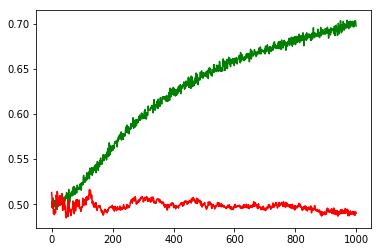

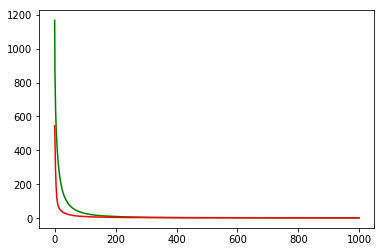

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: AMZN


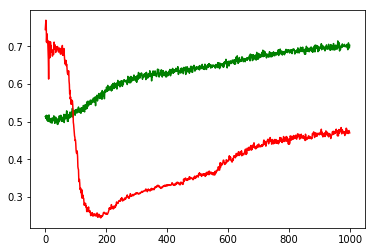

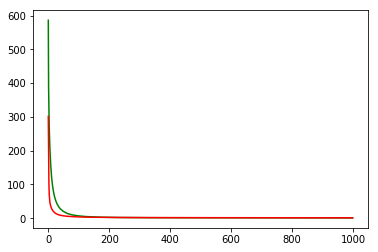

F1,score 0.5792426367461431
G-score: 0.47143702944459964
Accuracy 0.46996466515342256
Window: 140
[[119 132]
 [468 413]]
Vol pos 2.238432222729217
Vol neg 2.473341277513239
Real Percentage of gain: 15.389097001164592
Percentage of gain: -0.2589742261625443
Total gain: -293.15882401600015
000000000000000000000000000000000000000000000000
Percentile:  0
[[113  86]
 [237 194]]
630/630 [==============================] - 0s 25us/step
[0.9022512937348987, 0.4873015863554818]
Percentile:  1
[[  4  32]
 [175 174]]
385/385 [==============================] - 0s 28us/step
[0.8844410600600304, 0.4623376623376623]
Percentile:  2
[[ 2 14]
 [28 32]]
76/76 [==============================] - 0s 39us/step
[0.8301688777773004, 0.4473684194840883]
Percentile:  3
[[ 0  0]
 [23 10]]
33/33 [==============================] - 0s 75us/step
[0.9864382274223097, 0.30303030303030304]
Percentile:  4
[[0 0]
 [5 1]]
6/6 [==============================] - 0s 170us/step
[0.8831586241722107, 0.1666666716337204]
000000000

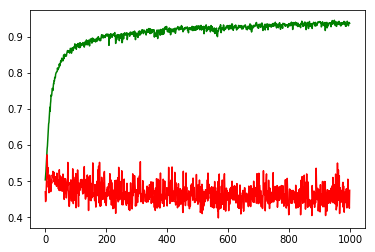

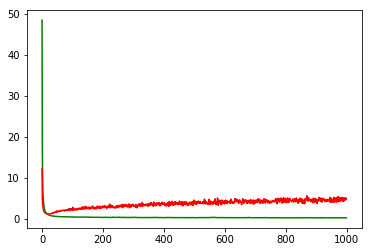

working on d,u and l,le 0.5 64 0.01 0.0001


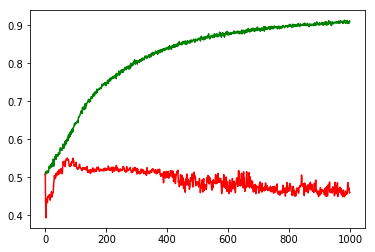

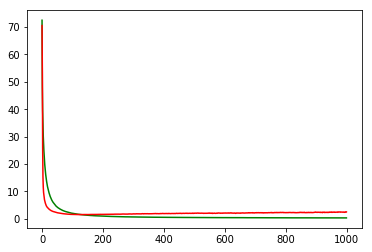

working on d,u and l,le 0.5 64 0.01 1e-05


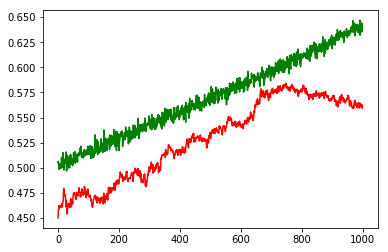

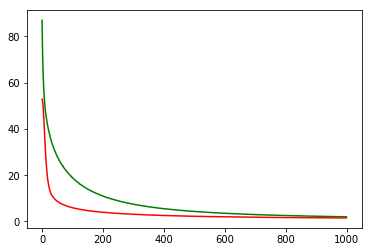

working on d,u and l,le 0.5 64 0.05 0.001


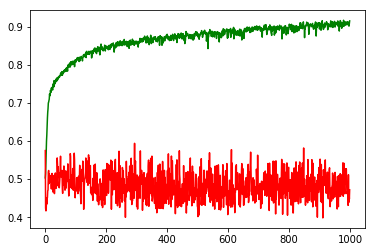

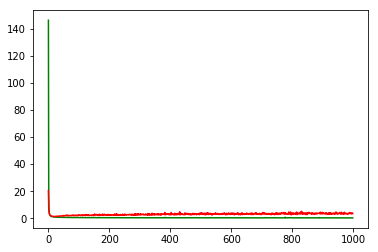

working on d,u and l,le 0.5 64 0.05 0.0001


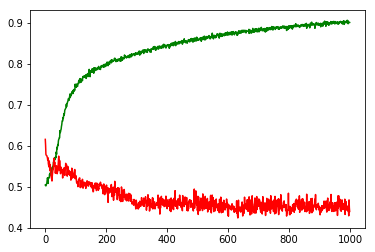

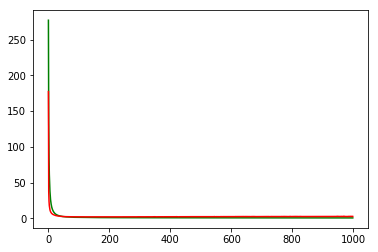

working on d,u and l,le 0.5 64 0.05 1e-05


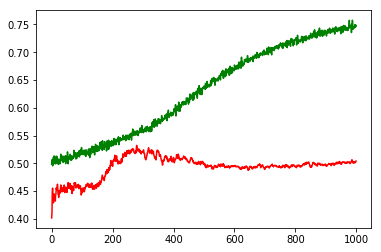

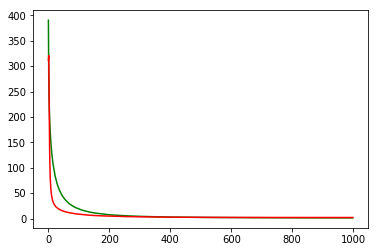

working on d,u and l,le 0.5 128 0.01 0.001


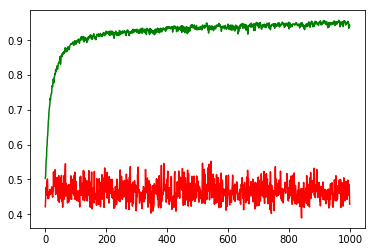

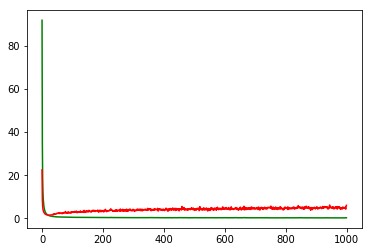

working on d,u and l,le 0.5 128 0.01 0.0001


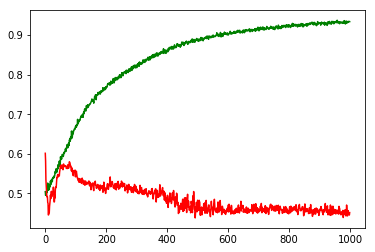

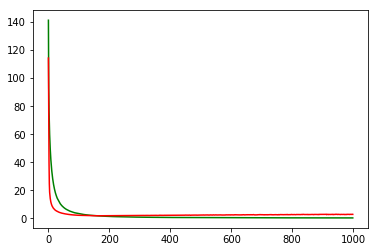

working on d,u and l,le 0.5 128 0.01 1e-05


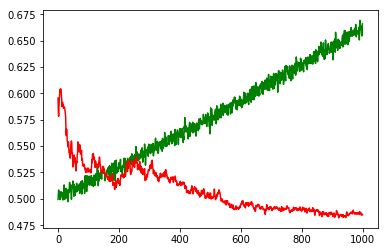

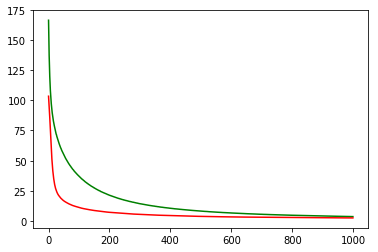

working on d,u and l,le 0.5 128 0.05 0.001


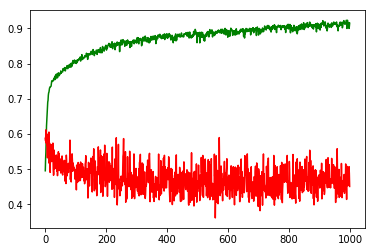

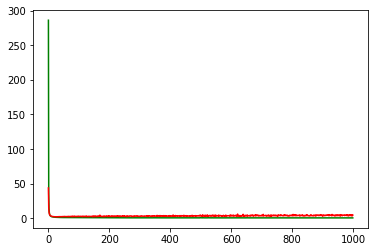

working on d,u and l,le 0.5 128 0.05 0.0001


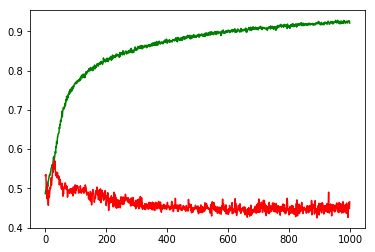

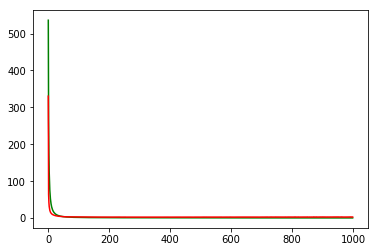

working on d,u and l,le 0.5 128 0.05 1e-05


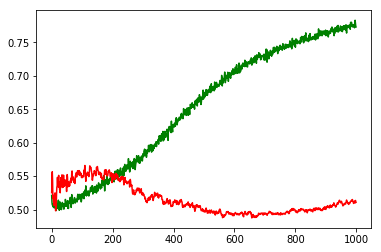

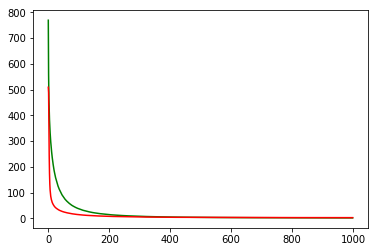

working on d,u and l,le 0.5 256 0.01 0.001


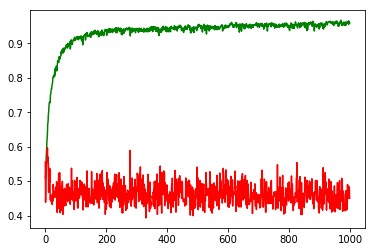

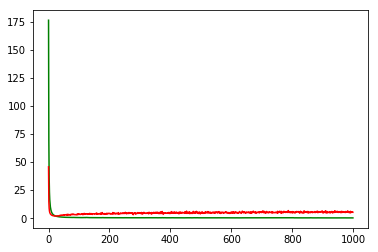

working on d,u and l,le 0.5 256 0.01 0.0001


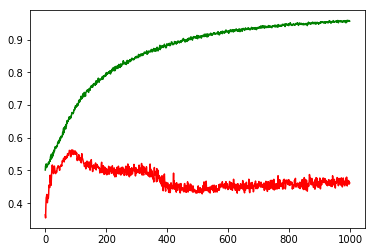

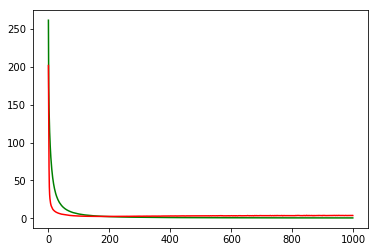

working on d,u and l,le 0.5 256 0.01 1e-05


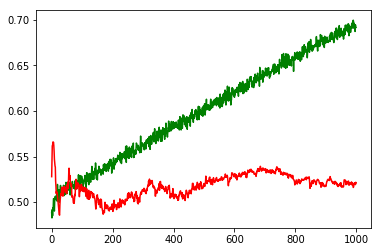

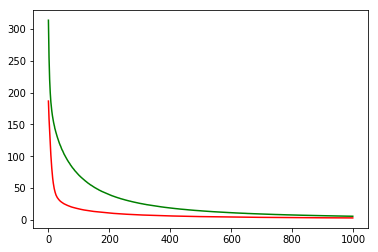

working on d,u and l,le 0.5 256 0.05 0.001


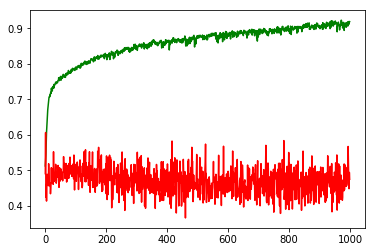

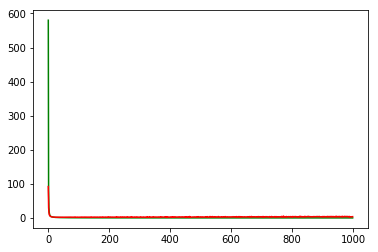

working on d,u and l,le 0.5 256 0.05 0.0001


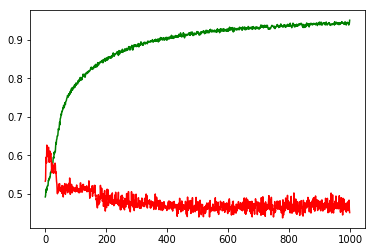

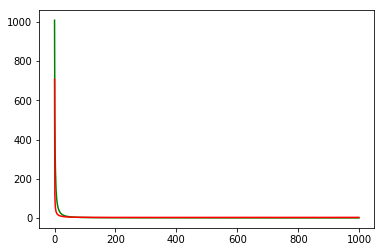

working on d,u and l,le 0.5 256 0.05 1e-05


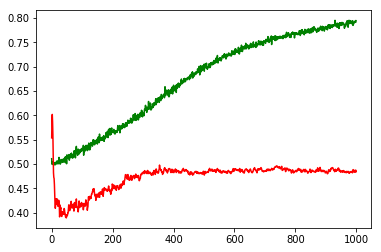

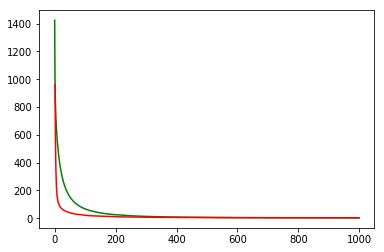

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: PEP


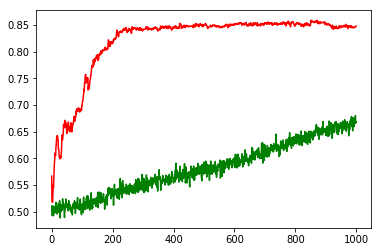

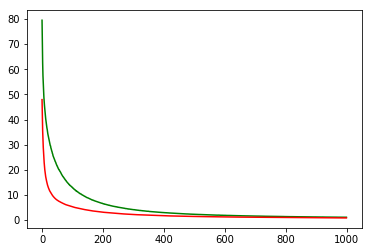

F1,score 0.9108910891089109
G-score: 0.675833109920399
Accuracy 0.8479262675100024
Window: 140
[[ 46  45]
 [ 54 506]]
Vol pos 2.276353703118698
Vol neg 1.0008549328209304
Real Percentage of gain: 110.93016688929849
Percentage of gain: 1.7779763529527632
Total gain: 1157.462605772249
000000000000000000000000000000000000000000000000
Percentile:  0
[[32 40]
 [12 98]]
182/182 [==============================] - 0s 31us/step
[0.6920386133613167, 0.7142857110107338]
Percentile:  1
[[ 14   5]
 [ 40 102]]
161/161 [==============================] - 0s 35us/step
[0.6693255168310603, 0.7204968944099379]
Percentile:  2
[[  0   0]
 [  2 184]]
186/186 [==============================] - 0s 27us/step
[0.4287518794818591, 0.9892473124688671]
Percentile:  3
[[76]]
76/76 [==============================] - 0s 41us/step
[0.32858223350424515, 1.0]
Percentile:  4
[[45]]
45/45 [==============================] - 0s 74us/step
[0.27382283475663927, 1.0]
000000000000000000000000000000000000000000000000
Working on.

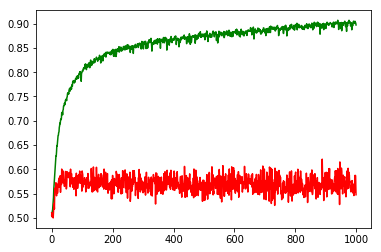

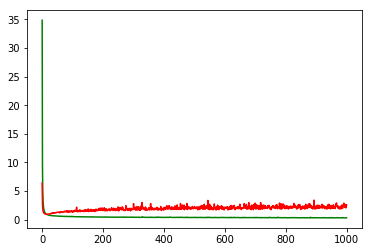

working on d,u and l,le 0.5 64 0.01 0.0001


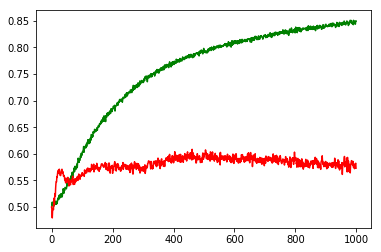

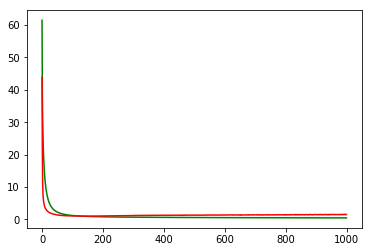

working on d,u and l,le 0.5 64 0.01 1e-05


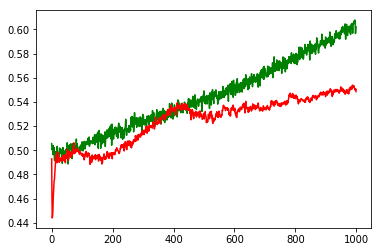

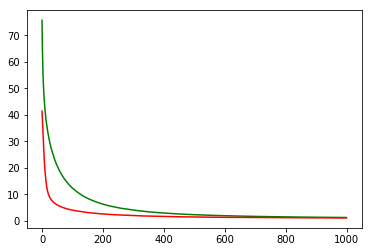

working on d,u and l,le 0.5 64 0.05 0.001


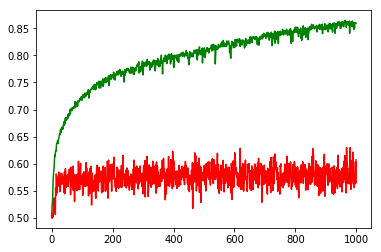

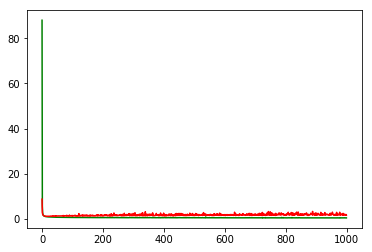

working on d,u and l,le 0.5 64 0.05 0.0001


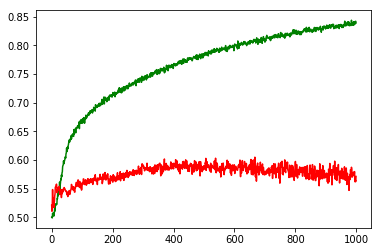

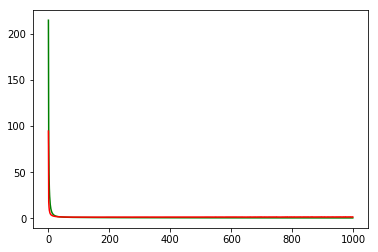

working on d,u and l,le 0.5 64 0.05 1e-05


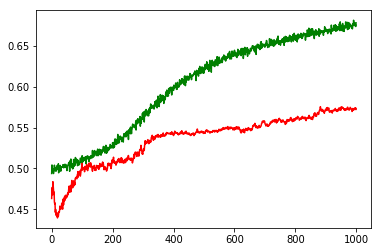

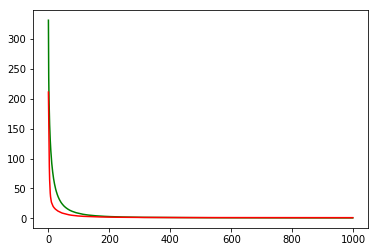

working on d,u and l,le 0.5 128 0.01 0.001


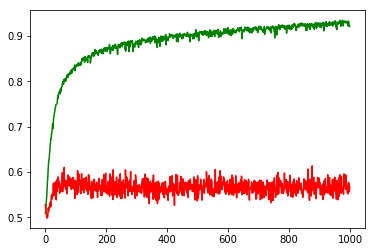

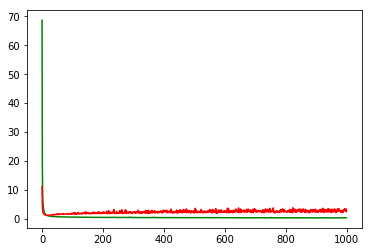

working on d,u and l,le 0.5 128 0.01 0.0001


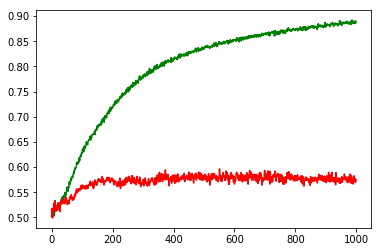

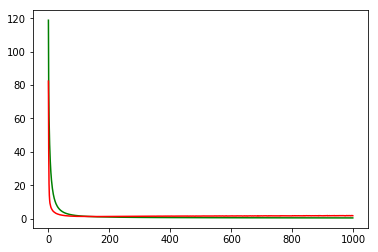

working on d,u and l,le 0.5 128 0.01 1e-05


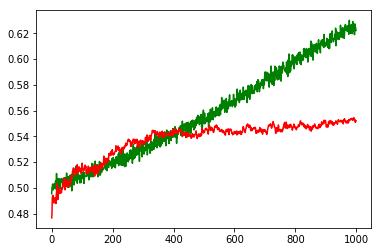

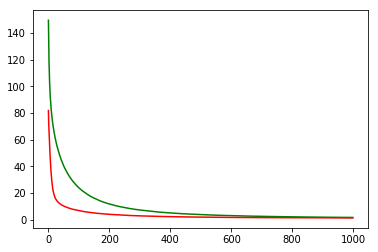

working on d,u and l,le 0.5 128 0.05 0.001


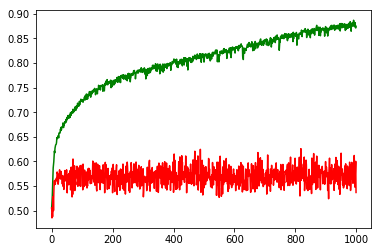

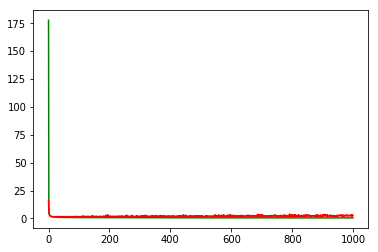

working on d,u and l,le 0.5 128 0.05 0.0001


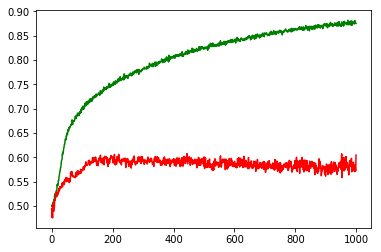

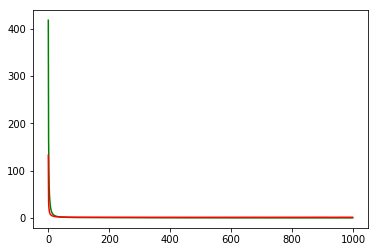

working on d,u and l,le 0.5 128 0.05 1e-05


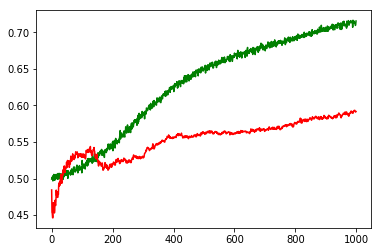

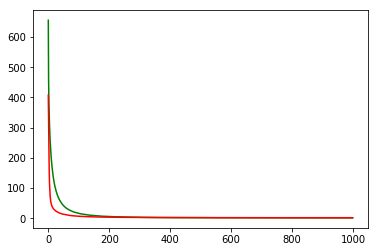

working on d,u and l,le 0.5 256 0.01 0.001


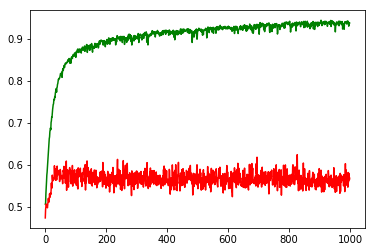

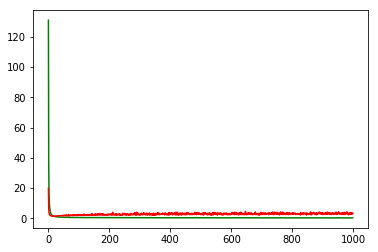

working on d,u and l,le 0.5 256 0.01 0.0001


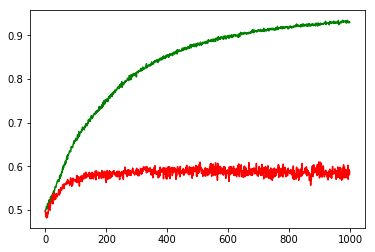

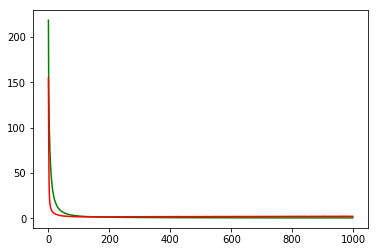

working on d,u and l,le 0.5 256 0.01 1e-05


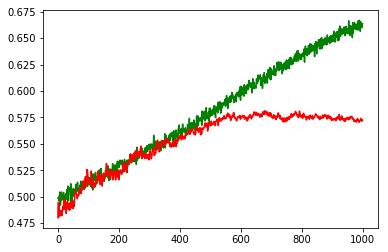

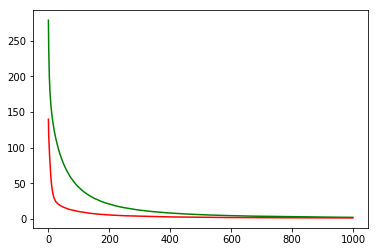

working on d,u and l,le 0.5 256 0.05 0.001


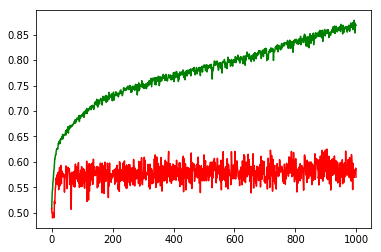

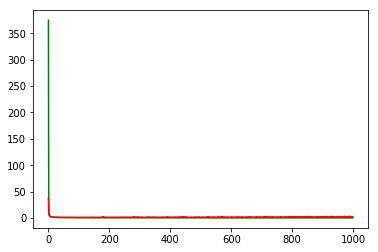

working on d,u and l,le 0.5 256 0.05 0.0001


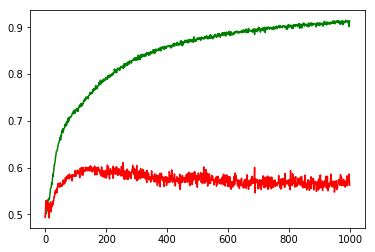

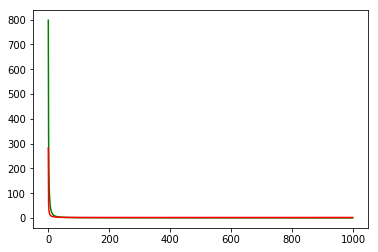

working on d,u and l,le 0.5 256 0.05 1e-05


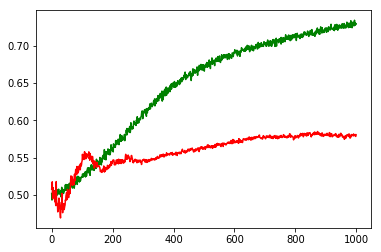

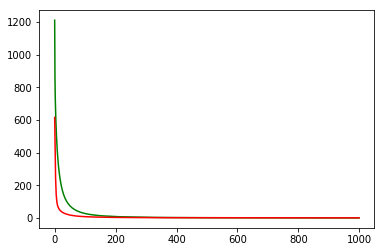

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: GOOGL


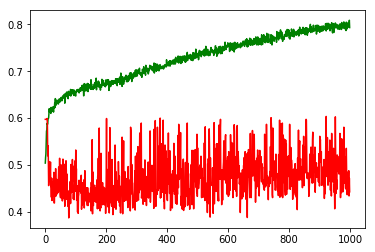

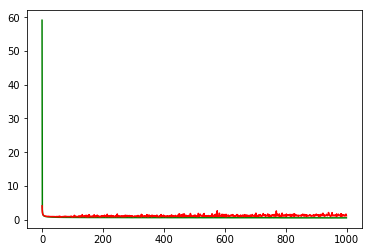

F1,score 0.4741235392320534
G-score: 0.4469186321202817
Accuracy 0.44247787626443713
Window: 140
[[216 239]
 [391 284]]
Vol pos 3.0131605789468954
Vol neg 2.909365076198399
Real Percentage of gain: -28.26561804532763
Percentage of gain: -0.28877850312525993
Total gain: -326.3197085315437
000000000000000000000000000000000000000000000000
Percentile:  0
[[118 114]
 [109  70]]
411/411 [==============================] - 0s 23us/step
[0.9908603452998066, 0.45742092461046513]
Percentile:  1
[[ 53  58]
 [144 108]]
363/363 [==============================] - 0s 27us/step
[1.0803451206401689, 0.44352617079889806]
Percentile:  2
[[42 55]
 [79 30]]
206/206 [==============================] - 0s 29us/step
[1.2273249278948144, 0.34951456310679613]
Percentile:  3
[[ 2 12]
 [49 38]]
101/101 [==============================] - 0s 37us/step
[1.2465917497578234, 0.39603960396039606]
Percentile:  4
[[ 0  0]
 [10 37]]
47/47 [==============================] - 0s 68us/step
[0.4857570452893034, 0.787234043821375

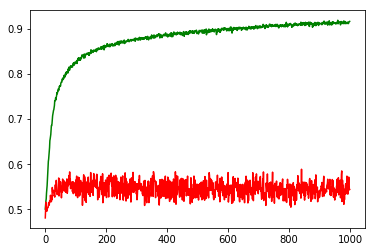

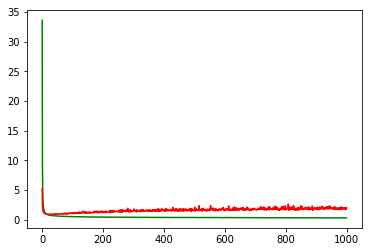

working on d,u and l,le 0.5 64 0.01 0.0001


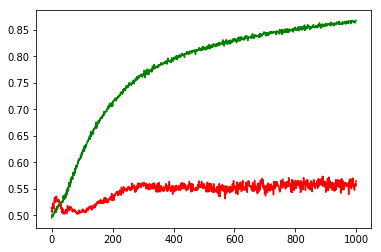

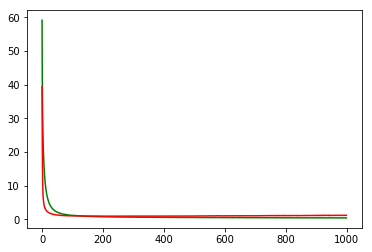

working on d,u and l,le 0.5 64 0.01 1e-05


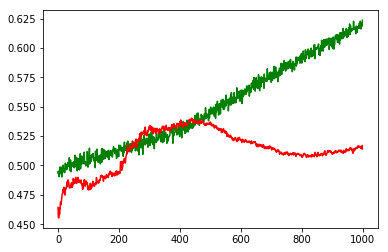

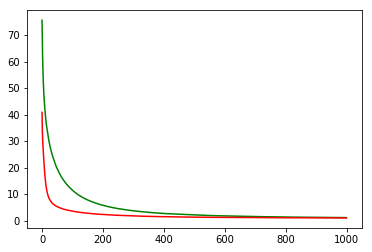

working on d,u and l,le 0.5 64 0.05 0.001


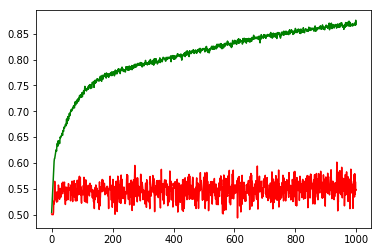

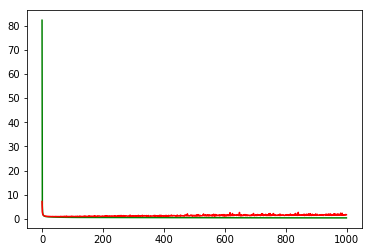

working on d,u and l,le 0.5 64 0.05 0.0001


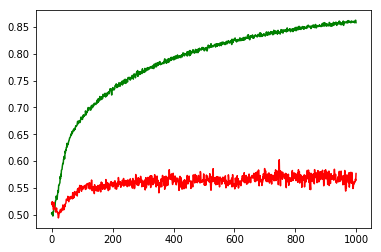

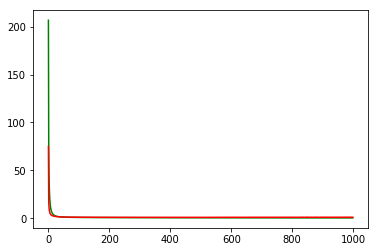

working on d,u and l,le 0.5 64 0.05 1e-05


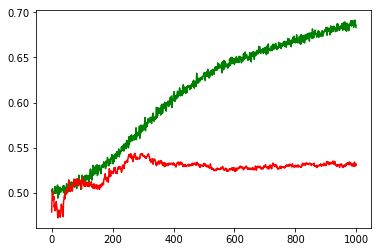

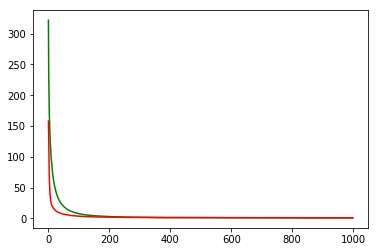

working on d,u and l,le 0.5 128 0.01 0.001


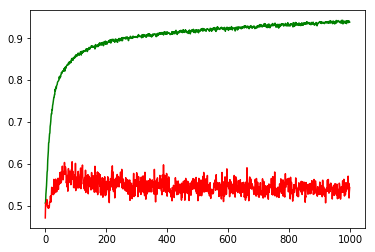

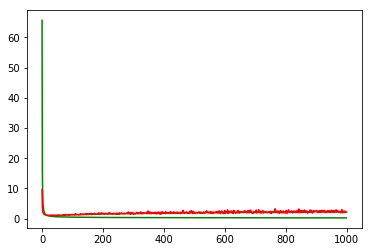

working on d,u and l,le 0.5 128 0.01 0.0001


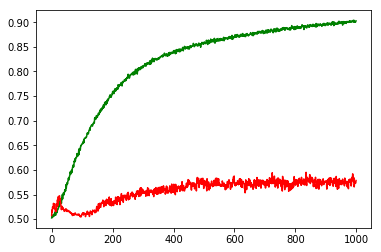

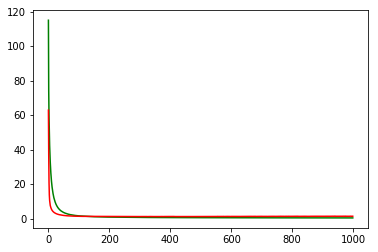

working on d,u and l,le 0.5 128 0.01 1e-05


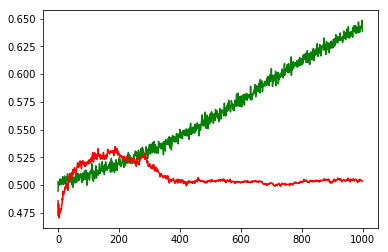

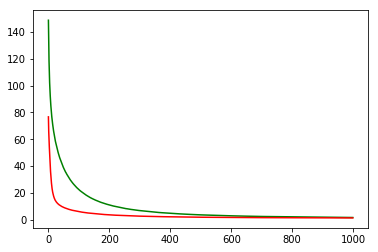

working on d,u and l,le 0.5 128 0.05 0.001


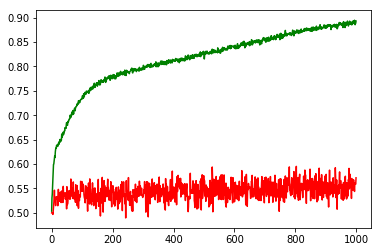

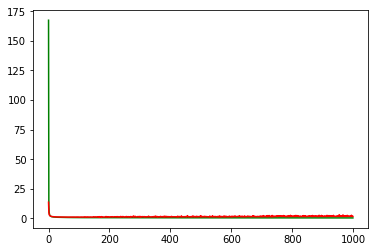

working on d,u and l,le 0.5 128 0.05 0.0001


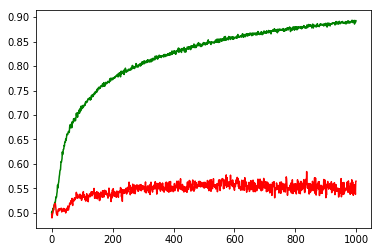

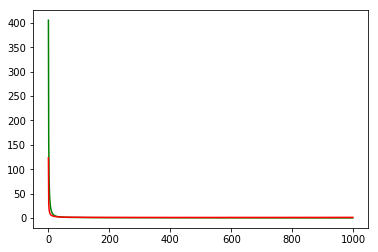

working on d,u and l,le 0.5 128 0.05 1e-05


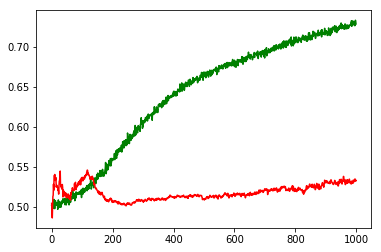

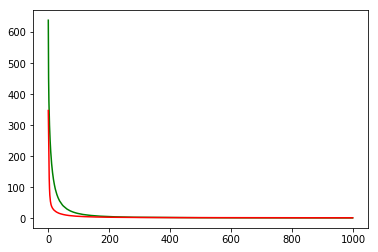

working on d,u and l,le 0.5 256 0.01 0.001


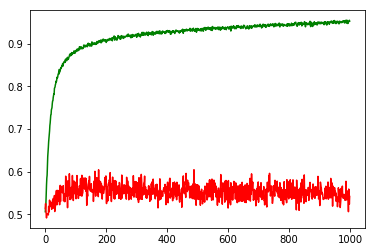

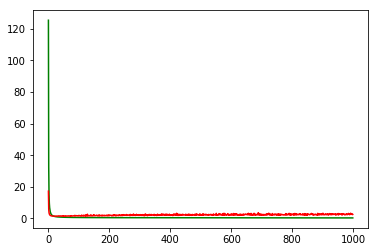

working on d,u and l,le 0.5 256 0.01 0.0001


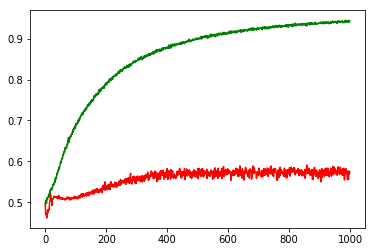

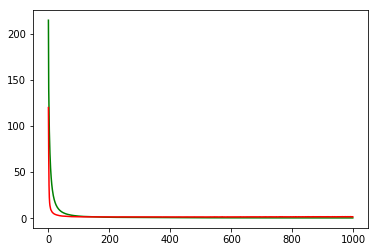

working on d,u and l,le 0.5 256 0.01 1e-05


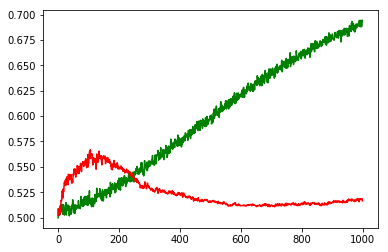

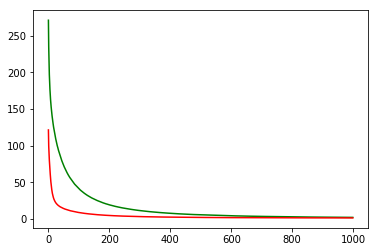

working on d,u and l,le 0.5 256 0.05 0.001


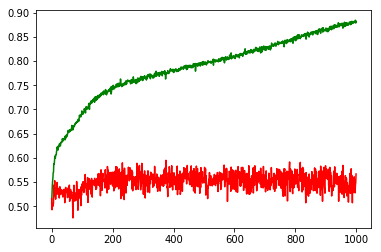

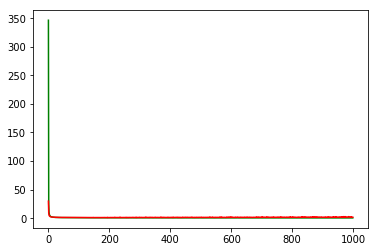

working on d,u and l,le 0.5 256 0.05 0.0001


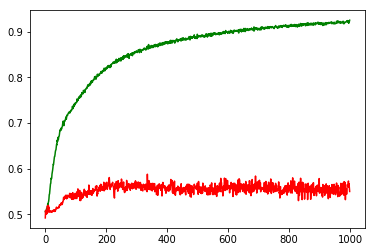

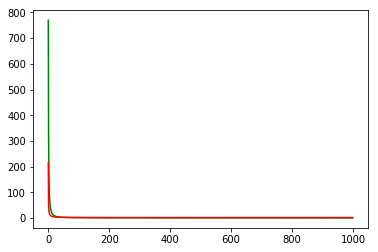

working on d,u and l,le 0.5 256 0.05 1e-05


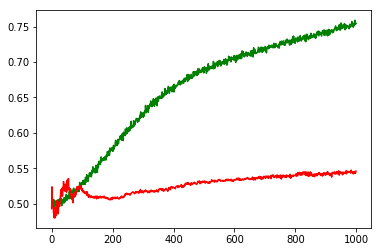

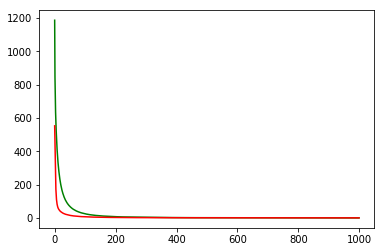

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: MSFT


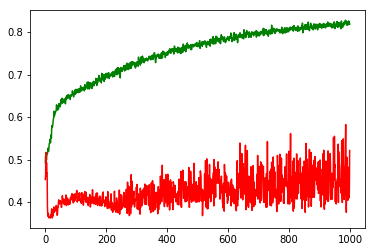

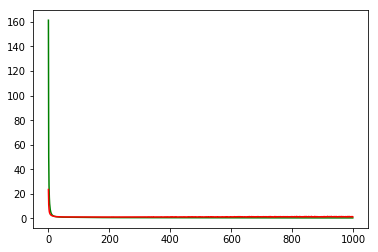

F1,score 0.6007380073800738
G-score: 0.4986445615190232
Accuracy 0.5212389398465115
Window: 140
[[182 237]
 [304 407]]
Vol pos 1.5070161594257454
Vol neg 1.6492457219968426
Real Percentage of gain: 41.34215722319803
Percentage of gain: -0.0040791307066618265
Total gain: -4.609417698527864
000000000000000000000000000000000000000000000000
Percentile:  0
[[139 153]
 [103 149]]
544/544 [==============================] - 0s 22us/step
[1.2098614415701698, 0.5294117647058824]
Percentile:  1
[[ 32  42]
 [ 87 152]]
313/313 [==============================] - 0s 26us/step
[0.9710809495121526, 0.5878594243488373]
Percentile:  2
[[ 9 14]
 [80 60]]
163/163 [==============================] - 0s 37us/step
[1.2658590451340002, 0.4233128836184192]
Percentile:  3
[[ 1 19]
 [29 32]]
81/81 [==============================] - 0s 37us/step
[2.9083575172188842, 0.4074074074074074]
Percentile:  4
[[ 1  9]
 [ 5 13]]
28/28 [==============================] - 0s 26us/step
[3.7261946201324463, 0.5]
00000000000000000

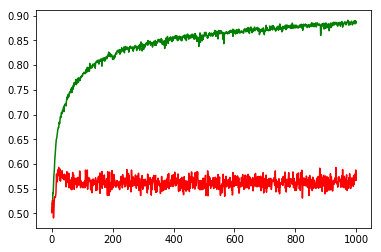

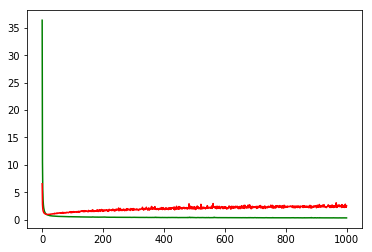

working on d,u and l,le 0.5 64 0.01 0.0001


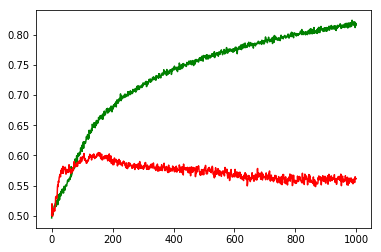

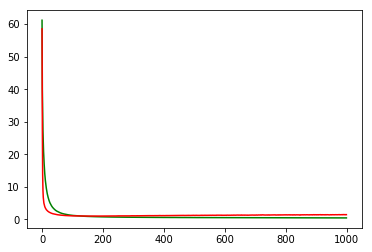

working on d,u and l,le 0.5 64 0.01 1e-05


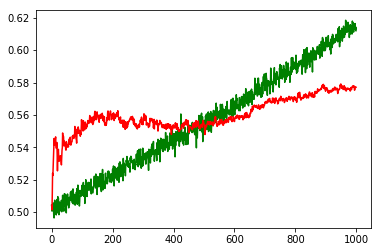

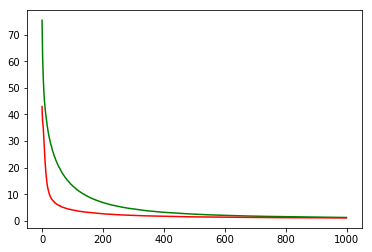

working on d,u and l,le 0.5 64 0.05 0.001


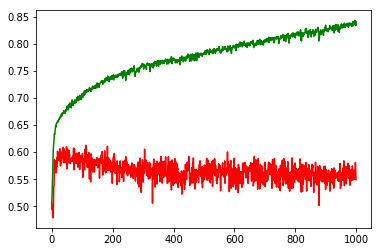

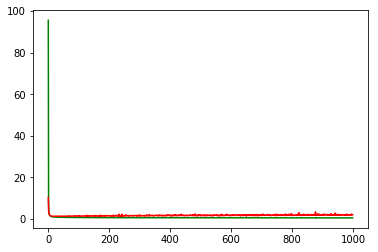

working on d,u and l,le 0.5 64 0.05 0.0001


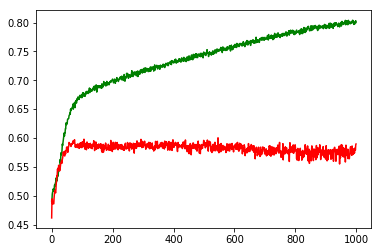

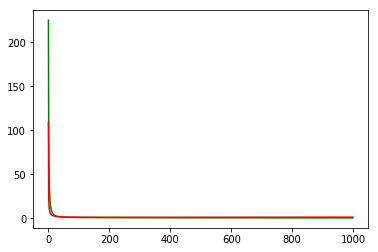

working on d,u and l,le 0.5 64 0.05 1e-05


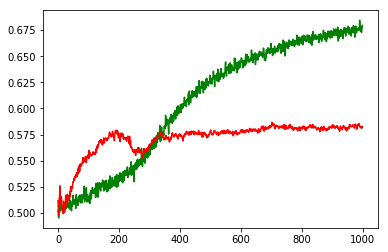

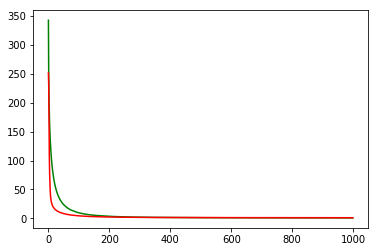

working on d,u and l,le 0.5 128 0.01 0.001


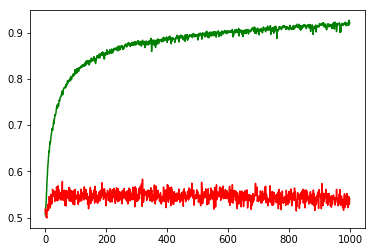

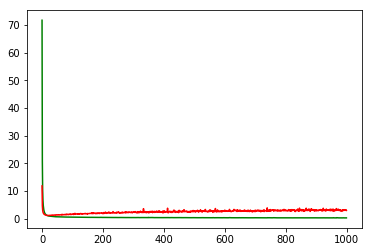

working on d,u and l,le 0.5 128 0.01 0.0001


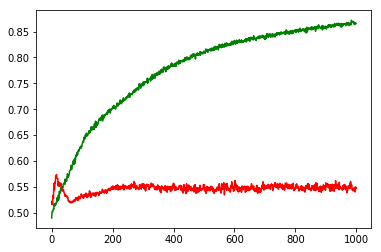

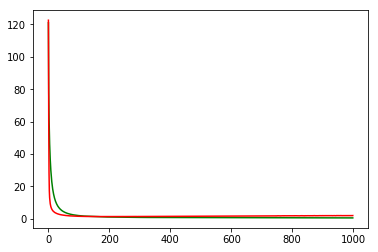

working on d,u and l,le 0.5 128 0.01 1e-05


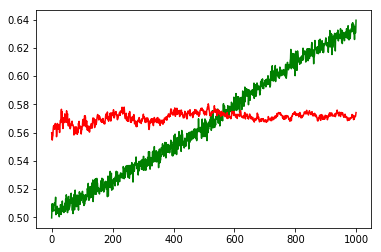

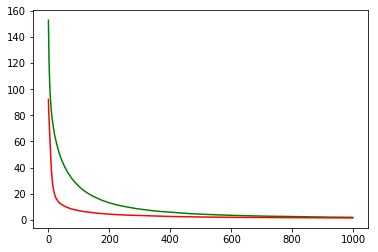

working on d,u and l,le 0.5 128 0.05 0.001


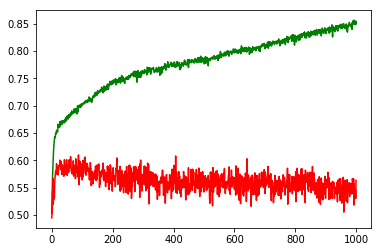

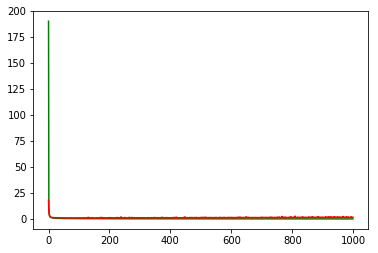

working on d,u and l,le 0.5 128 0.05 0.0001


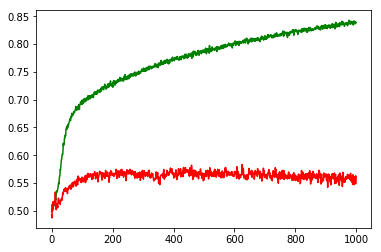

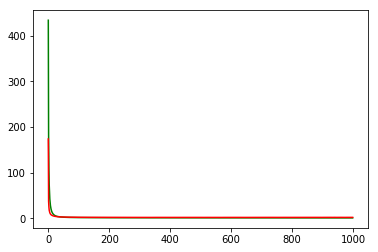

working on d,u and l,le 0.5 128 0.05 1e-05


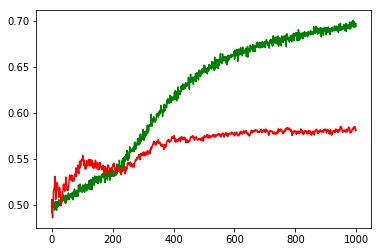

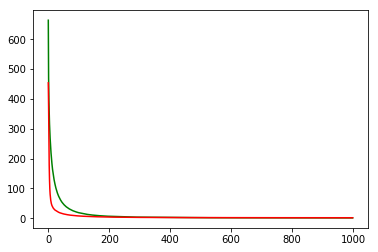

working on d,u and l,le 0.5 256 0.01 0.001


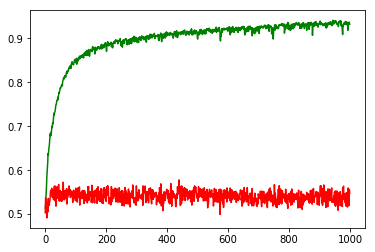

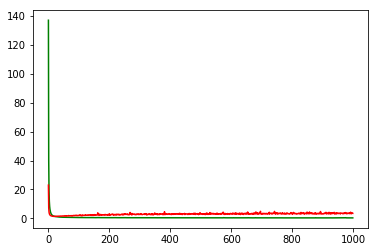

working on d,u and l,le 0.5 256 0.01 0.0001


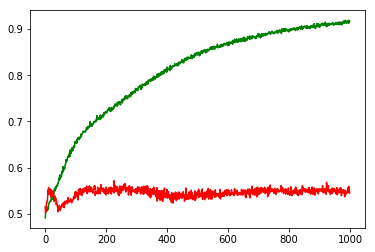

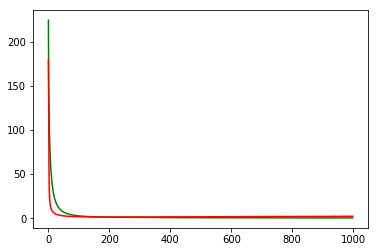

working on d,u and l,le 0.5 256 0.01 1e-05


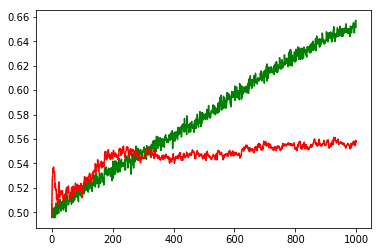

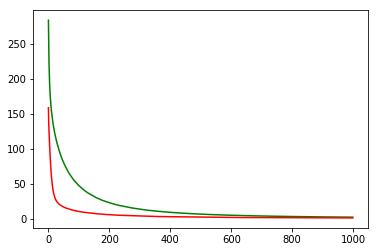

working on d,u and l,le 0.5 256 0.05 0.001


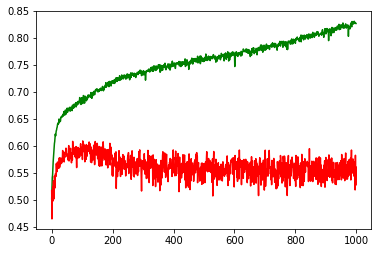

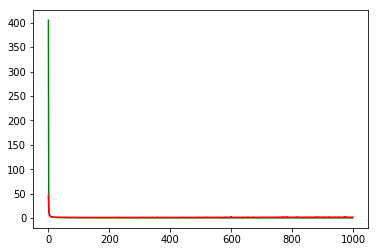

working on d,u and l,le 0.5 256 0.05 0.0001


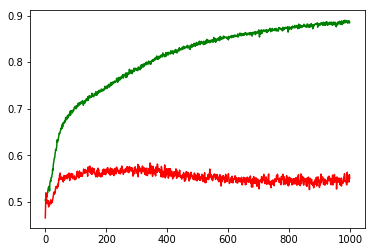

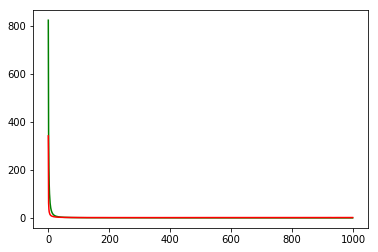

working on d,u and l,le 0.5 256 0.05 1e-05


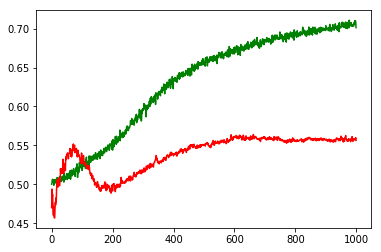

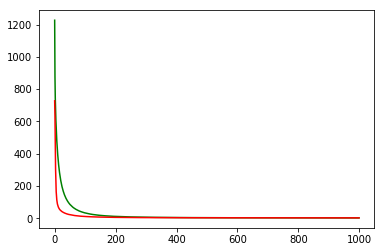

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: FB


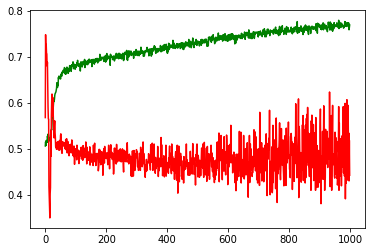

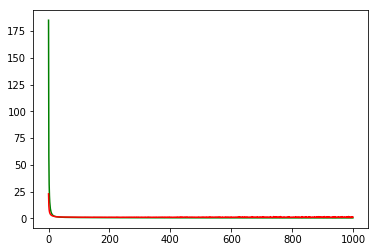

F1,score 0.4806584362139918
G-score: 0.51674562253381
Accuracy 0.44257950530035334
Window: 140
[[209  54]
 [577 292]]
Vol pos 3.245341977938973
Vol neg 2.9445417886394605
Real Percentage of gain: -106.56382183044435
Percentage of gain: -0.20502609336048921
Total gain: -232.08953768407378
000000000000000000000000000000000000000000000000
Percentile:  0
[[203   9]
 [272  38]]
522/522 [==============================] - 0s 27us/step
[1.2639984107108866, 0.4616858237547893]
Percentile:  1
[[  4  33]
 [260 171]]
468/468 [==============================] - 0s 26us/step
[1.4872829822393565, 0.37393162393162394]
Percentile:  2
[[ 1 12]
 [45 47]]
105/105 [==============================] - 0s 42us/step
[1.0761486916314988, 0.45714285721381503]
Percentile:  3
[[14]]
14/14 [==============================] - 0s 48us/step
[0.11198582500219345, 1.0]
Percentile:  4
[[21]]
21/21 [==============================] - 0s 36us/step
[0.08830349892377853, 1.0]
000000000000000000000000000000000000000000000000
Work

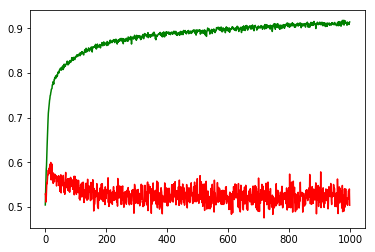

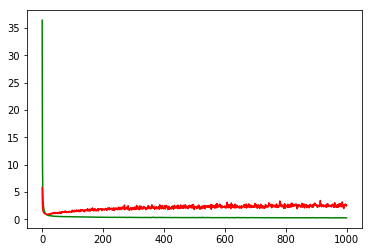

working on d,u and l,le 0.5 64 0.01 0.0001


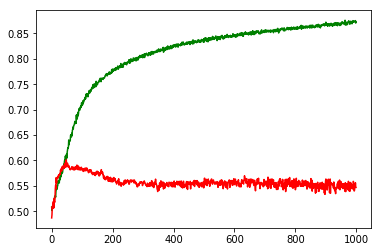

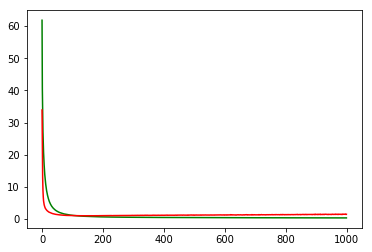

working on d,u and l,le 0.5 64 0.01 1e-05


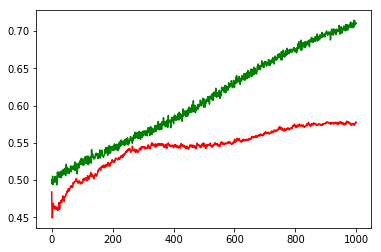

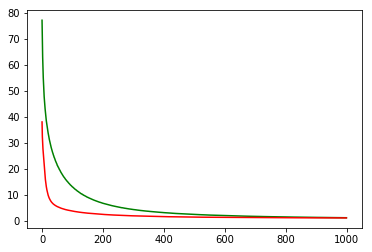

working on d,u and l,le 0.5 64 0.05 0.001


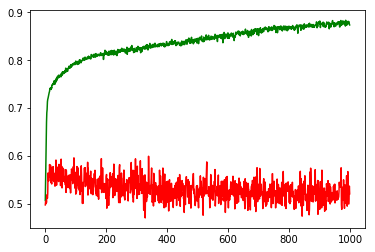

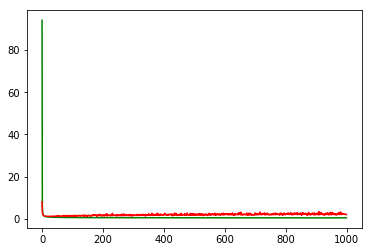

working on d,u and l,le 0.5 64 0.05 0.0001


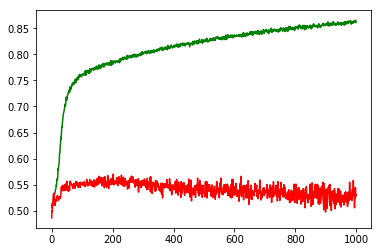

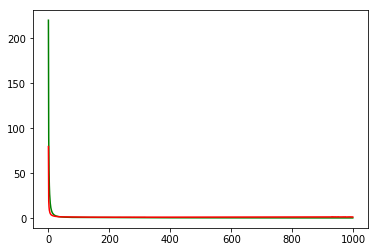

working on d,u and l,le 0.5 64 0.05 1e-05


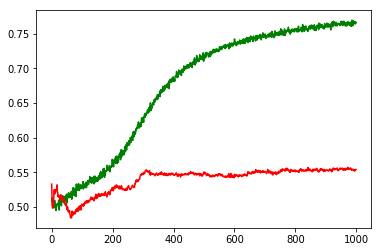

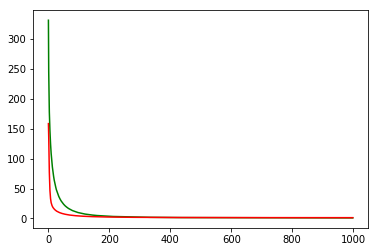

working on d,u and l,le 0.5 128 0.01 0.001


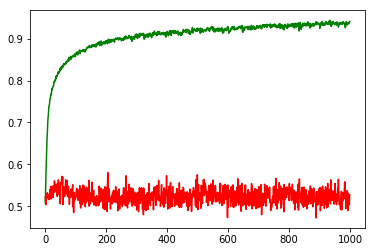

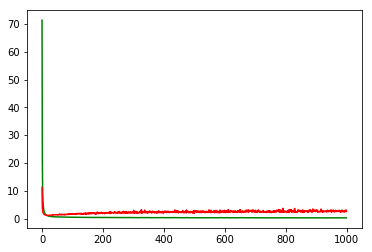

working on d,u and l,le 0.5 128 0.01 0.0001


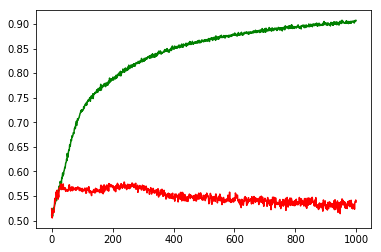

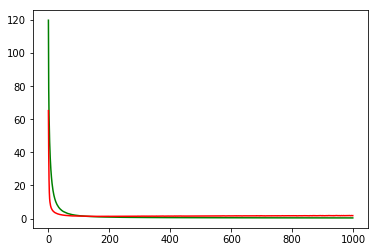

working on d,u and l,le 0.5 128 0.01 1e-05


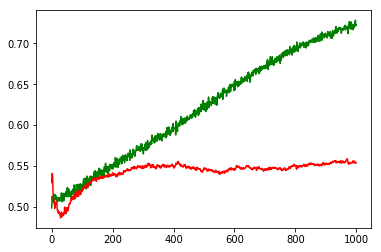

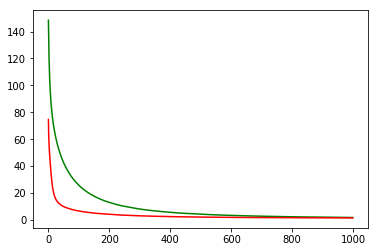

working on d,u and l,le 0.5 128 0.05 0.001


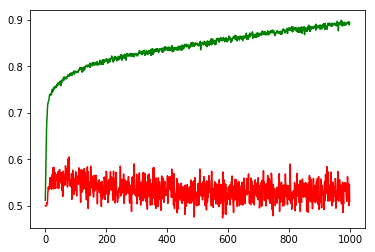

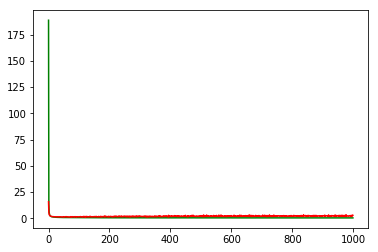

working on d,u and l,le 0.5 128 0.05 0.0001


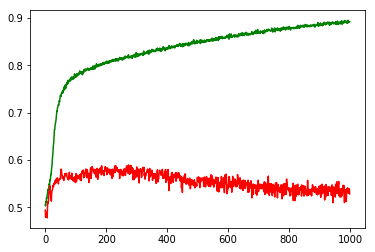

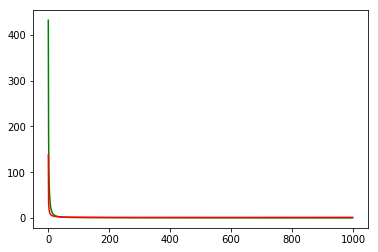

working on d,u and l,le 0.5 128 0.05 1e-05


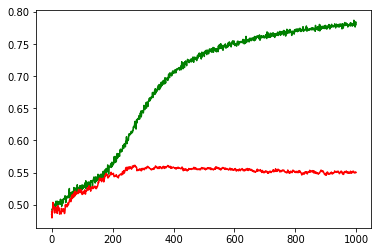

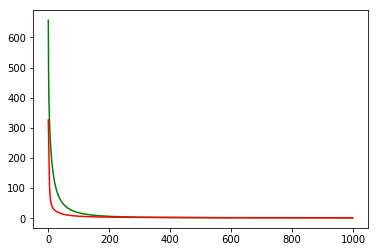

working on d,u and l,le 0.5 256 0.01 0.001


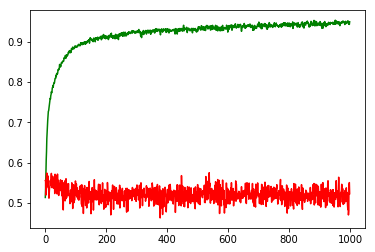

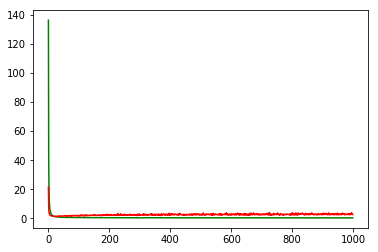

working on d,u and l,le 0.5 256 0.01 0.0001


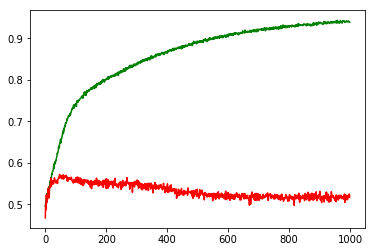

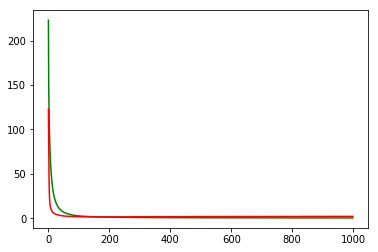

working on d,u and l,le 0.5 256 0.01 1e-05


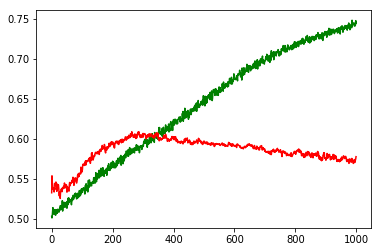

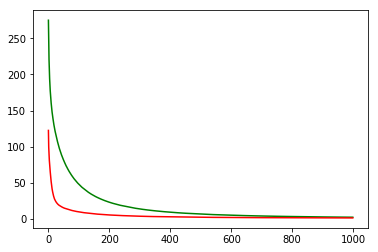

working on d,u and l,le 0.5 256 0.05 0.001


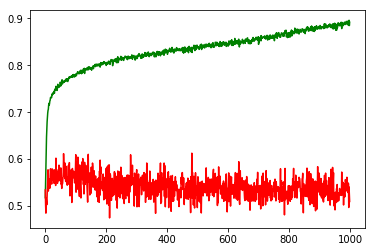

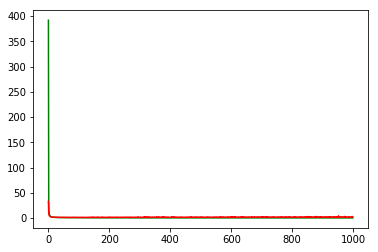

working on d,u and l,le 0.5 256 0.05 0.0001


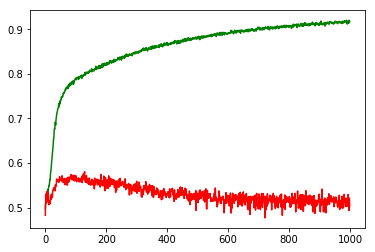

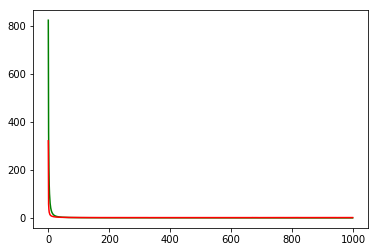

working on d,u and l,le 0.5 256 0.05 1e-05


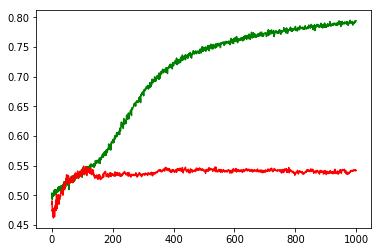

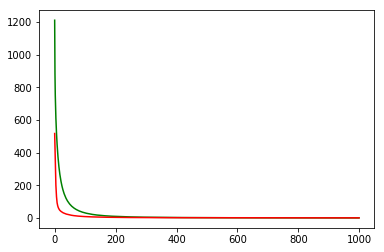

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: INTC


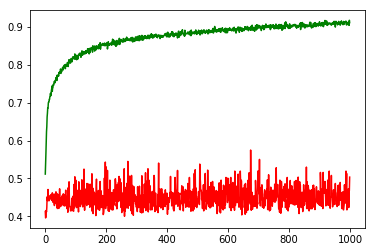

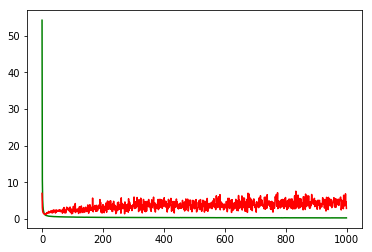

F1,score 0.3891304347826087
G-score: 0.47791189091752845
Accuracy 0.5035335663771882
Window: 140
[[391  57]
 [505 179]]
Vol pos 2.7422943869408414
Vol neg 1.912596709639161
Real Percentage of gain: -22.198191080314643
Percentage of gain: 0.431297217083985
Total gain: 488.228449739071
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 89  27]
 [205  33]]
354/354 [==============================] - 0s 28us/step
[4.459773159296499, 0.3446327683615819]
Percentile:  1
[[ 99  15]
 [166  62]]
342/342 [==============================] - 0s 27us/step
[2.515332571944298, 0.4707602328724331]
Percentile:  2
[[112  15]
 [ 91  60]]
278/278 [==============================] - 0s 34us/step
[1.9178555643172572, 0.6187050359712231]
Percentile:  3
[[63  0]
 [34 17]]
114/114 [==============================] - 0s 34us/step
[1.2219010642484616, 0.7017543859649122]
Percentile:  4
[[28  0]
 [ 7  7]]
42/42 [==============================] - 0s 57us/step
[0.3311524409357281, 0.8333333333333334]
000

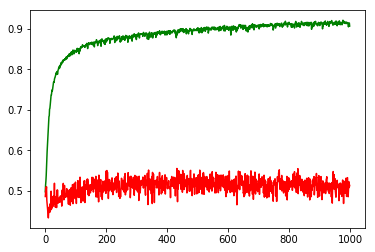

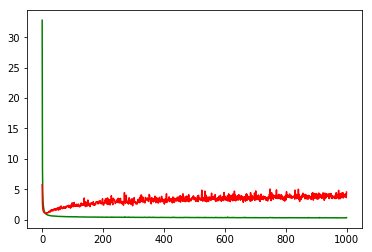

working on d,u and l,le 0.5 64 0.01 0.0001


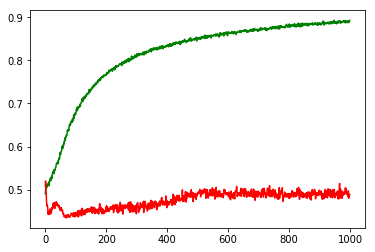

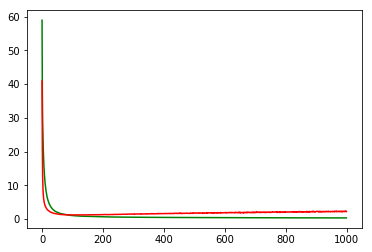

working on d,u and l,le 0.5 64 0.01 1e-05


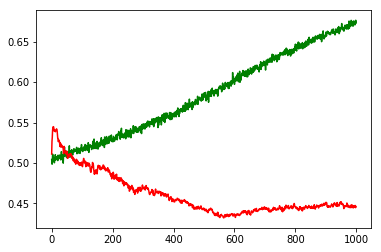

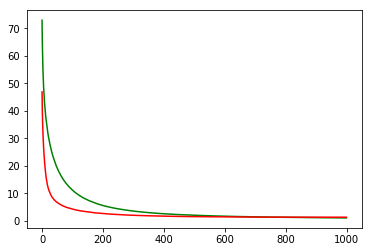

working on d,u and l,le 0.5 64 0.05 0.001


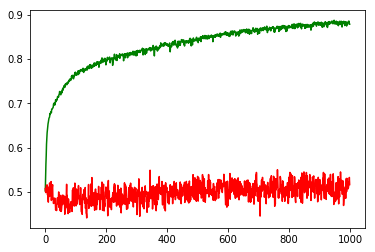

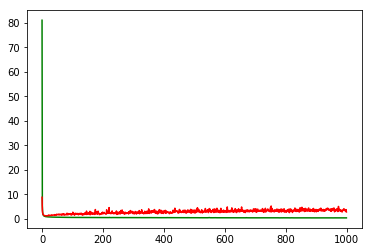

working on d,u and l,le 0.5 64 0.05 0.0001


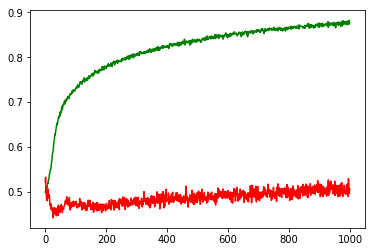

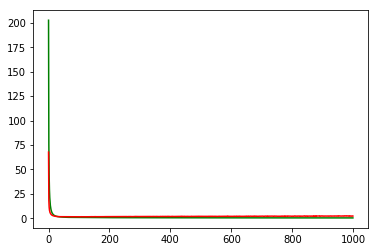

working on d,u and l,le 0.5 64 0.05 1e-05


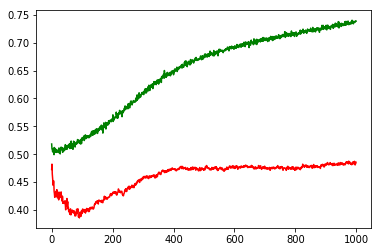

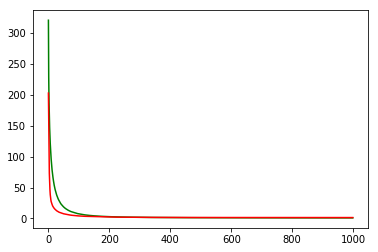

working on d,u and l,le 0.5 128 0.01 0.001


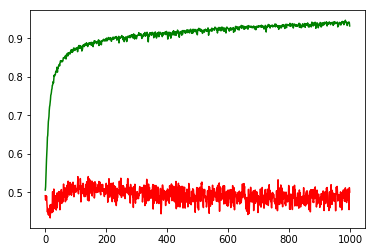

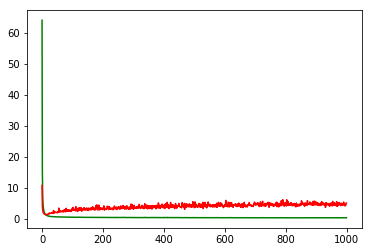

working on d,u and l,le 0.5 128 0.01 0.0001


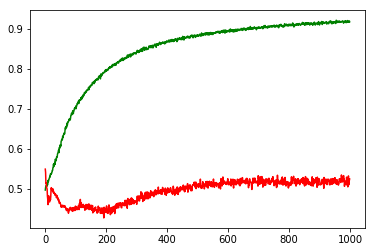

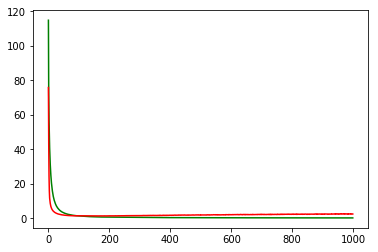

working on d,u and l,le 0.5 128 0.01 1e-05


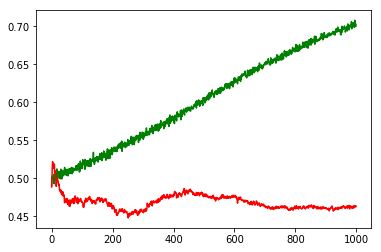

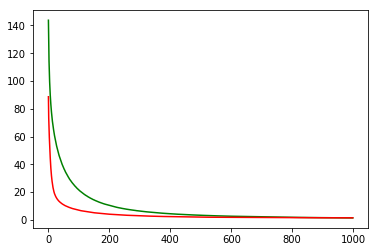

working on d,u and l,le 0.5 128 0.05 0.001


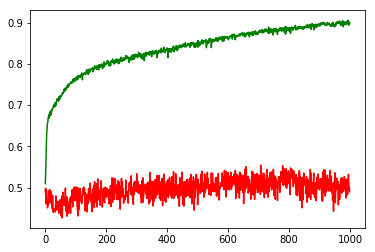

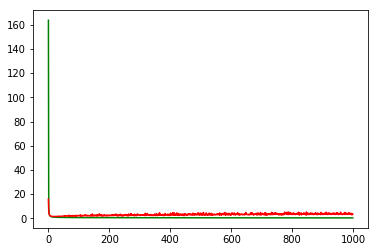

working on d,u and l,le 0.5 128 0.05 0.0001


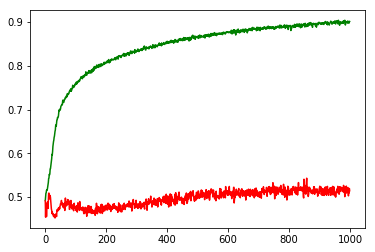

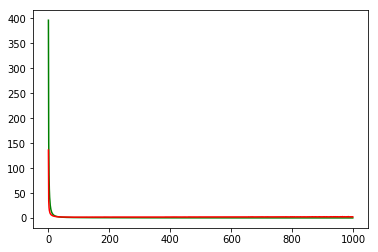

working on d,u and l,le 0.5 128 0.05 1e-05


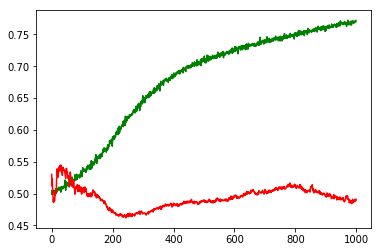

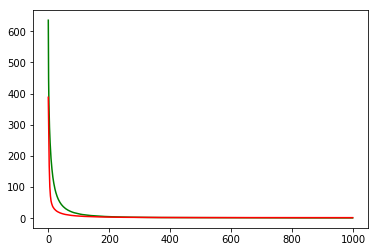

working on d,u and l,le 0.5 256 0.01 0.001


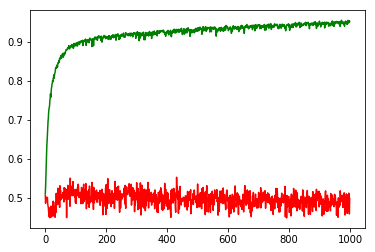

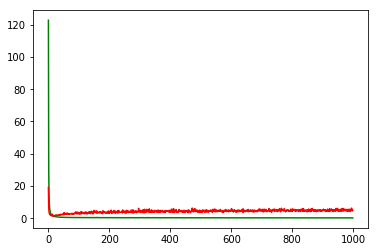

working on d,u and l,le 0.5 256 0.01 0.0001


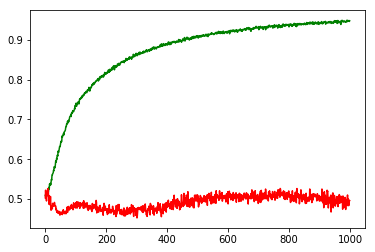

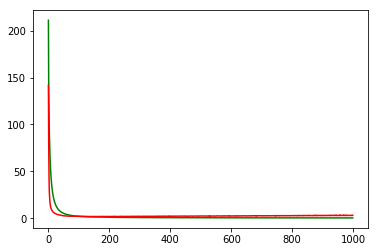

working on d,u and l,le 0.5 256 0.01 1e-05


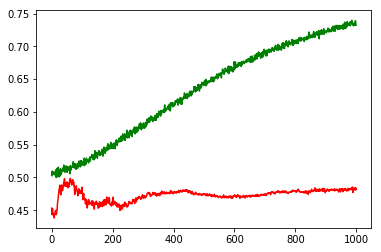

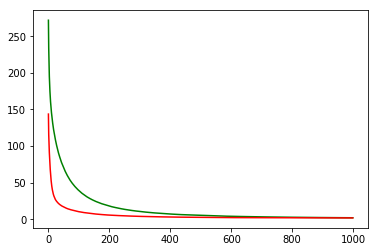

working on d,u and l,le 0.5 256 0.05 0.001


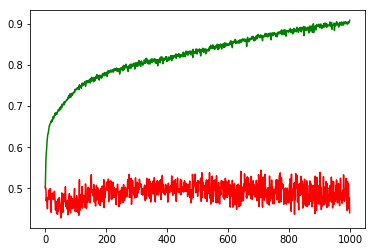

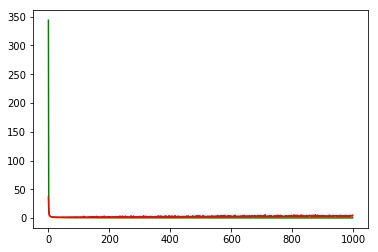

working on d,u and l,le 0.5 256 0.05 0.0001


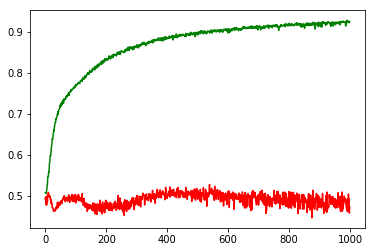

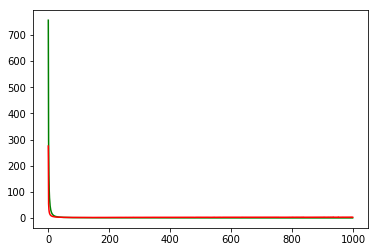

working on d,u and l,le 0.5 256 0.05 1e-05


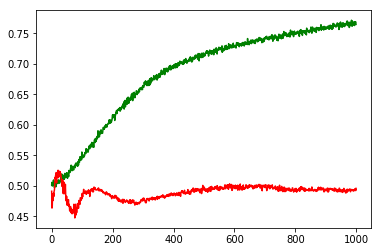

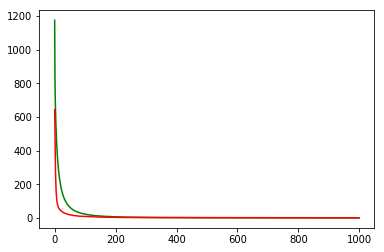

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: CSCO


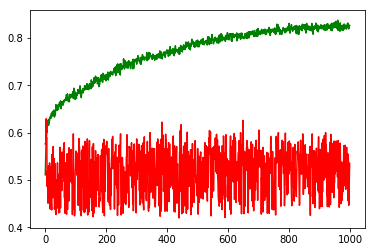

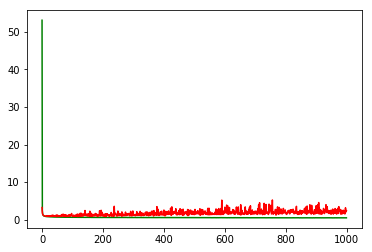

F1,score 0.6293408929836996
G-score: 0.4764017367719031
Accuracy 0.535111108885871
Window: 140
[[158 319]
 [204 444]]
Vol pos 1.9751682766097276
Vol neg 1.6878866417816207
Real Percentage of gain: 34.23770904061341
Percentage of gain: 0.27225474565979413
Total gain: 306.2865888672684
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 60 160]
 [125 171]]
516/516 [==============================] - 0s 22us/step
[2.8525766624036684, 0.4476744186046512]
Percentile:  1
[[ 29  67]
 [ 53 174]]
323/323 [==============================] - 0s 26us/step
[1.4617533750209277, 0.628482972136223]
Percentile:  2
[[22 28]
 [17 71]]
138/138 [==============================] - 0s 30us/step
[1.212422946225042, 0.6739130452059318]
Percentile:  3
[[20 38]
 [ 8 20]]
86/86 [==============================] - 0s 36us/step
[2.9316080670024074, 0.46511628010938333]
Percentile:  4
[[26 26]
 [ 0  6]]
58/58 [==============================] - 0s 29us/step
[2.4357159055512527, 0.5517241381879511]
00000000

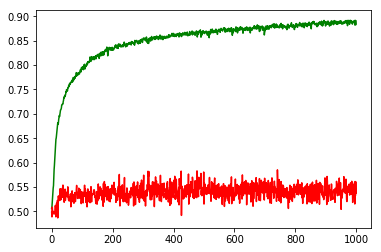

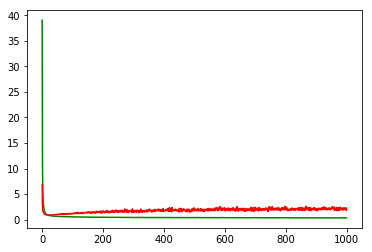

working on d,u and l,le 0.5 64 0.01 0.0001


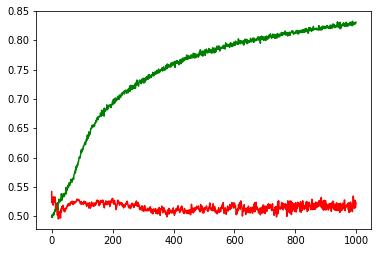

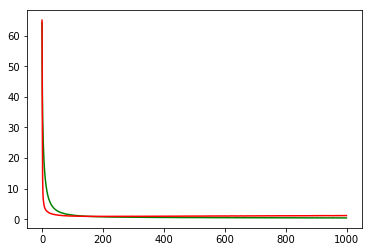

working on d,u and l,le 0.5 64 0.01 1e-05


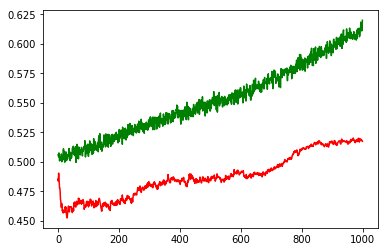

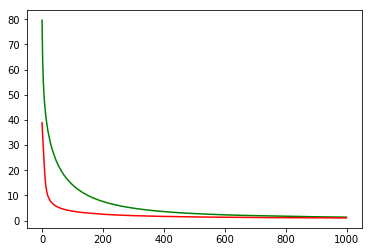

working on d,u and l,le 0.5 64 0.05 0.001


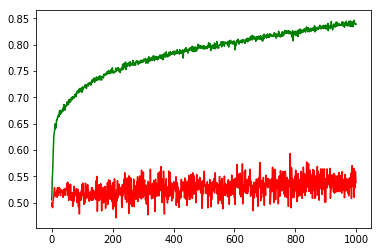

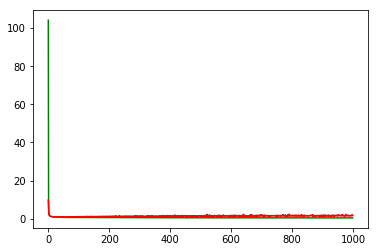

working on d,u and l,le 0.5 64 0.05 0.0001


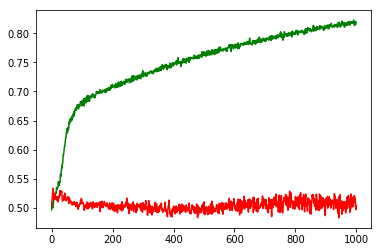

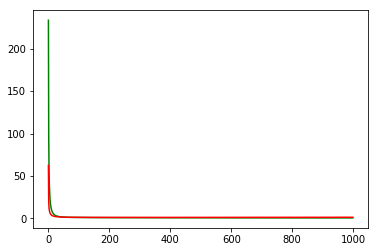

working on d,u and l,le 0.5 64 0.05 1e-05


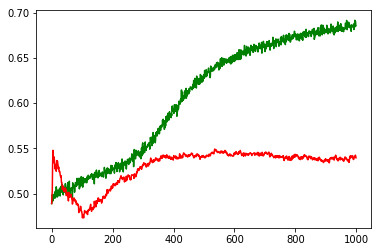

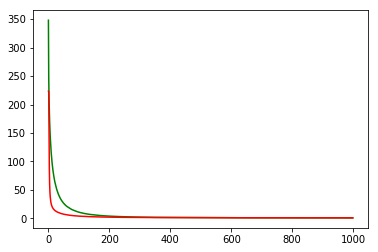

working on d,u and l,le 0.5 128 0.01 0.001


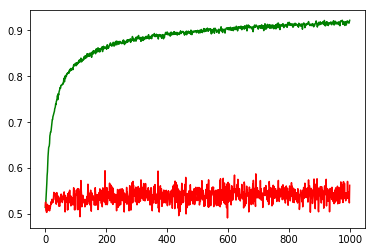

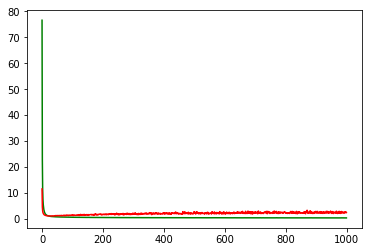

working on d,u and l,le 0.5 128 0.01 0.0001


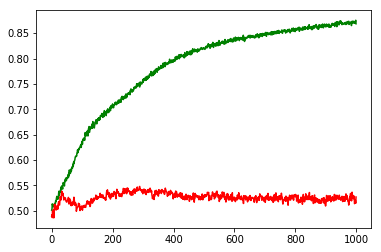

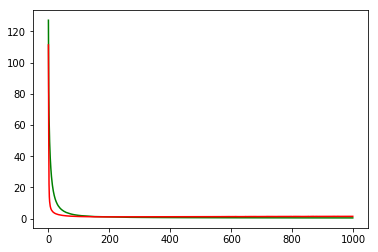

working on d,u and l,le 0.5 128 0.01 1e-05


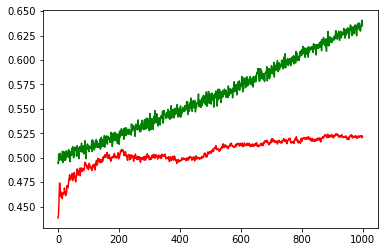

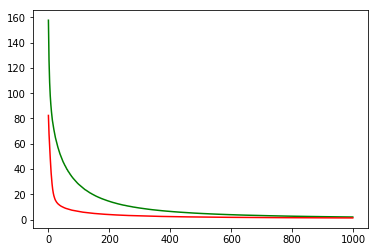

working on d,u and l,le 0.5 128 0.05 0.001


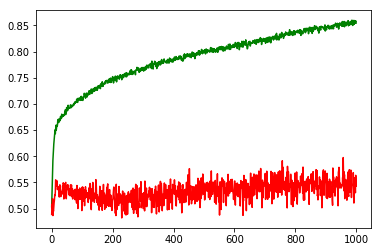

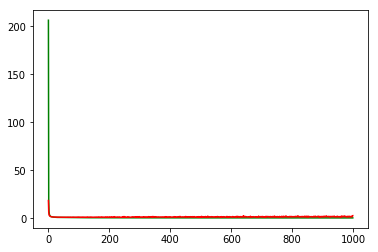

working on d,u and l,le 0.5 128 0.05 0.0001


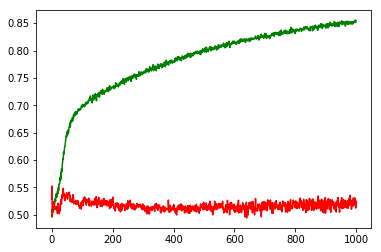

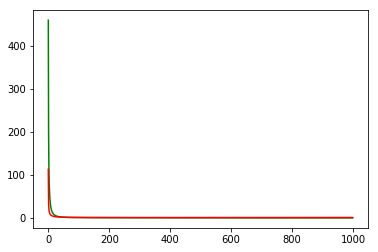

working on d,u and l,le 0.5 128 0.05 1e-05


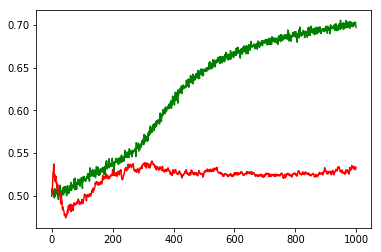

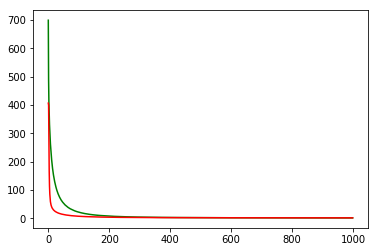

working on d,u and l,le 0.5 256 0.01 0.001


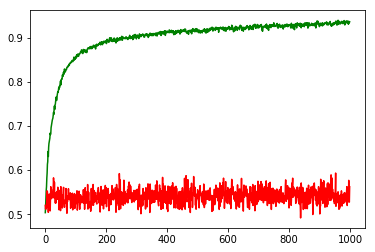

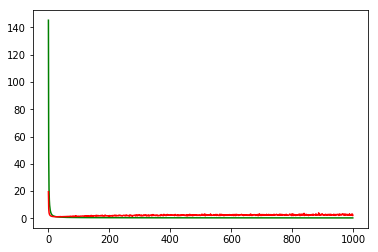

working on d,u and l,le 0.5 256 0.01 0.0001


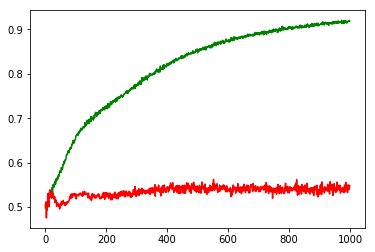

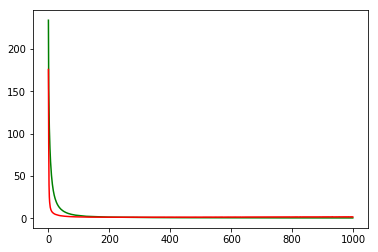

working on d,u and l,le 0.5 256 0.01 1e-05


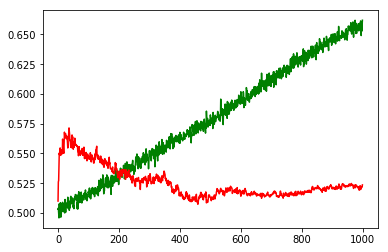

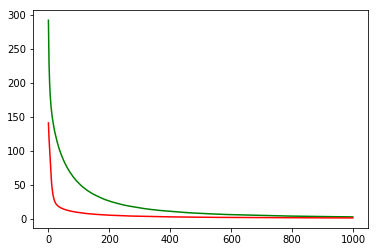

working on d,u and l,le 0.5 256 0.05 0.001


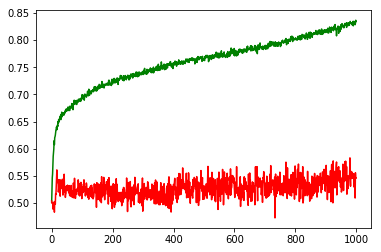

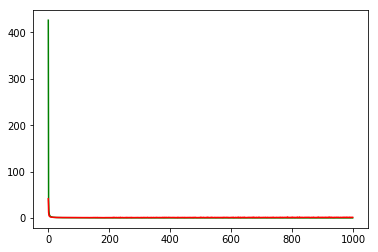

working on d,u and l,le 0.5 256 0.05 0.0001


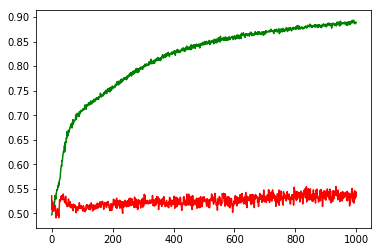

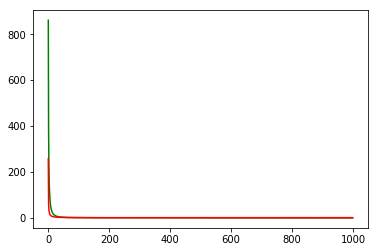

working on d,u and l,le 0.5 256 0.05 1e-05


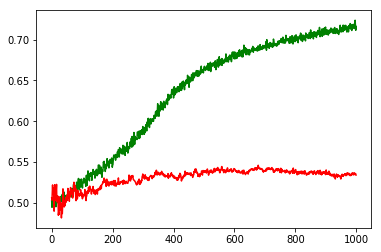

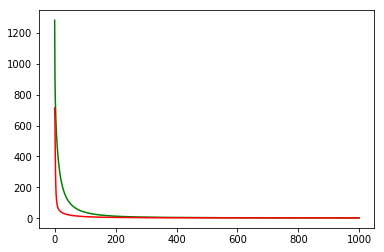

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: CMCSA


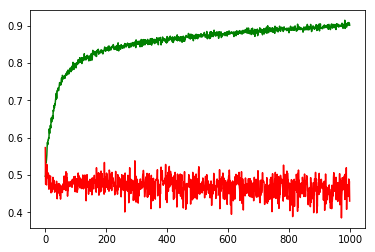

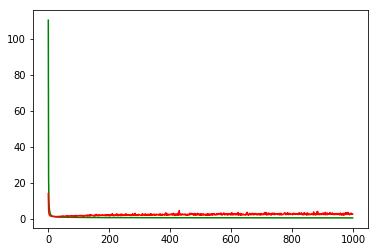

F1,score 0.4286979627989371
G-score: 0.4306584687623323
Accuracy 0.43021201560859545
Window: 140
[[245 295]
 [350 242]]
Vol pos 2.725804258027428
Vol neg 2.95596195125198
Real Percentage of gain: -78.28002301164953
Percentage of gain: -0.5115978665178179
Total gain: -579.1287848981699
000000000000000000000000000000000000000000000000
Percentile:  0
[[104 123]
 [115  86]]
428/428 [==============================] - 0s 33us/step
[2.2562871068437524, 0.443925233784123]
Percentile:  1
[[ 98  99]
 [181 123]]
501/501 [==============================] - 0s 33us/step
[2.6646433947329036, 0.44111776476848624]
Percentile:  2
[[16 26]
 [49 25]]
116/116 [==============================] - 0s 49us/step
[1.5148405371041134, 0.35344827611898555]
Percentile:  3
[[24 36]
 [ 4  8]]
72/72 [==============================] - 0s 70us/step
[2.024663978152805, 0.4444444444444444]
Percentile:  4
[[ 3 10]
 [ 0  0]]
13/13 [==============================] - 0s 73us/step
[2.593244791030884, 0.23076923191547394]
000000

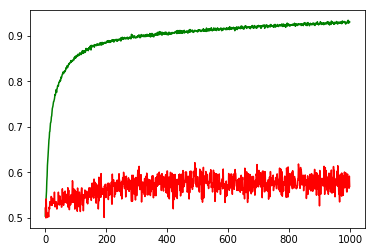

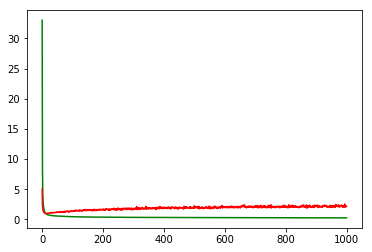

working on d,u and l,le 0.5 64 0.01 0.0001


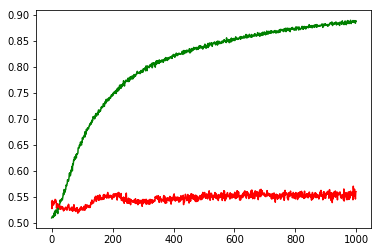

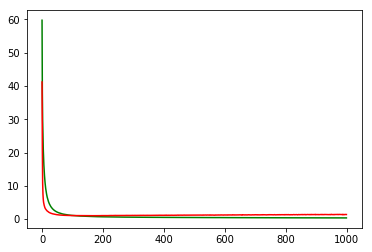

working on d,u and l,le 0.5 64 0.01 1e-05


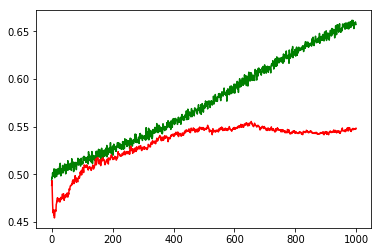

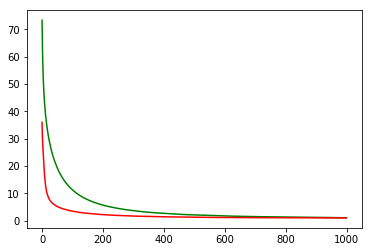

working on d,u and l,le 0.5 64 0.05 0.001


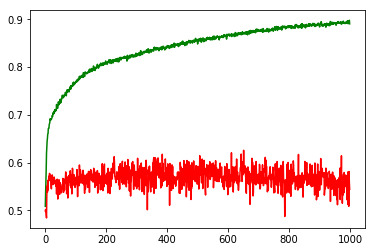

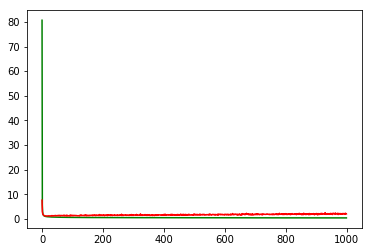

working on d,u and l,le 0.5 64 0.05 0.0001


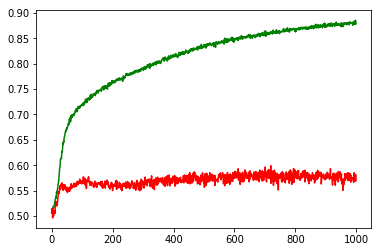

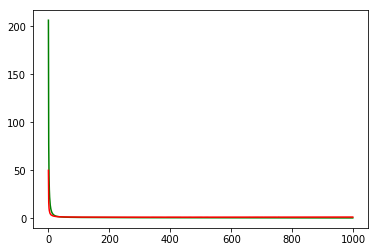

working on d,u and l,le 0.5 64 0.05 1e-05


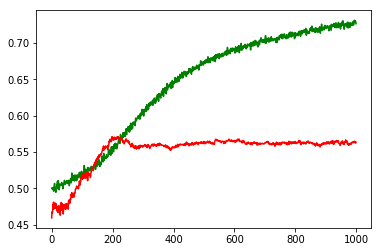

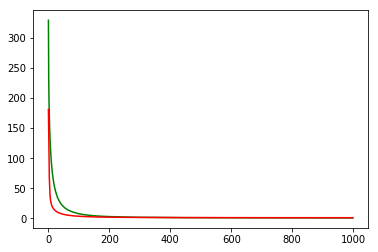

working on d,u and l,le 0.5 128 0.01 0.001


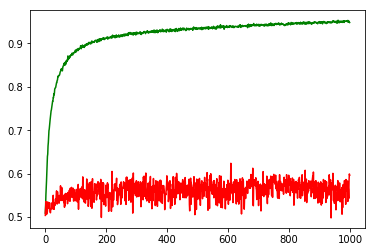

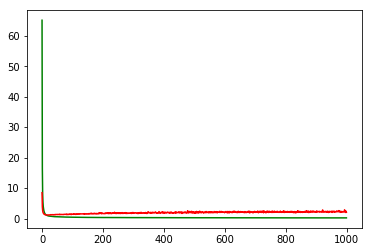

working on d,u and l,le 0.5 128 0.01 0.0001


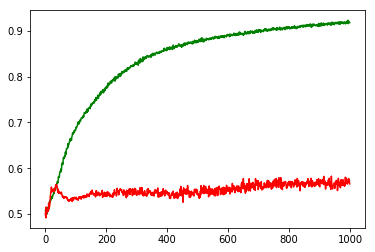

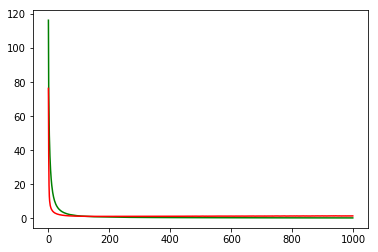

working on d,u and l,le 0.5 128 0.01 1e-05


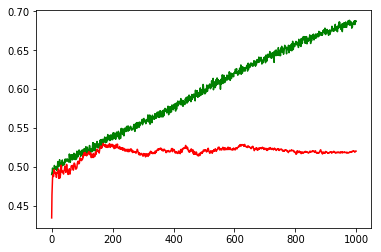

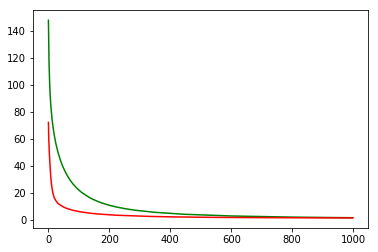

working on d,u and l,le 0.5 128 0.05 0.001


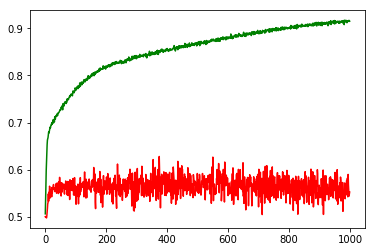

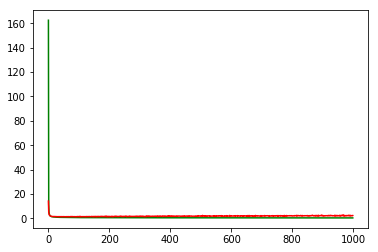

working on d,u and l,le 0.5 128 0.05 0.0001


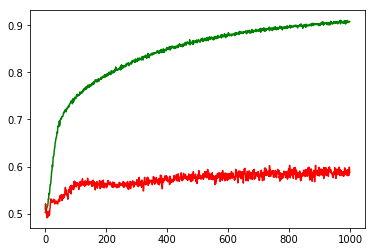

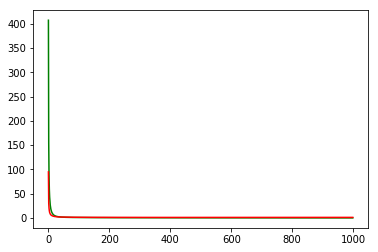

working on d,u and l,le 0.5 128 0.05 1e-05


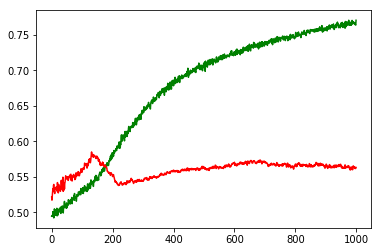

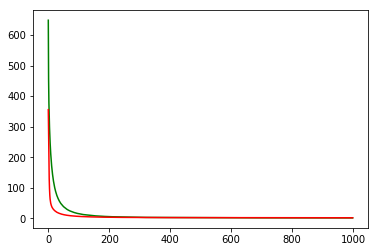

working on d,u and l,le 0.5 256 0.01 0.001


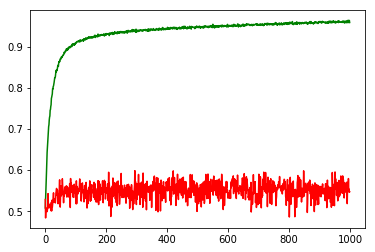

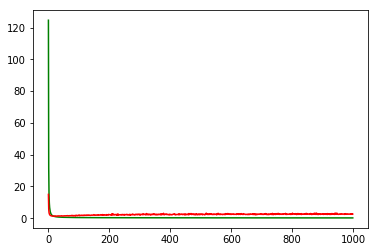

working on d,u and l,le 0.5 256 0.01 0.0001


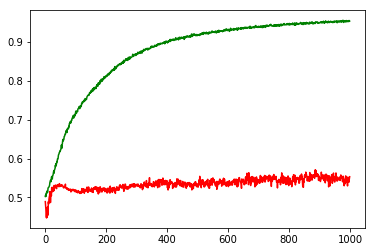

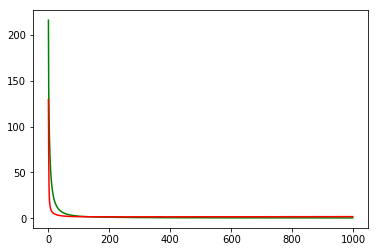

working on d,u and l,le 0.5 256 0.01 1e-05


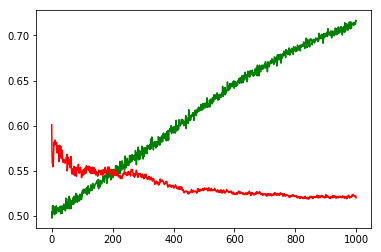

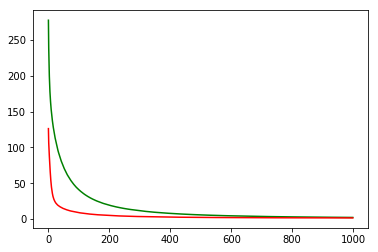

working on d,u and l,le 0.5 256 0.05 0.001


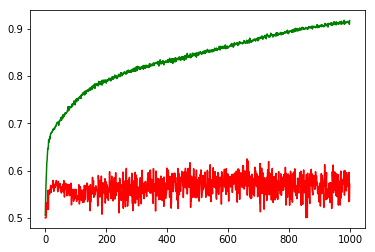

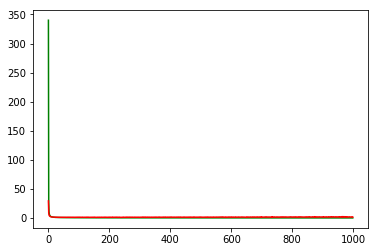

working on d,u and l,le 0.5 256 0.05 0.0001


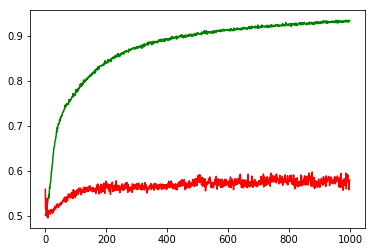

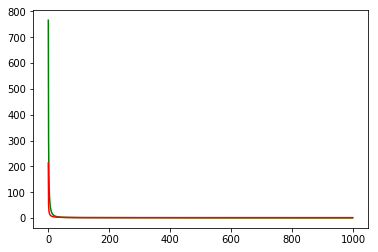

working on d,u and l,le 0.5 256 0.05 1e-05


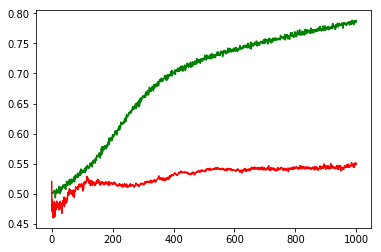

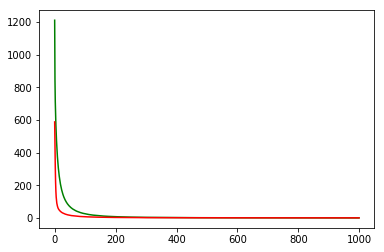

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: NVDA


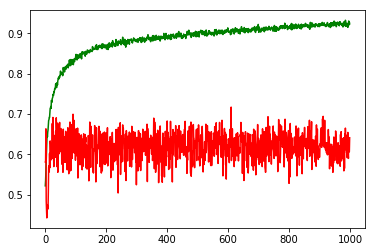

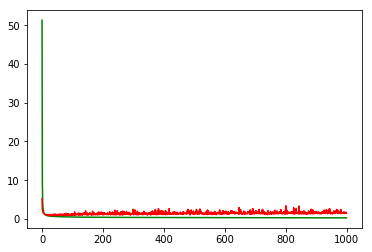

F1,score 0.6432337434094902
G-score: 0.6495856121511889
Accuracy 0.6413427540775744
Window: 140
[[360 116]
 [290 366]]
Vol pos 3.940129679493978
Vol neg 3.465113700971421
Real Percentage of gain: 262.1972529852128
Percentage of gain: 1.2841854988676955
Total gain: 1453.6979847182313
000000000000000000000000000000000000000000000000
Percentile:  0
[[240  73]
 [143 103]]
559/559 [==============================] - 0s 28us/step
[1.6346241660109573, 0.6135957073653533]
Percentile:  1
[[ 88  29]
 [ 88 132]]
337/337 [==============================] - 0s 28us/step
[1.1326177273642062, 0.6528189912747913]
Percentile:  2
[[20 11]
 [16 56]]
103/103 [==============================] - 0s 50us/step
[1.0157523823956263, 0.7378640776699029]
Percentile:  3
[[12  3]
 [33 32]]
80/80 [==============================] - 0s 47us/step
[1.0550302743911744, 0.55]
Percentile:  4
[[ 0  0]
 [10 41]]
51/51 [==============================] - 0s 47us/step
[0.7502042199758923, 0.803921568627451]
00000000000000000000000

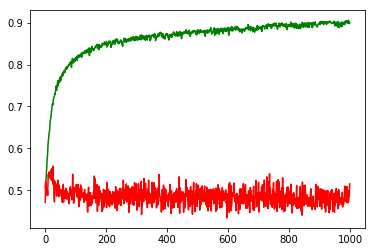

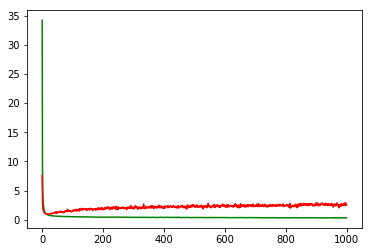

working on d,u and l,le 0.5 64 0.01 0.0001


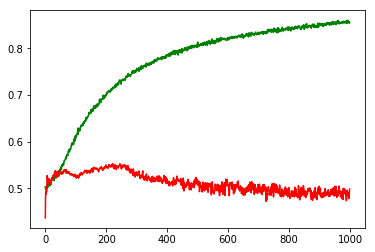

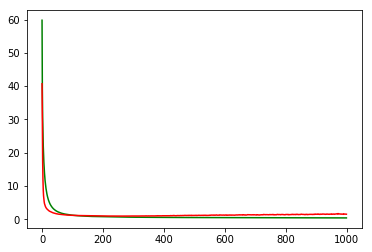

working on d,u and l,le 0.5 64 0.01 1e-05


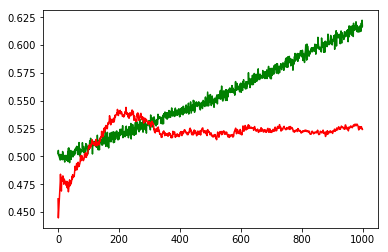

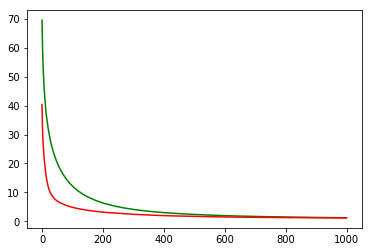

working on d,u and l,le 0.5 64 0.05 0.001


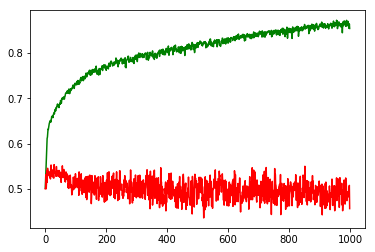

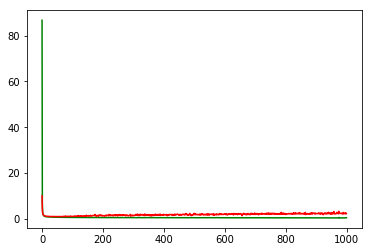

working on d,u and l,le 0.5 64 0.05 0.0001


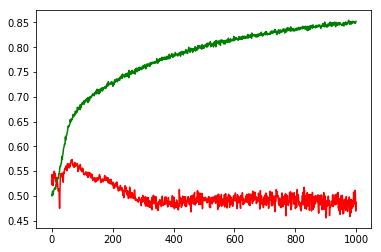

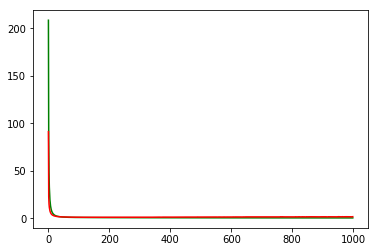

working on d,u and l,le 0.5 64 0.05 1e-05


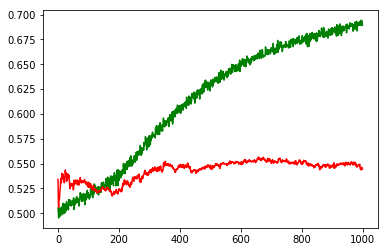

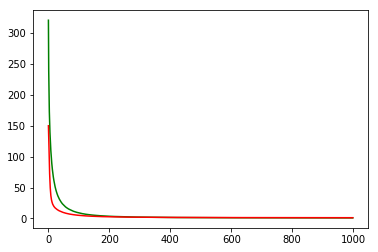

working on d,u and l,le 0.5 128 0.01 0.001


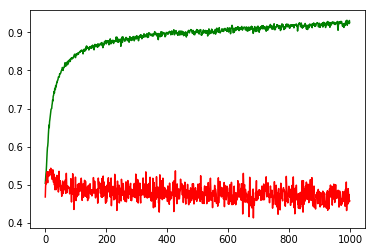

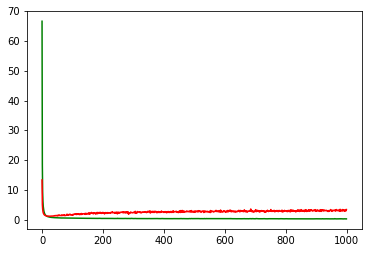

working on d,u and l,le 0.5 128 0.01 0.0001


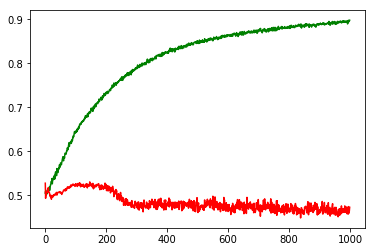

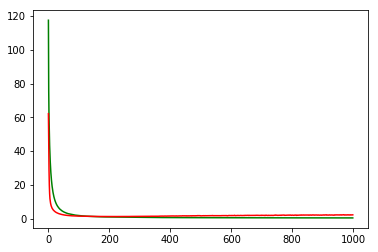

working on d,u and l,le 0.5 128 0.01 1e-05


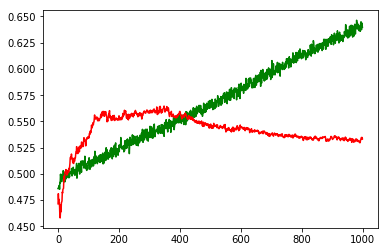

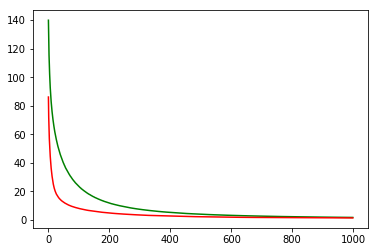

working on d,u and l,le 0.5 128 0.05 0.001


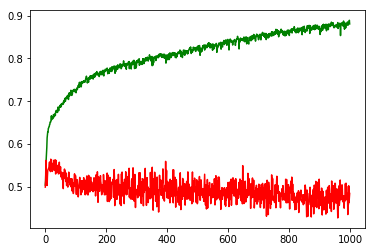

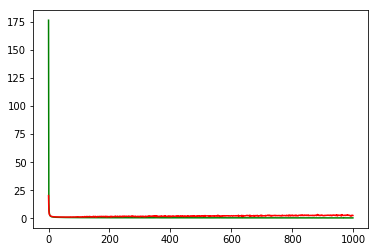

working on d,u and l,le 0.5 128 0.05 0.0001


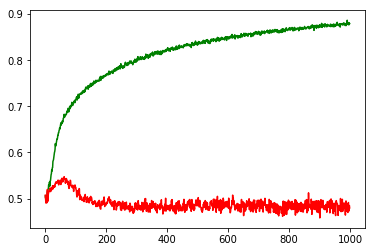

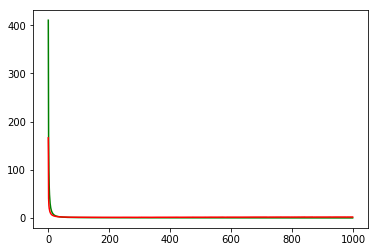

working on d,u and l,le 0.5 128 0.05 1e-05


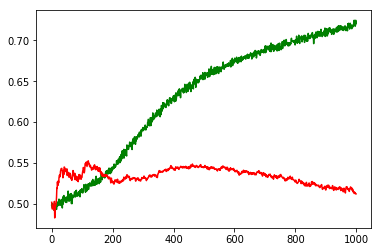

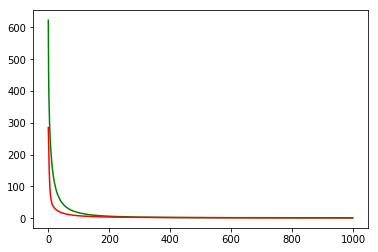

working on d,u and l,le 0.5 256 0.01 0.001


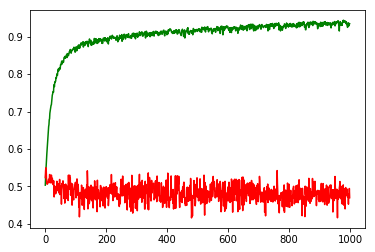

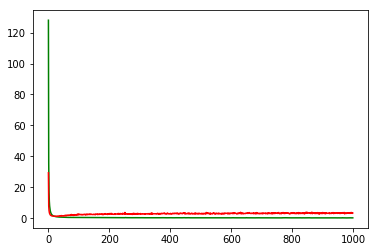

working on d,u and l,le 0.5 256 0.01 0.0001


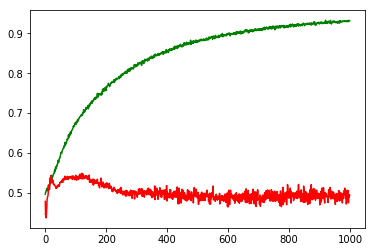

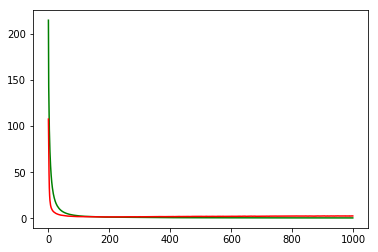

working on d,u and l,le 0.5 256 0.01 1e-05


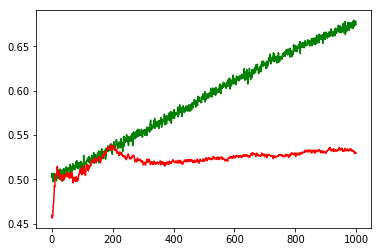

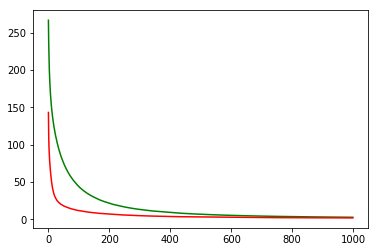

working on d,u and l,le 0.5 256 0.05 0.001


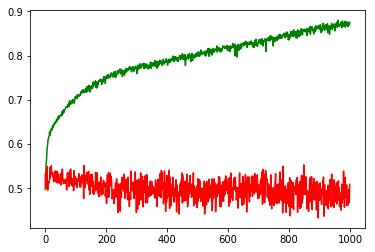

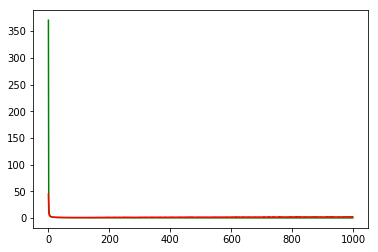

working on d,u and l,le 0.5 256 0.05 0.0001


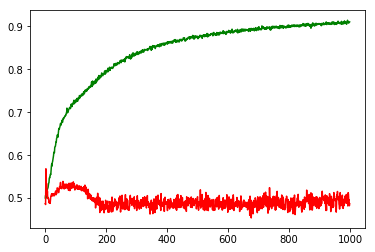

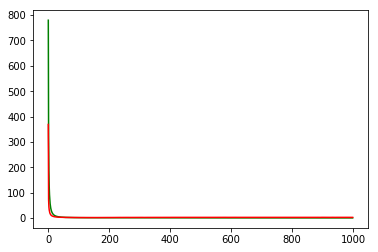

working on d,u and l,le 0.5 256 0.05 1e-05


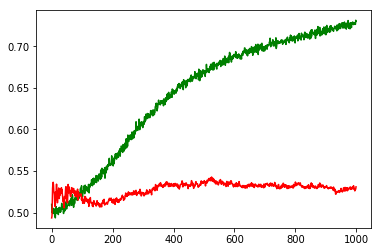

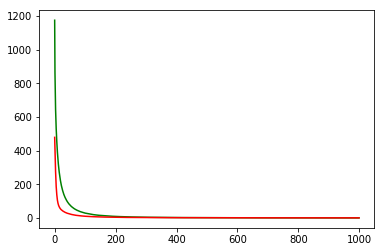

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: NFLX


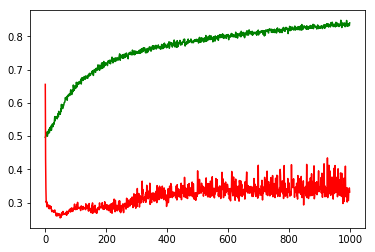

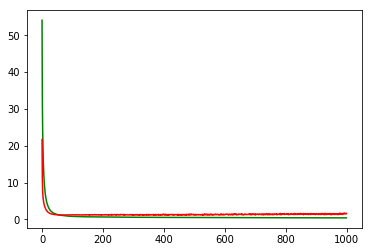

F1,score 0.35384615384615387
G-score: 0.3755839824721965
Accuracy 0.33215547597871653
Window: 140
[[169 128]
 [628 207]]
Vol pos 3.8408709283806206
Vol neg 4.583251355415679
Real Percentage of gain: -175.53787136496342
Percentage of gain: -1.7851329996670846
Total gain: -2020.7705556231397
000000000000000000000000000000000000000000000000
Percentile:  0
[[117  53]
 [204  86]]
460/460 [==============================] - 0s 25us/step
[1.4540206852166548, 0.4413043483443882]
Percentile:  1
[[ 25  35]
 [218  50]]
328/328 [==============================] - 0s 24us/step
[1.668079707680679, 0.22865853658536586]
Percentile:  2
[[ 11  27]
 [160  35]]
233/233 [==============================] - 0s 31us/step
[1.8183289520730277, 0.19742489276781613]
Percentile:  3
[[14 13]
 [46 24]]
97/97 [==============================] - 0s 38us/step
[1.3622533635994822, 0.3917525773195876]
Percentile:  4
[[ 1  0]
 [ 0 11]]
12/12 [==============================] - 0s 53us/step
[0.15847523510456085, 1.0]
0000000000

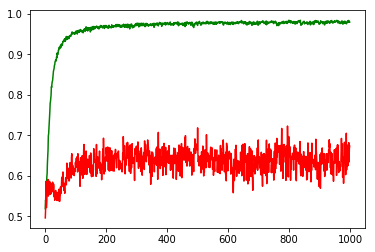

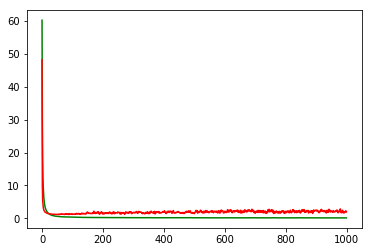

working on d,u and l,le 0.5 64 0.01 0.0001


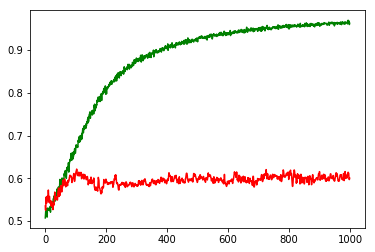

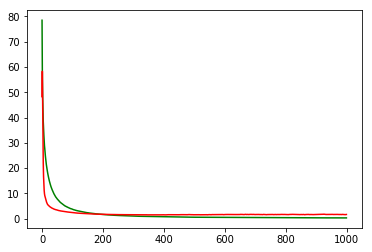

working on d,u and l,le 0.5 64 0.01 1e-05


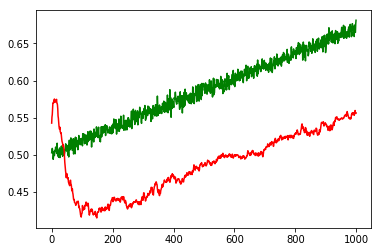

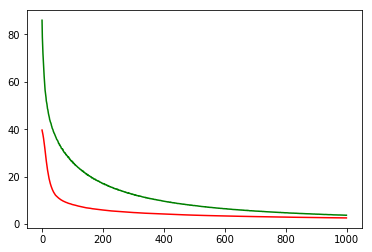

working on d,u and l,le 0.5 64 0.05 0.001


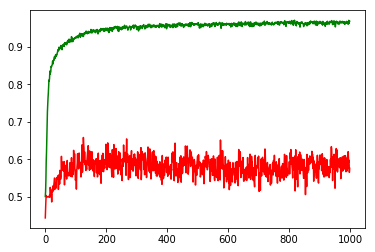

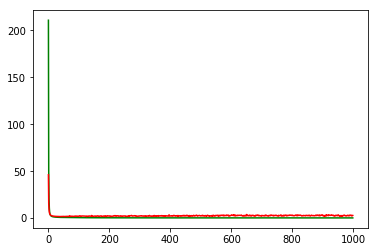

working on d,u and l,le 0.5 64 0.05 0.0001


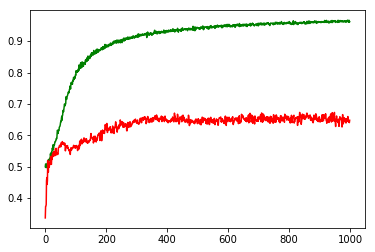

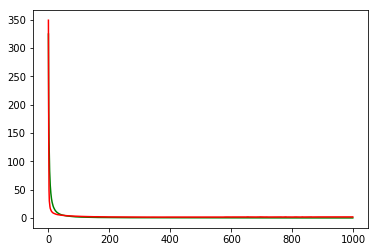

working on d,u and l,le 0.5 64 0.05 1e-05


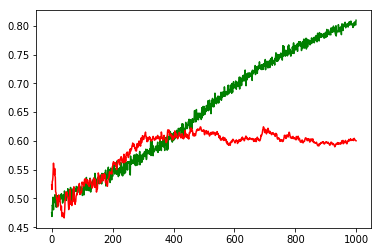

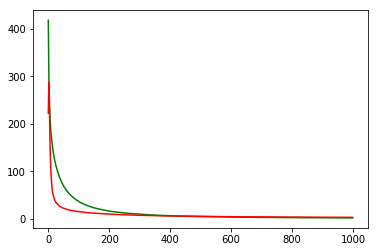

working on d,u and l,le 0.5 128 0.01 0.001


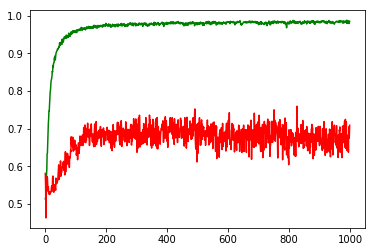

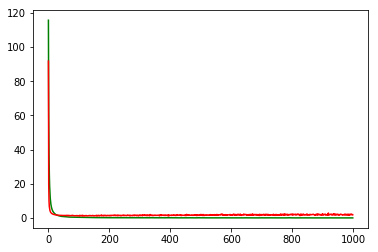

working on d,u and l,le 0.5 128 0.01 0.0001


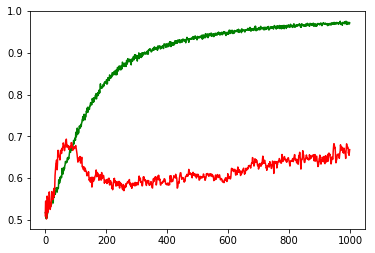

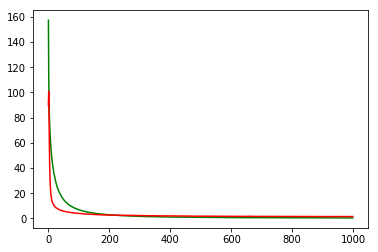

working on d,u and l,le 0.5 128 0.01 1e-05


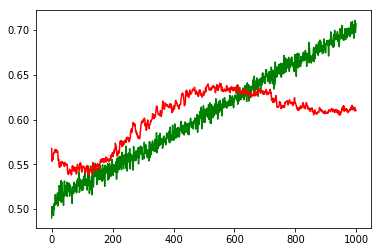

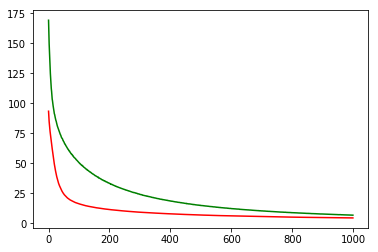

working on d,u and l,le 0.5 128 0.05 0.001


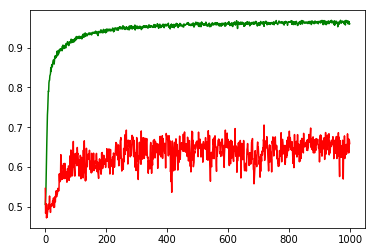

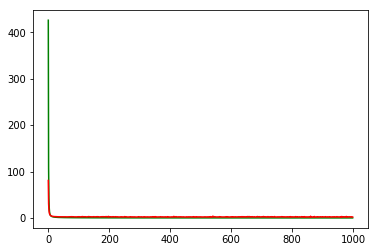

working on d,u and l,le 0.5 128 0.05 0.0001


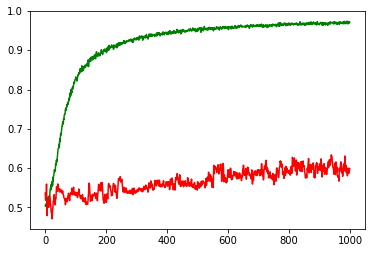

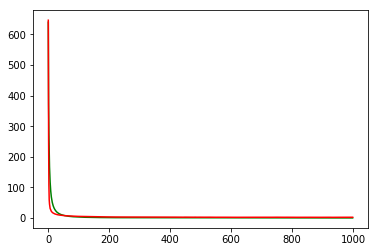

working on d,u and l,le 0.5 128 0.05 1e-05


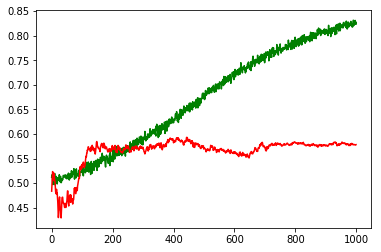

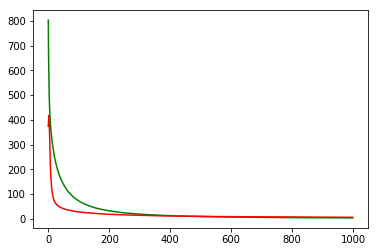

working on d,u and l,le 0.5 256 0.01 0.001


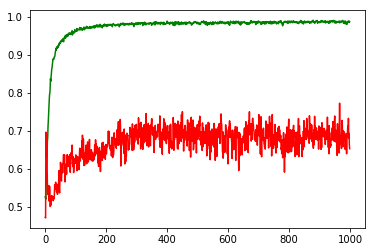

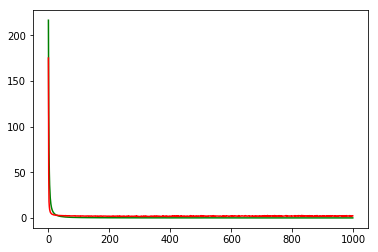

working on d,u and l,le 0.5 256 0.01 0.0001


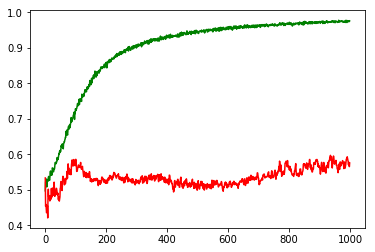

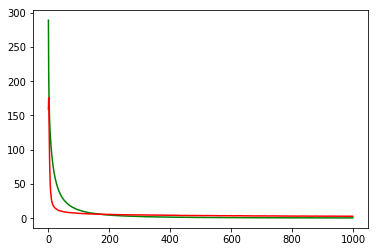

working on d,u and l,le 0.5 256 0.01 1e-05


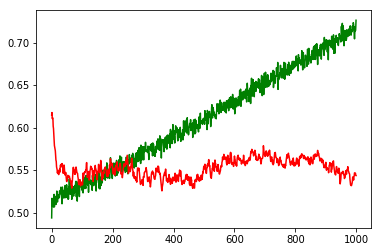

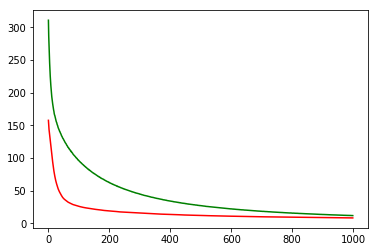

working on d,u and l,le 0.5 256 0.05 0.001


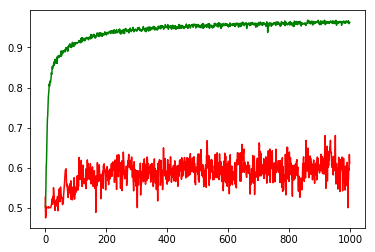

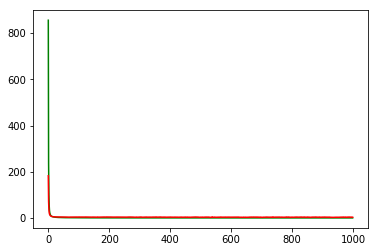

working on d,u and l,le 0.5 256 0.05 0.0001


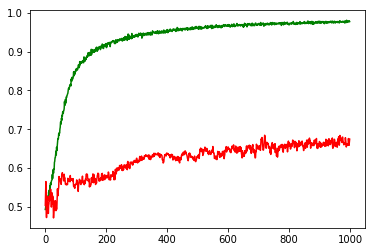

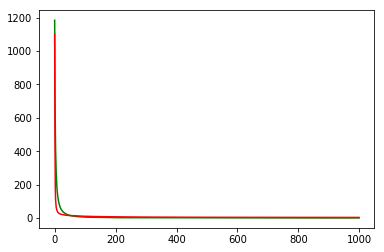

working on d,u and l,le 0.5 256 0.05 1e-05


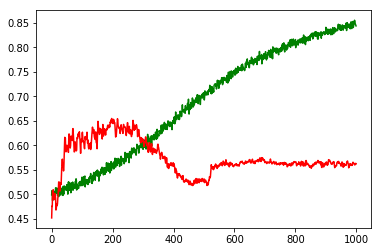

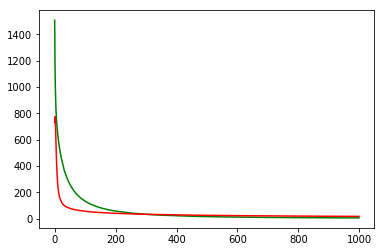

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: BKNG


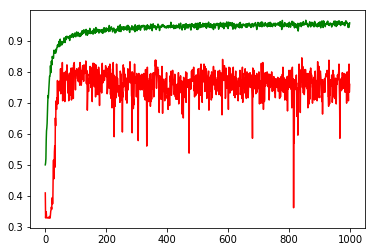

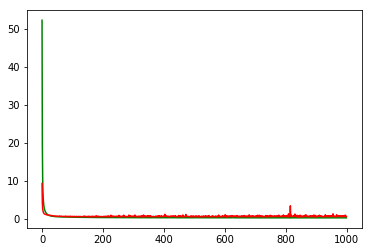

F1,score 0.8309859154929577
G-score: 0.6673239176603577
Accuracy 0.7587939689506837
Window: 140
[[ 66  65]
 [ 31 236]]
Vol pos 1.3191305335971155
Vol neg 0.7464945875494541
Real Percentage of gain: 223.08956497435122
Percentage of gain: 0.8208892983456817
Total gain: 326.7139407415813
000000000000000000000000000000000000000000000000
Percentile:  0
[[40 57]
 [ 7 68]]
172/172 [==============================] - 0s 24us/step
[0.8452551595780046, 0.627906976744186]
Percentile:  1
[[19  7]
 [ 9 65]]
100/100 [==============================] - 0s 32us/step
[0.3917404365539551, 0.84]
Percentile:  2
[[ 7  0]
 [14 68]]
89/89 [==============================] - 0s 30us/step
[0.2725867046399063, 0.8426966298831983]
Percentile:  3
[[ 0  0]
 [ 1 22]]
23/23 [==============================] - 0s 24us/step
[0.1157267615199089, 0.95652174949646]
Percentile:  4
[[12]]
12/12 [==============================] - 0s 53us/step
[0.09898455440998077, 1.0]
000000000000000000000000000000000000000000000000
Working on

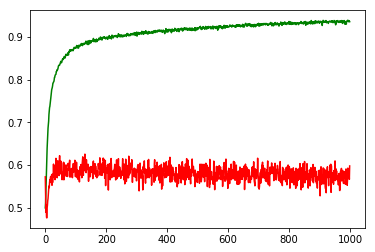

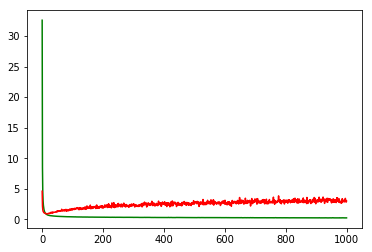

working on d,u and l,le 0.5 64 0.01 0.0001


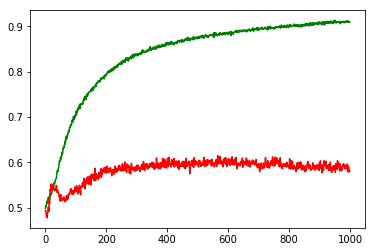

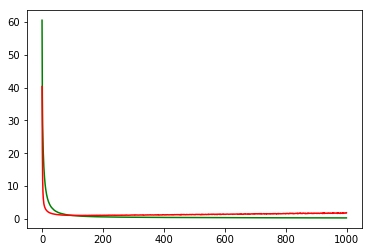

working on d,u and l,le 0.5 64 0.01 1e-05


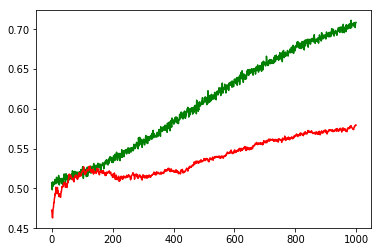

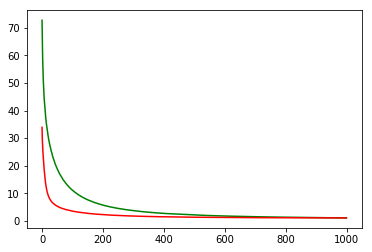

working on d,u and l,le 0.5 64 0.05 0.001


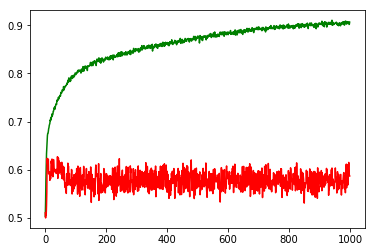

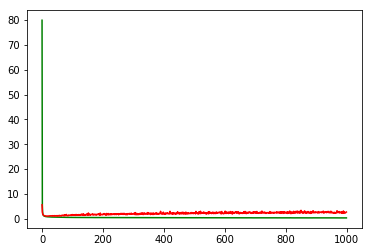

working on d,u and l,le 0.5 64 0.05 0.0001


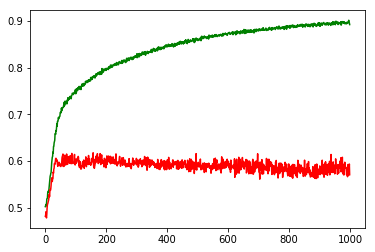

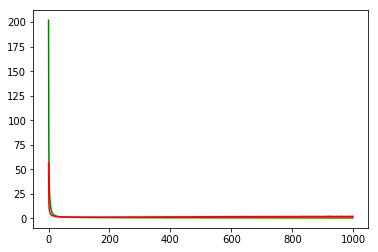

working on d,u and l,le 0.5 64 0.05 1e-05


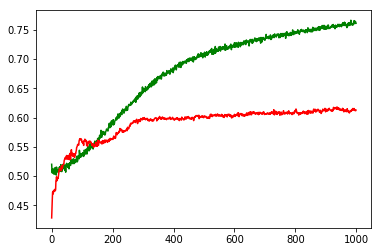

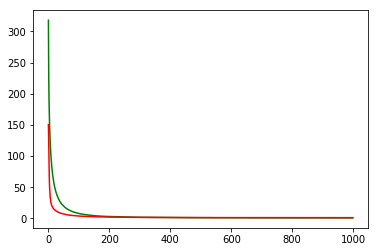

working on d,u and l,le 0.5 128 0.01 0.001


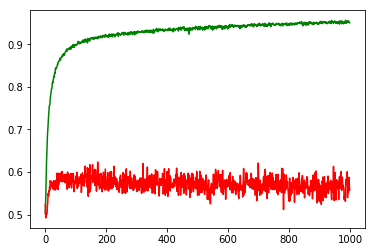

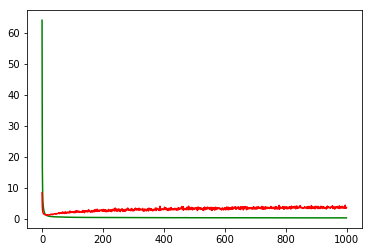

working on d,u and l,le 0.5 128 0.01 0.0001


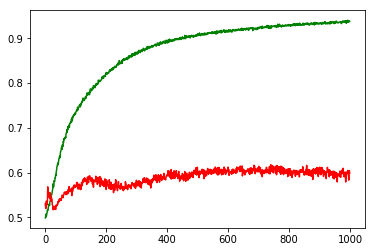

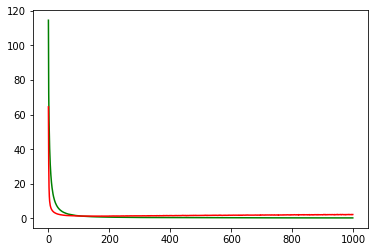

working on d,u and l,le 0.5 128 0.01 1e-05


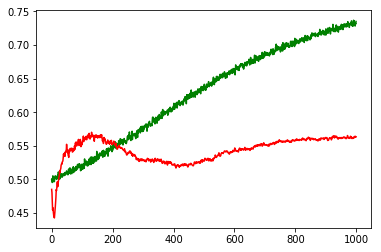

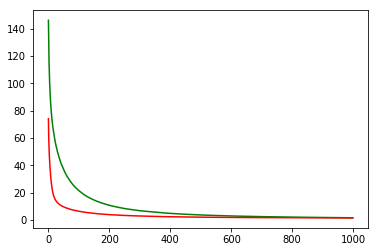

working on d,u and l,le 0.5 128 0.05 0.001


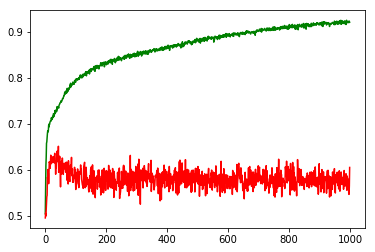

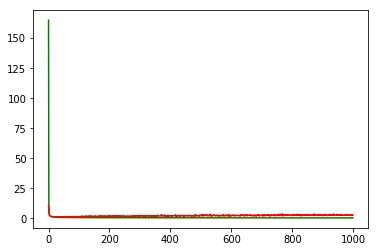

working on d,u and l,le 0.5 128 0.05 0.0001


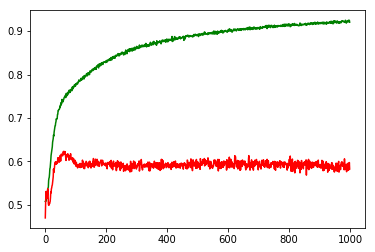

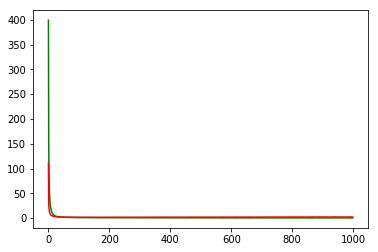

working on d,u and l,le 0.5 128 0.05 1e-05


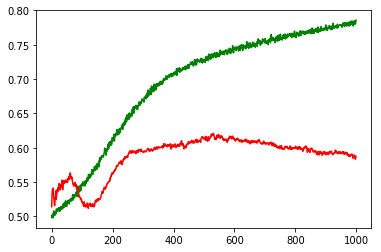

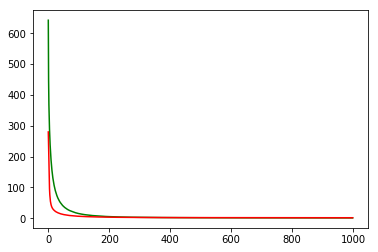

working on d,u and l,le 0.5 256 0.01 0.001


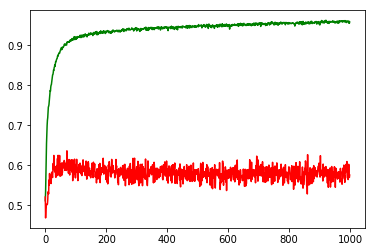

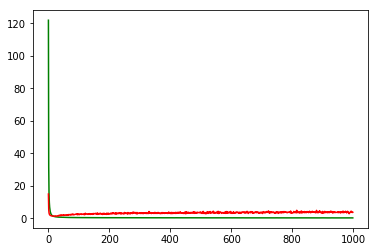

working on d,u and l,le 0.5 256 0.01 0.0001


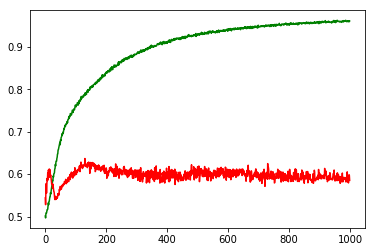

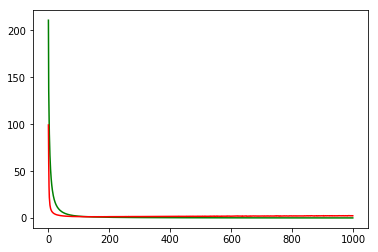

working on d,u and l,le 0.5 256 0.01 1e-05


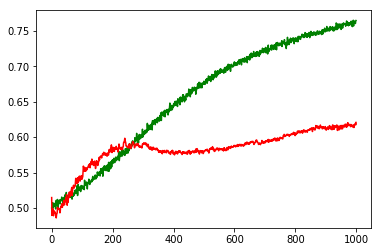

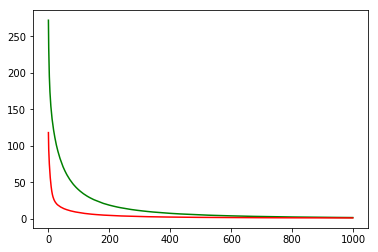

working on d,u and l,le 0.5 256 0.05 0.001


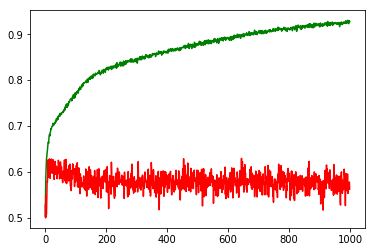

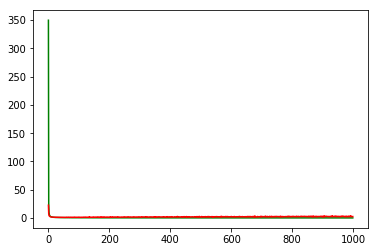

working on d,u and l,le 0.5 256 0.05 0.0001


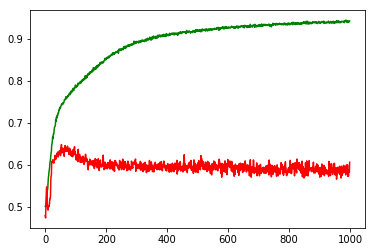

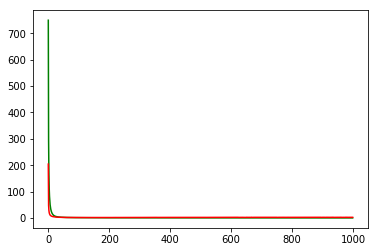

working on d,u and l,le 0.5 256 0.05 1e-05


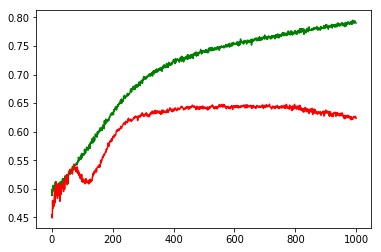

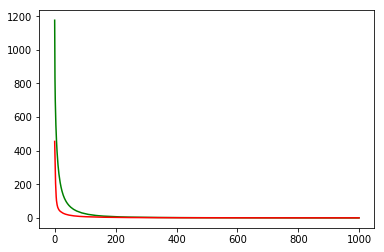

maxd,maxu,maxl,maxle: 0.5 256 0.05 1e-05
Chart for BEST MODEL FOR: ADBE


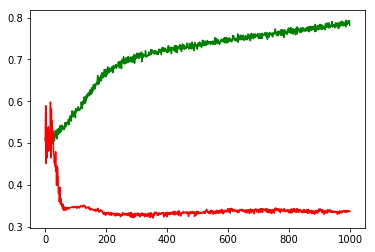

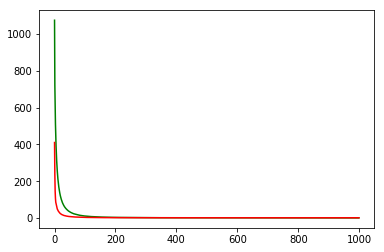

F1,score 0.09650180940892643
G-score: 0.21749260117948208
Accuracy 0.3365810479180173
Window: 140
[[340  48]
 [701  40]]
Vol pos 1.8995677463584821
Vol neg 2.960478368646742
Real Percentage of gain: -244.80768943582478
Percentage of gain: -1.3246789676706703
Total gain: -1495.5625545001867
000000000000000000000000000000000000000000000000
Percentile:  0
[[231  46]
 [258  26]]
561/561 [==============================] - 0s 29us/step
[1.2130505408089003, 0.45811051693404636]
Percentile:  1
[[ 63   0]
 [250  11]]
324/324 [==============================] - 0s 35us/step
[1.6543601548966067, 0.22839506172839505]
Percentile:  2
[[ 23   2]
 [130   3]]
158/158 [==============================] - 0s 39us/step
[1.8851754439028003, 0.1645569623082499]
Percentile:  3
[[23  0]
 [43  0]]
66/66 [==============================] - 0s 58us/step
[1.8762443715875798, 0.3484848484848485]
Percentile:  4
[[ 0  0]
 [18  0]]
18/18 [==============================] - 0s 45us/step
[2.552003860473633, 0.0]
00000000000

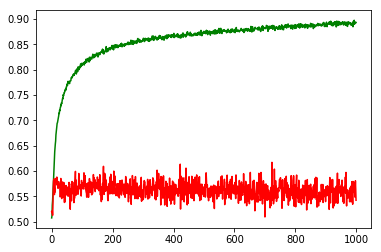

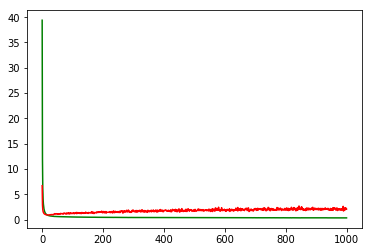

working on d,u and l,le 0.5 64 0.01 0.0001


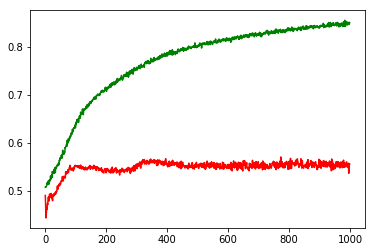

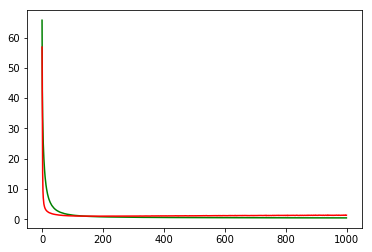

working on d,u and l,le 0.5 64 0.01 1e-05


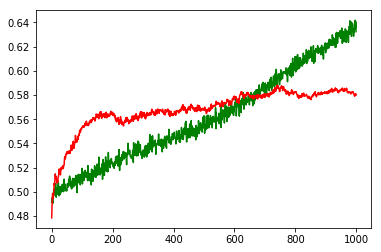

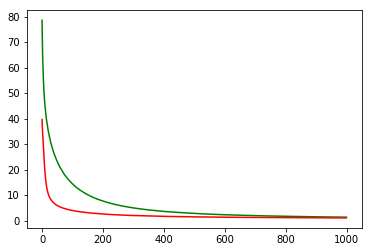

working on d,u and l,le 0.5 64 0.05 0.001


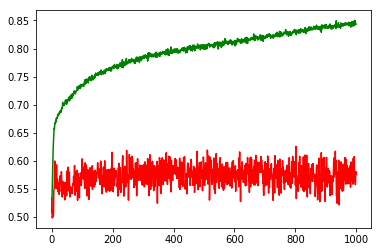

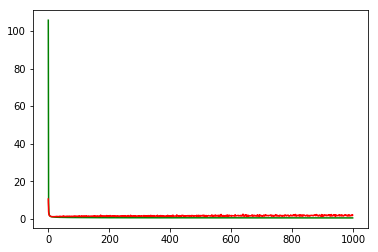

working on d,u and l,le 0.5 64 0.05 0.0001


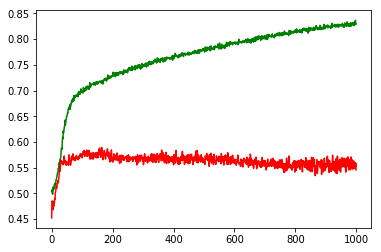

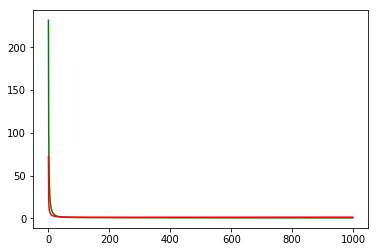

working on d,u and l,le 0.5 64 0.05 1e-05


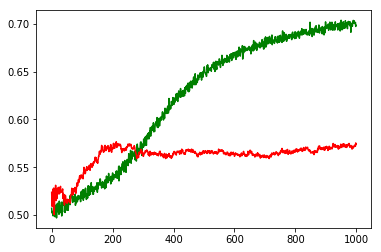

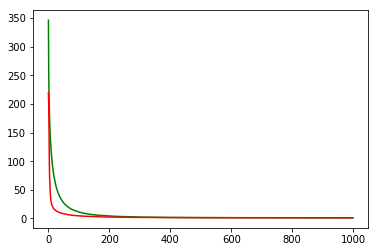

working on d,u and l,le 0.5 128 0.01 0.001


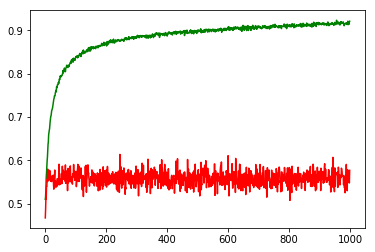

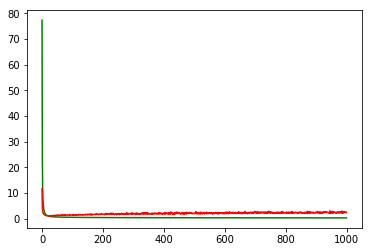

working on d,u and l,le 0.5 128 0.01 0.0001


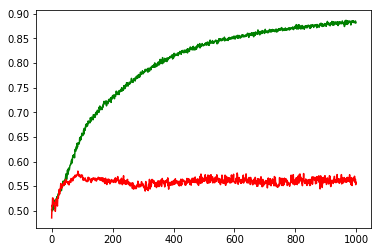

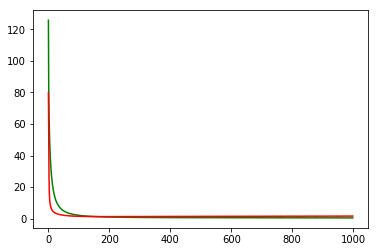

working on d,u and l,le 0.5 128 0.01 1e-05


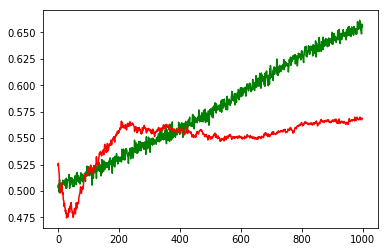

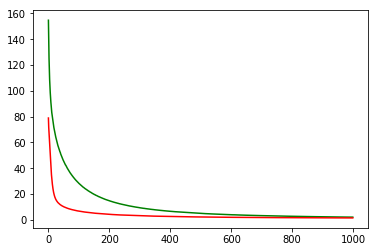

working on d,u and l,le 0.5 128 0.05 0.001


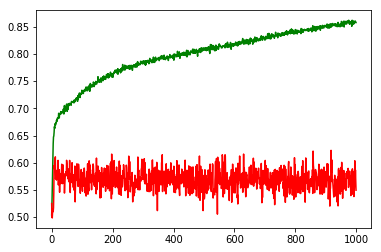

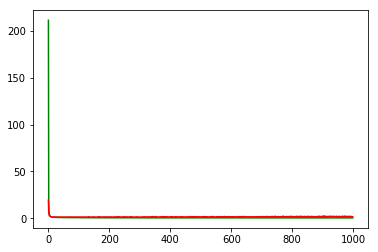

working on d,u and l,le 0.5 128 0.05 0.0001


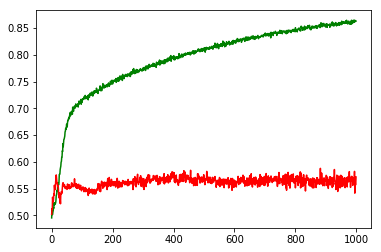

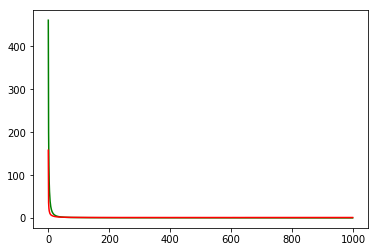

working on d,u and l,le 0.5 128 0.05 1e-05


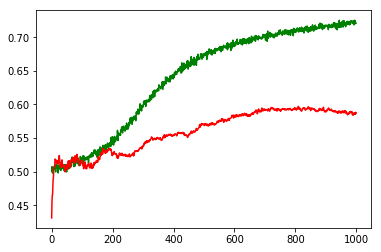

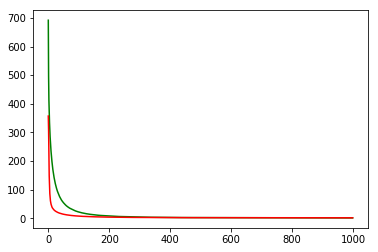

working on d,u and l,le 0.5 256 0.01 0.001


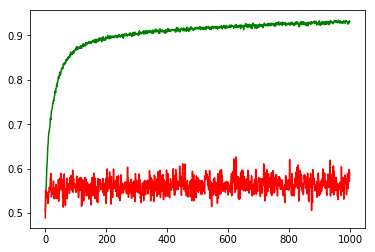

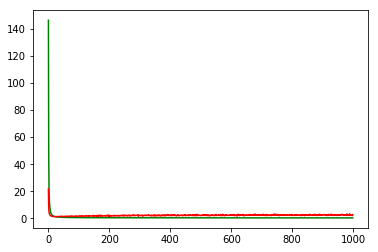

working on d,u and l,le 0.5 256 0.01 0.0001


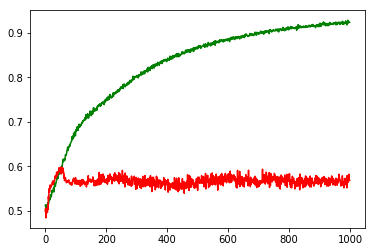

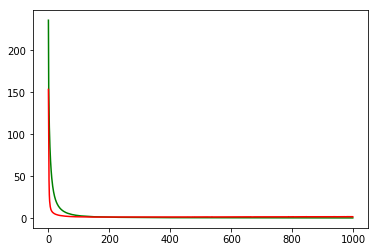

working on d,u and l,le 0.5 256 0.01 1e-05


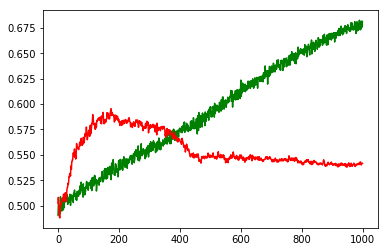

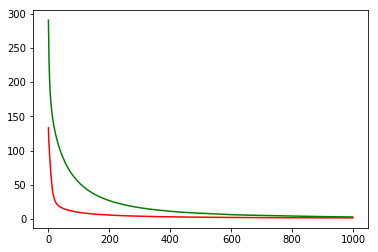

working on d,u and l,le 0.5 256 0.05 0.001


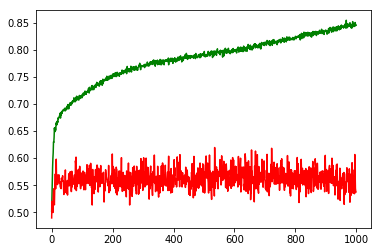

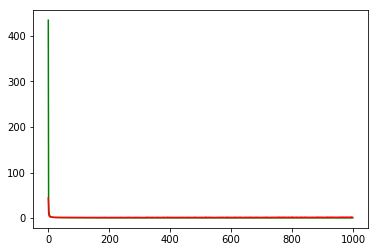

working on d,u and l,le 0.5 256 0.05 0.0001


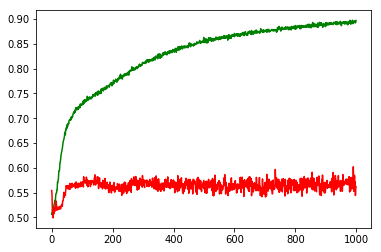

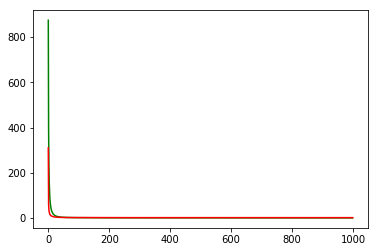

working on d,u and l,le 0.5 256 0.05 1e-05


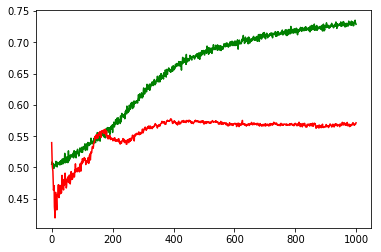

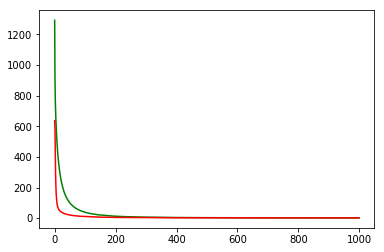

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: AMGN


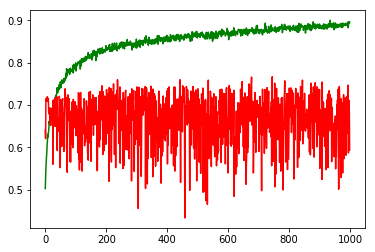

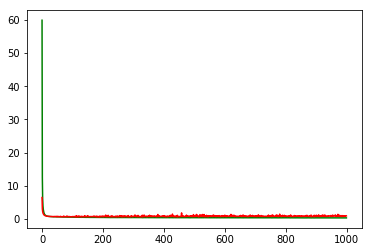

F1,score 0.6779661016949152
G-score: 0.5910288220494417
Accuracy 0.5939447899694859
Window: 140
[[187 133]
 [323 480]]
Vol pos 2.052807127911546
Vol neg 1.753437064155284
Real Percentage of gain: 117.67718541266262
Percentage of gain: 0.5072618460037324
Total gain: 569.6550530621914
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 87  78]
 [144 137]]
446/446 [==============================] - 0s 25us/step
[1.048534945254903, 0.5022421524663677]
Percentile:  1
[[ 47   8]
 [110 151]]
316/316 [==============================] - 0s 31us/step
[0.9442329708533951, 0.6265822784810127]
Percentile:  2
[[ 23   3]
 [ 53 135]]
214/214 [==============================] - 0s 33us/step
[0.6233444258431408, 0.738317756452293]
Percentile:  3
[[28 28]
 [16 53]]
125/125 [==============================] - 0s 31us/step
[0.6711663522720337, 0.6479999942779541]
Percentile:  4
[[ 2 15]
 [ 0  3]]
20/20 [==============================] - 0s 31us/step
[1.1319524049758911, 0.25]
000000000000000000

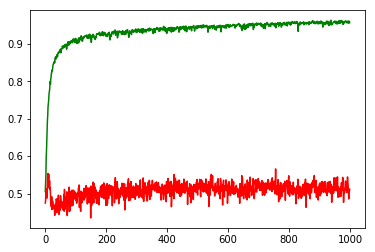

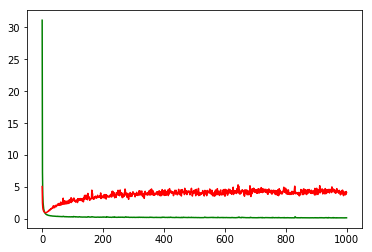

working on d,u and l,le 0.5 64 0.01 0.0001


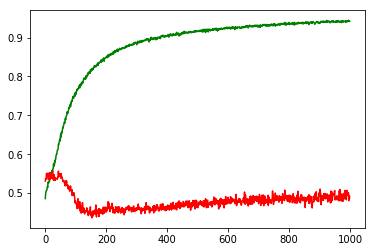

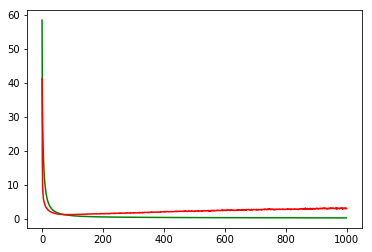

working on d,u and l,le 0.5 64 0.01 1e-05


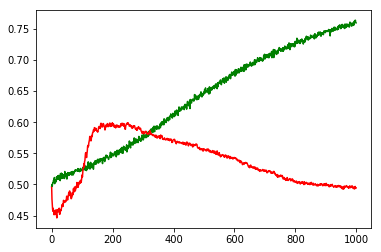

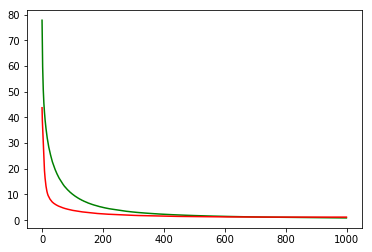

working on d,u and l,le 0.5 64 0.05 0.001


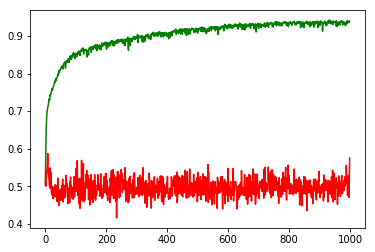

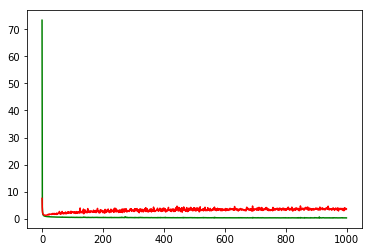

working on d,u and l,le 0.5 64 0.05 0.0001


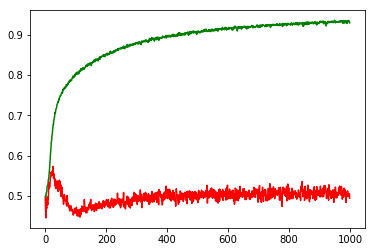

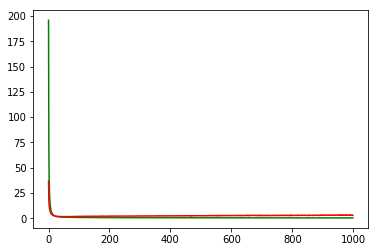

working on d,u and l,le 0.5 64 0.05 1e-05


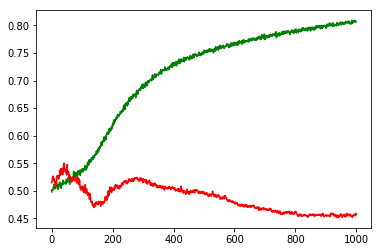

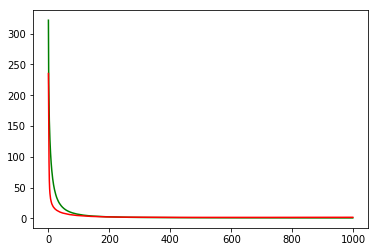

working on d,u and l,le 0.5 128 0.01 0.001


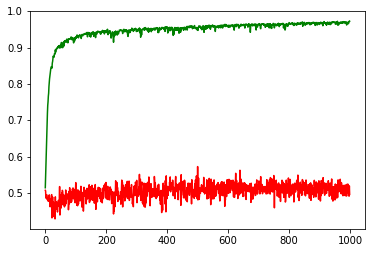

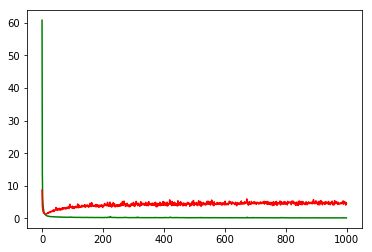

working on d,u and l,le 0.5 128 0.01 0.0001


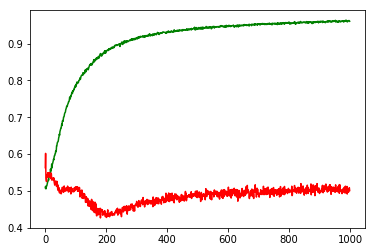

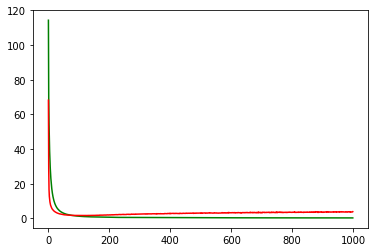

working on d,u and l,le 0.5 128 0.01 1e-05


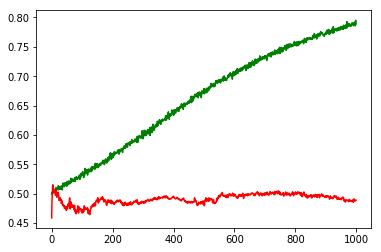

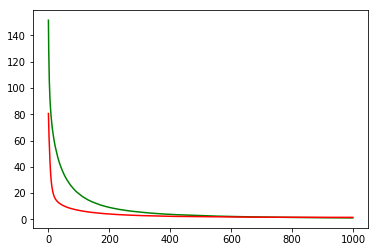

working on d,u and l,le 0.5 128 0.05 0.001


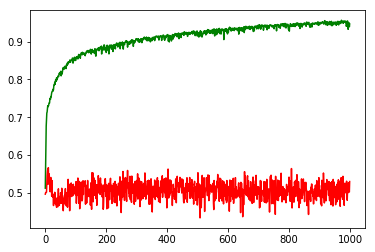

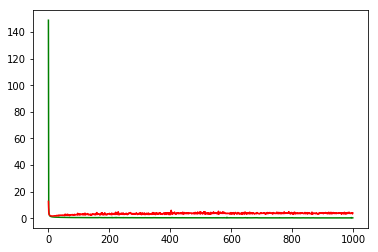

working on d,u and l,le 0.5 128 0.05 0.0001


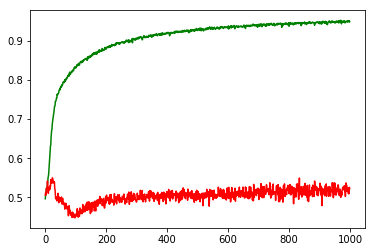

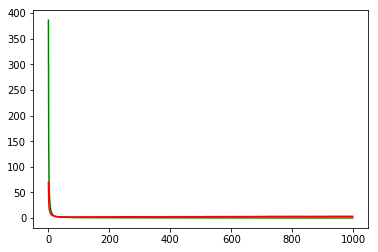

working on d,u and l,le 0.5 128 0.05 1e-05


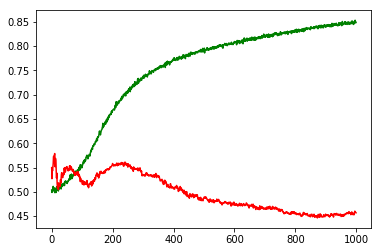

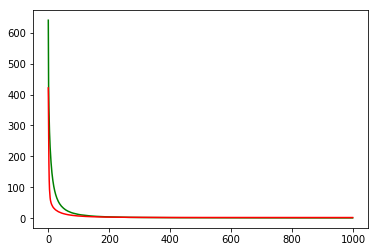

working on d,u and l,le 0.5 256 0.01 0.001


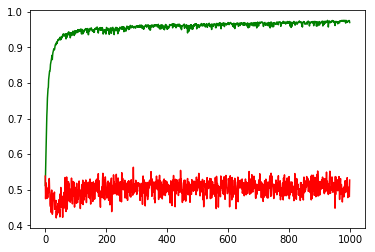

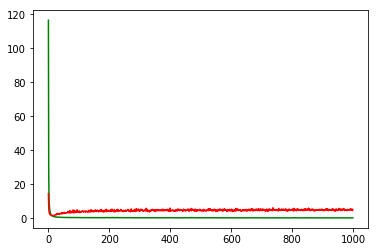

working on d,u and l,le 0.5 256 0.01 0.0001


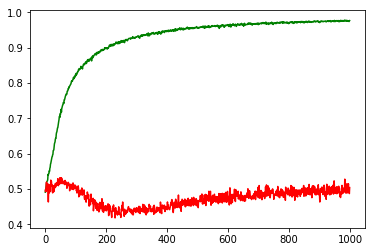

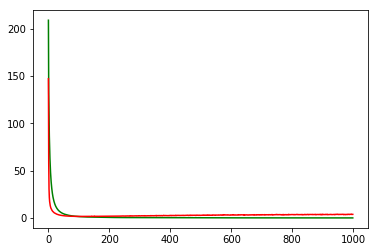

working on d,u and l,le 0.5 256 0.01 1e-05


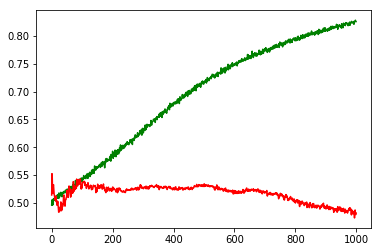

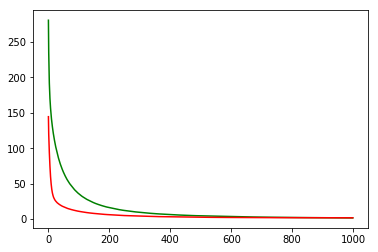

working on d,u and l,le 0.5 256 0.05 0.001


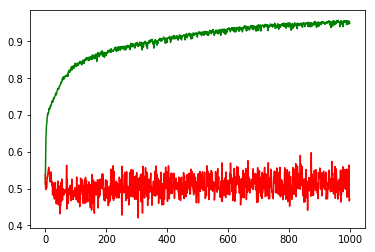

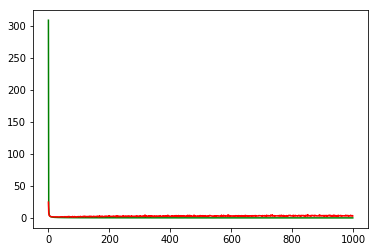

working on d,u and l,le 0.5 256 0.05 0.0001


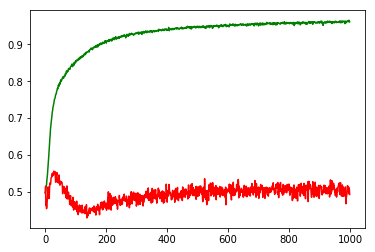

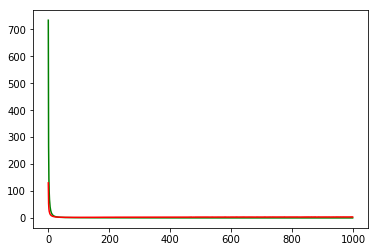

working on d,u and l,le 0.5 256 0.05 1e-05


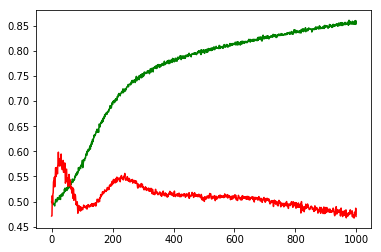

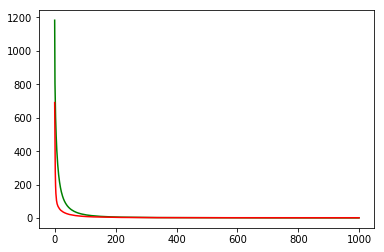

maxd,maxu,maxl,maxle: 0.5 128 0.01 1e-05
Chart for BEST MODEL FOR: TXN


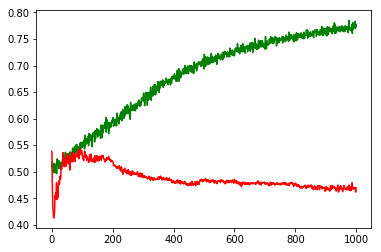

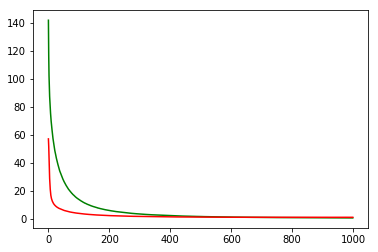

F1,score 0.4773519163763067
G-score: 0.500790019211147
Accuracy 0.46949602137826163
Window: 140
[[257 111]
 [489 274]]
Vol pos 2.1521810180503387
Vol neg 2.799986303960795
Real Percentage of gain: -36.533680275599245
Percentage of gain: -0.4749634498600771
Total gain: -537.1836617917472
000000000000000000000000000000000000000000000000
Percentile:  0
[[159  49]
 [151  96]]
455/455 [==============================] - 0s 28us/step
[0.9680001426529098, 0.5604395605378099]
Percentile:  1
[[ 83  46]
 [120  85]]
334/334 [==============================] - 0s 34us/step
[0.9524812105886951, 0.5029940119760479]
Percentile:  2
[[  7   7]
 [134  44]]
192/192 [==============================] - 0s 29us/step
[1.3901569843292236, 0.265625]
Percentile:  3
[[ 6  4]
 [75 37]]
122/122 [==============================] - 0s 37us/step
[1.038603813921819, 0.3524590163934426]
Percentile:  4
[[ 2  5]
 [ 8 11]]
26/26 [==============================] - 0s 37us/step
[0.7787150144577026, 0.5]
000000000000000000000000

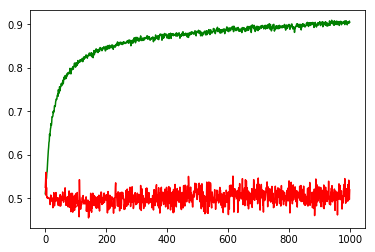

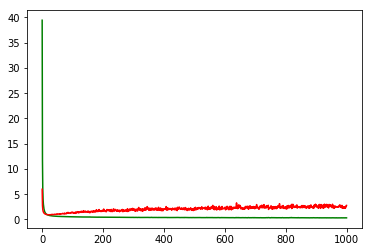

working on d,u and l,le 0.5 64 0.01 0.0001


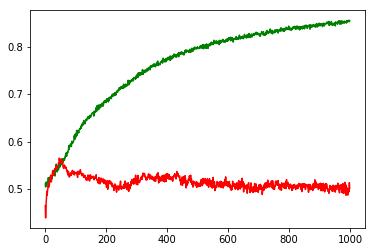

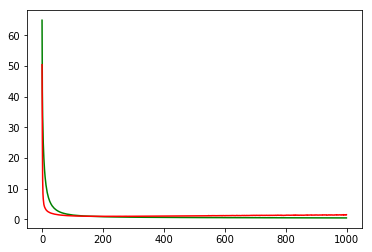

working on d,u and l,le 0.5 64 0.01 1e-05


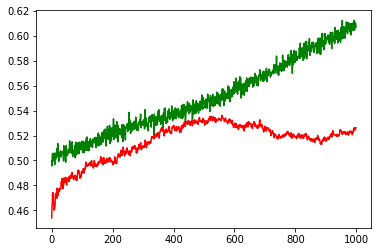

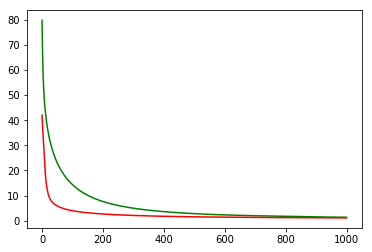

working on d,u and l,le 0.5 64 0.05 0.001


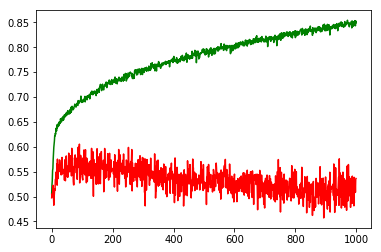

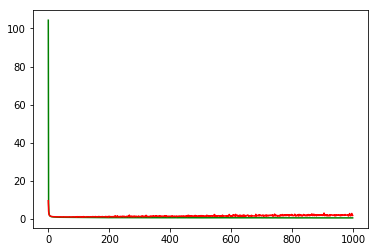

working on d,u and l,le 0.5 64 0.05 0.0001


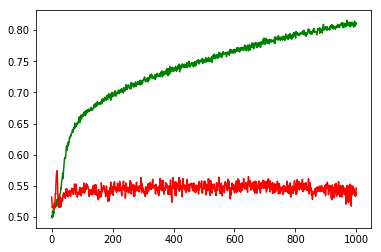

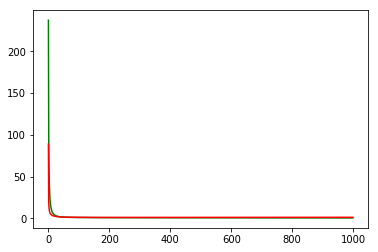

working on d,u and l,le 0.5 64 0.05 1e-05


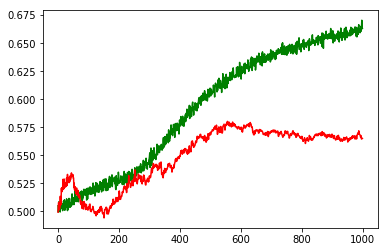

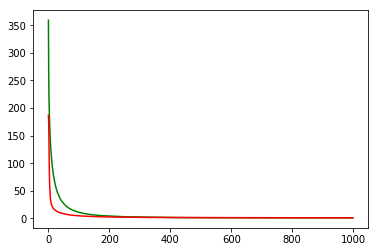

working on d,u and l,le 0.5 128 0.01 0.001


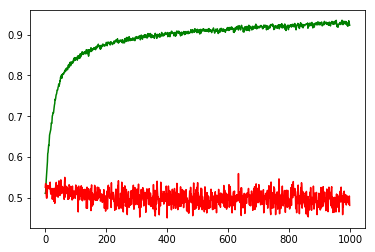

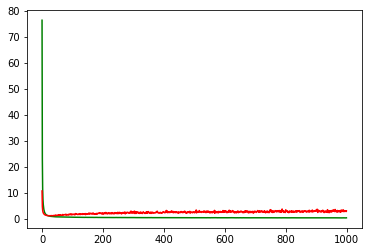

working on d,u and l,le 0.5 128 0.01 0.0001


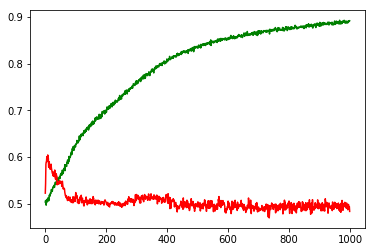

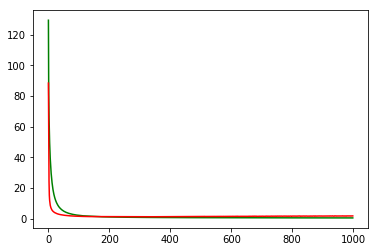

working on d,u and l,le 0.5 128 0.01 1e-05


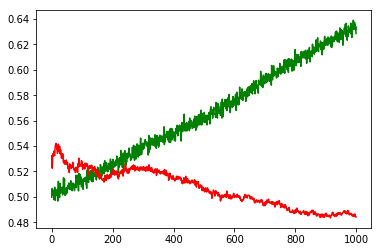

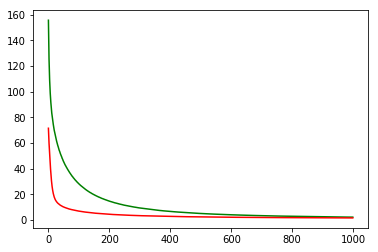

working on d,u and l,le 0.5 128 0.05 0.001


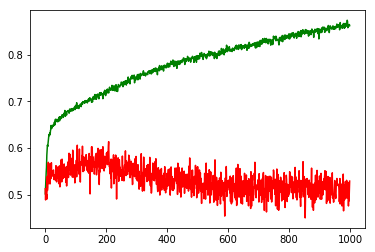

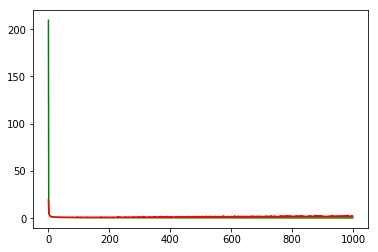

working on d,u and l,le 0.5 128 0.05 0.0001


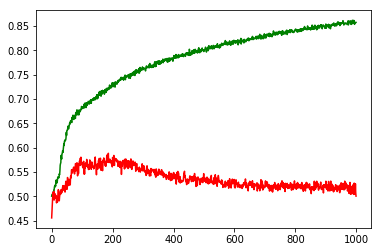

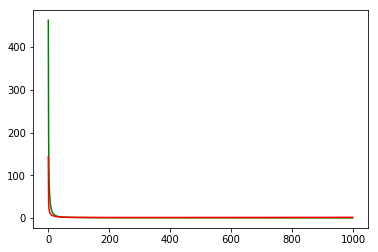

working on d,u and l,le 0.5 128 0.05 1e-05


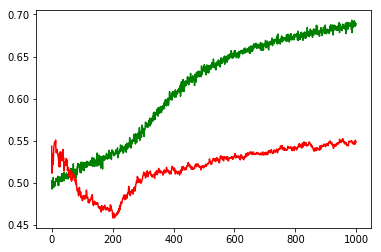

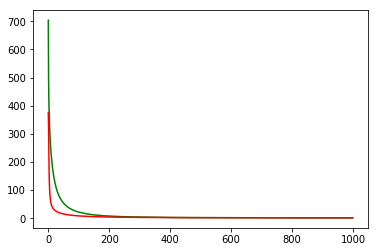

working on d,u and l,le 0.5 256 0.01 0.001


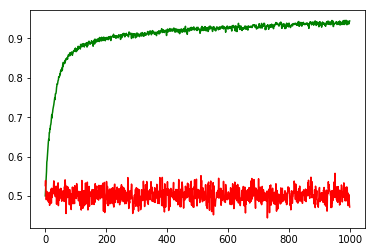

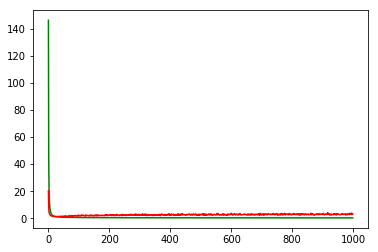

working on d,u and l,le 0.5 256 0.01 0.0001


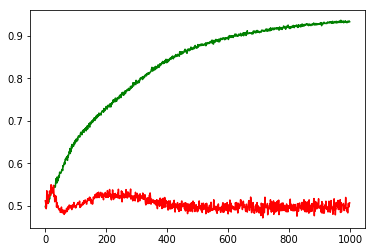

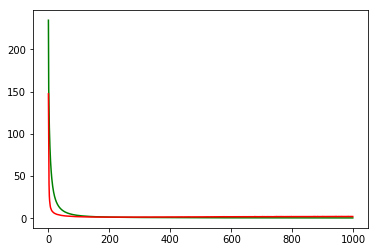

working on d,u and l,le 0.5 256 0.01 1e-05


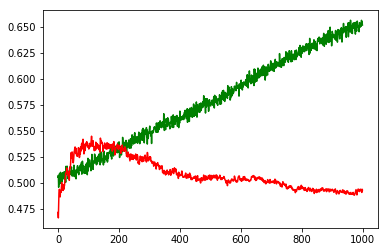

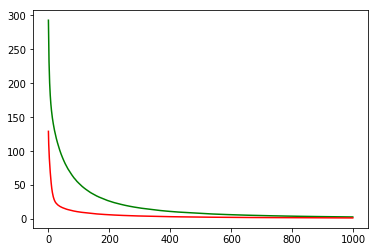

working on d,u and l,le 0.5 256 0.05 0.001


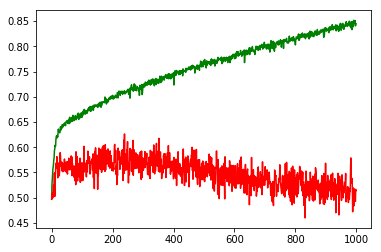

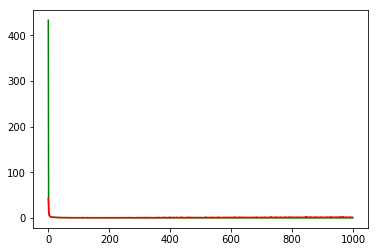

working on d,u and l,le 0.5 256 0.05 0.0001


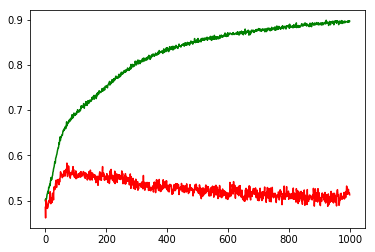

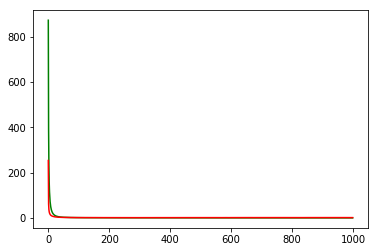

working on d,u and l,le 0.5 256 0.05 1e-05


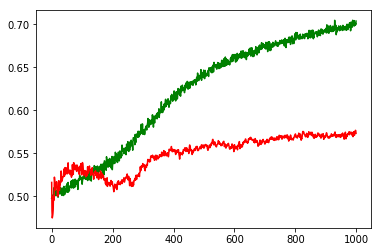

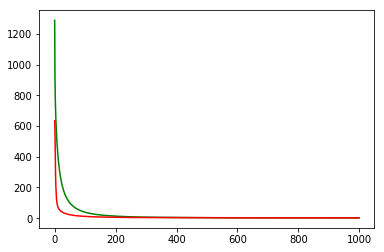

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: AVGO


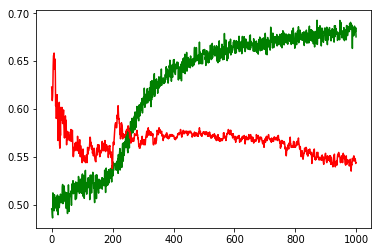

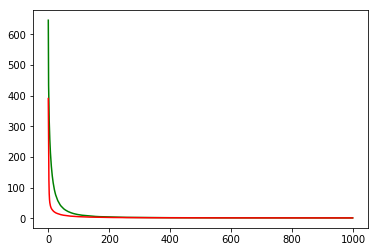

F1,score 0.5996884735202492
G-score: 0.5476046648849682
Accuracy 0.5439219155614103
Window: 140
[[228 178]
 [336 385]]
Vol pos 3.7560523239995467
Vol neg 2.5410760058989057
Real Percentage of gain: -22.792148511271005
Percentage of gain: 0.8840701043297999
Total gain: 996.3470075796846
000000000000000000000000000000000000000000000000
Percentile:  0
[[114  87]
 [196  78]]
475/475 [==============================] - 0s 25us/step
[0.9039570788333291, 0.40421052531192175]
Percentile:  1
[[ 52  52]
 [ 38 112]]
254/254 [==============================] - 0s 29us/step
[0.7337985953946752, 0.6456692916905786]
Percentile:  2
[[  8  30]
 [ 94 128]]
260/260 [==============================] - 0s 28us/step
[0.7567683751766499, 0.5230769230769231]
Percentile:  3
[[21  4]
 [ 8 55]]
88/88 [==============================] - 0s 33us/step
[0.5665317665446888, 0.8636363690549677]
Percentile:  4
[[32  5]
 [ 0 11]]
48/48 [==============================] - 0s 55us/step
[0.5194799800713857, 0.8958333333333334]


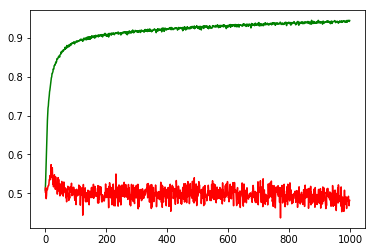

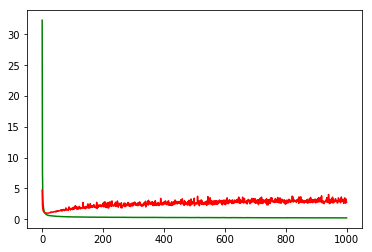

working on d,u and l,le 0.5 64 0.01 0.0001


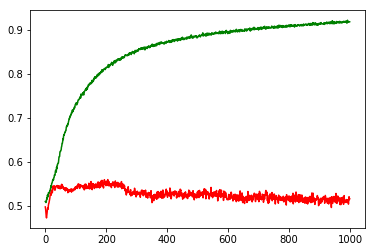

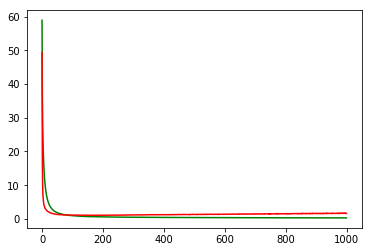

working on d,u and l,le 0.5 64 0.01 1e-05


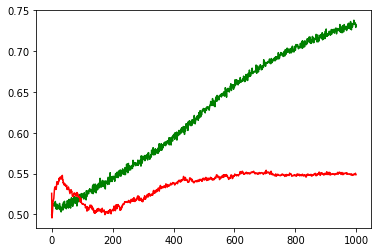

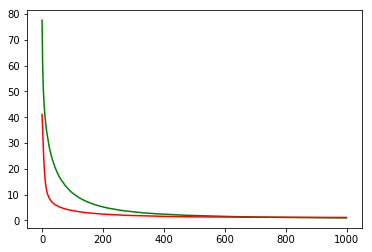

working on d,u and l,le 0.5 64 0.05 0.001


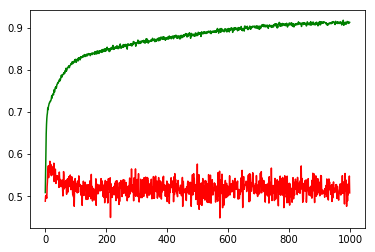

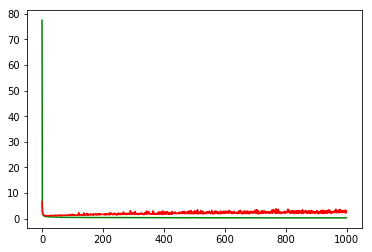

working on d,u and l,le 0.5 64 0.05 0.0001


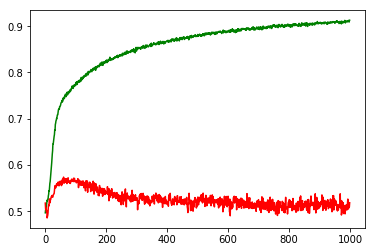

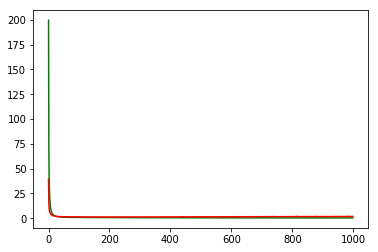

working on d,u and l,le 0.5 64 0.05 1e-05


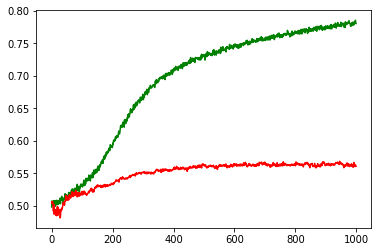

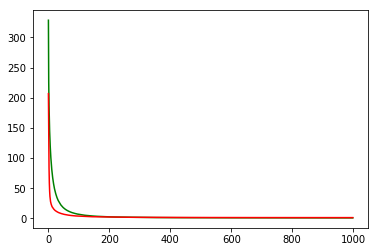

working on d,u and l,le 0.5 128 0.01 0.001


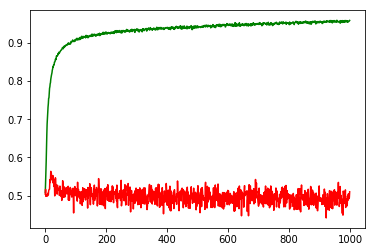

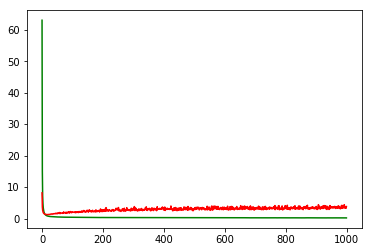

working on d,u and l,le 0.5 128 0.01 0.0001


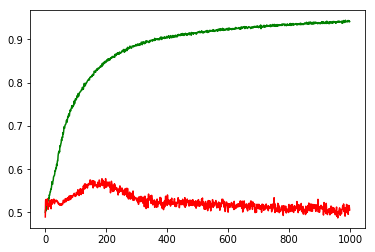

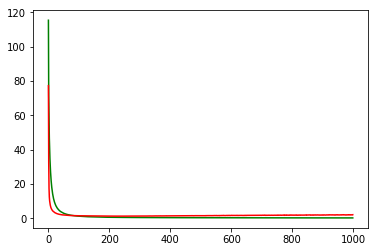

working on d,u and l,le 0.5 128 0.01 1e-05


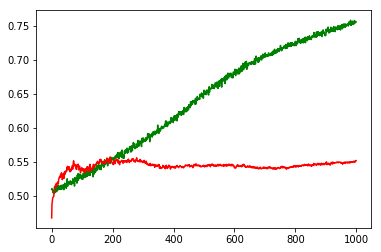

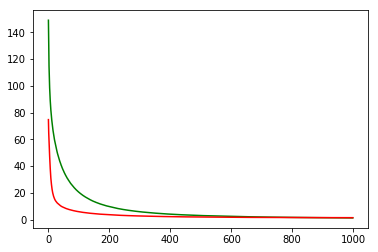

working on d,u and l,le 0.5 128 0.05 0.001


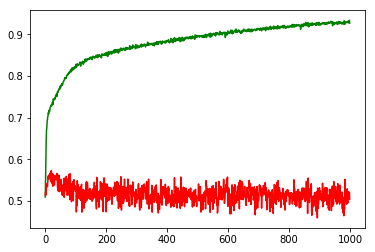

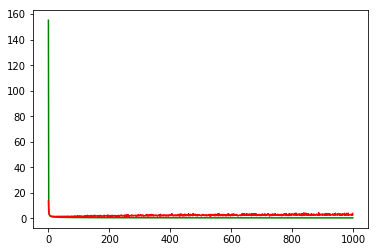

working on d,u and l,le 0.5 128 0.05 0.0001


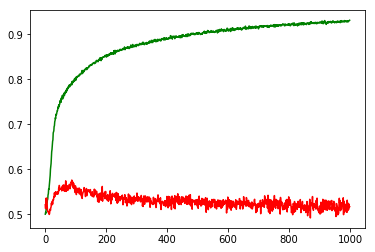

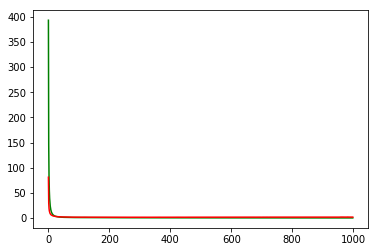

working on d,u and l,le 0.5 128 0.05 1e-05


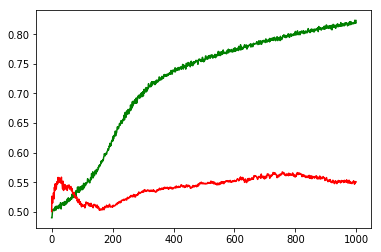

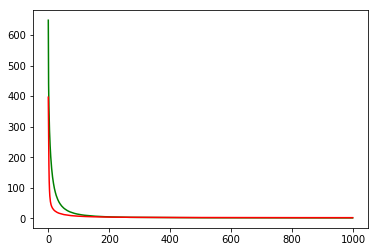

working on d,u and l,le 0.5 256 0.01 0.001


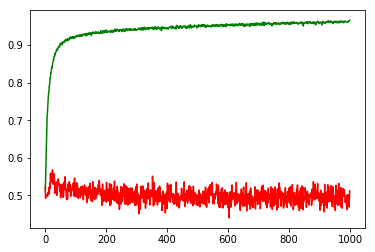

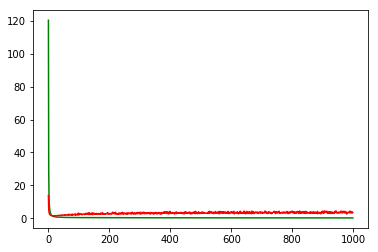

working on d,u and l,le 0.5 256 0.01 0.0001


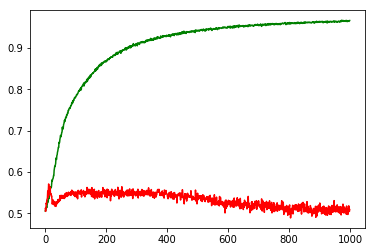

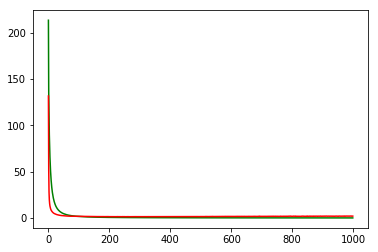

working on d,u and l,le 0.5 256 0.01 1e-05


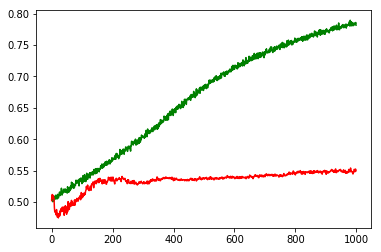

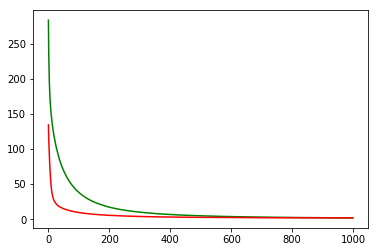

working on d,u and l,le 0.5 256 0.05 0.001


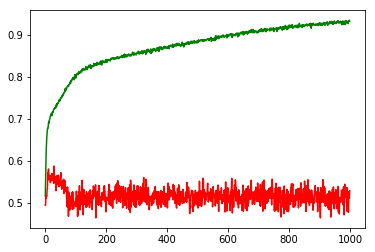

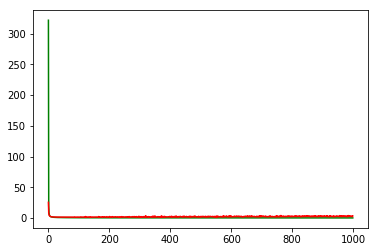

working on d,u and l,le 0.5 256 0.05 0.0001


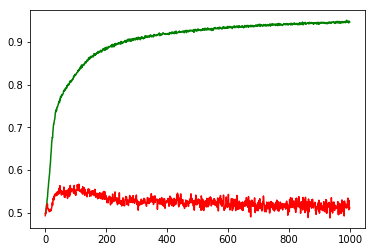

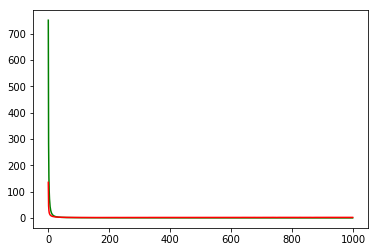

working on d,u and l,le 0.5 256 0.05 1e-05


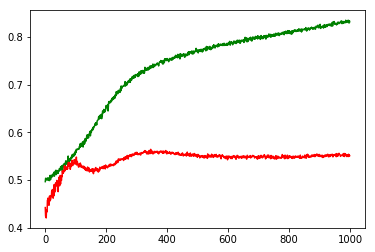

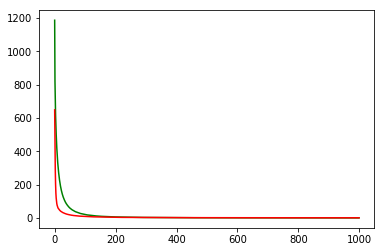

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: PYPL


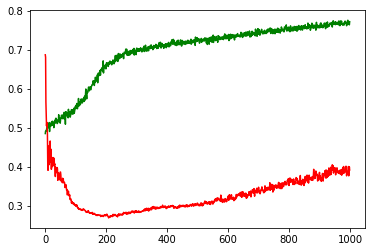

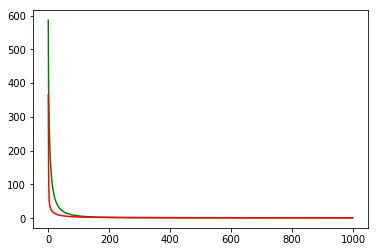

F1,score 0.40104620749782044
G-score: 0.43481834767961747
Accuracy 0.3914968999906173
Window: 140
[[212 106]
 [581 230]]
Vol pos 3.1665181867782364
Vol neg 2.7447854917483743
Real Percentage of gain: -153.61440388296407
Percentage of gain: -0.4305284271701973
Total gain: -486.06659427515274
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 89  45]
 [334 111]]
579/579 [==============================] - 0s 27us/step
[1.0304960050525238, 0.3454231434020765]
Percentile:  1
[[ 30  21]
 [171  86]]
308/308 [==============================] - 0s 26us/step
[0.9554515527440356, 0.37662337817154923]
Percentile:  2
[[83 37]
 [43 21]]
184/184 [==============================] - 0s 33us/step
[0.8562353849411011, 0.565217392600101]
Percentile:  3
[[10  3]
 [22  8]]
43/43 [==============================] - 0s 55us/step
[1.0812206517818361, 0.41860465462817703]
Percentile:  4
[[0 0]
 [9 3]]
12/12 [==============================] - 0s 65us/step
[0.9799078702926636, 0.25]
00000000000000000

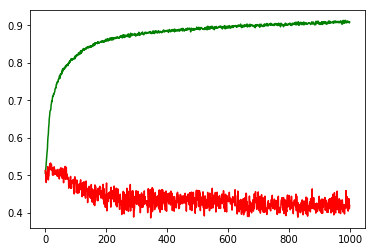

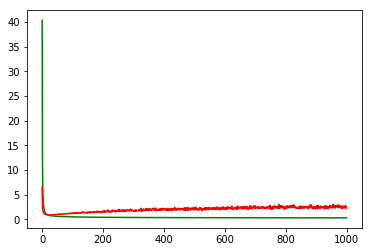

working on d,u and l,le 0.5 64 0.01 0.0001


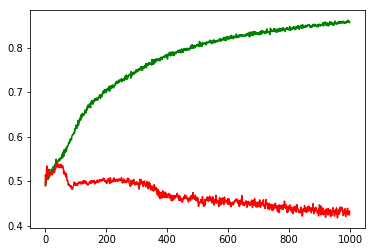

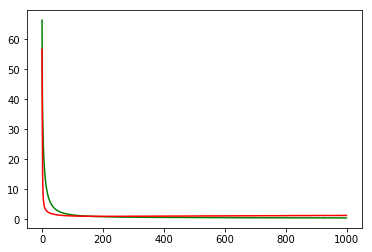

working on d,u and l,le 0.5 64 0.01 1e-05


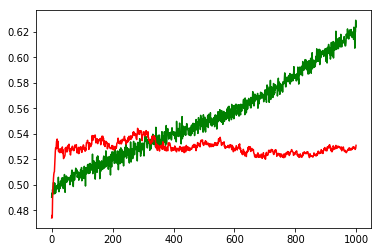

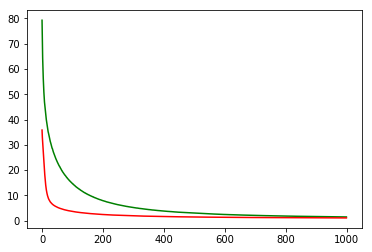

working on d,u and l,le 0.5 64 0.05 0.001


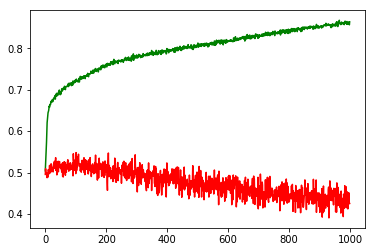

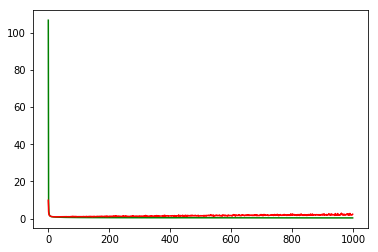

working on d,u and l,le 0.5 64 0.05 0.0001


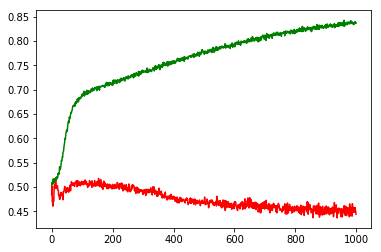

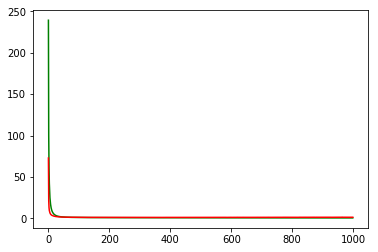

working on d,u and l,le 0.5 64 0.05 1e-05


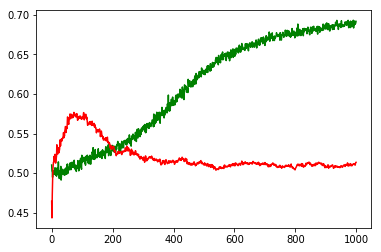

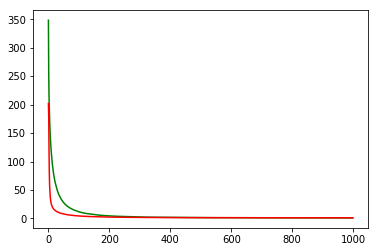

working on d,u and l,le 0.5 128 0.01 0.001


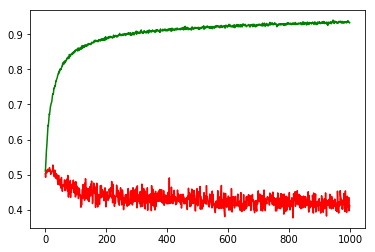

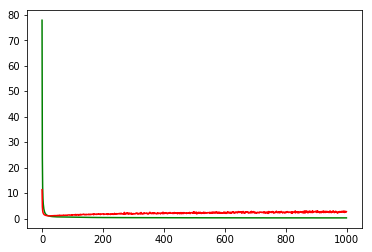

working on d,u and l,le 0.5 128 0.01 0.0001


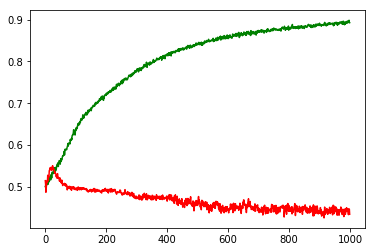

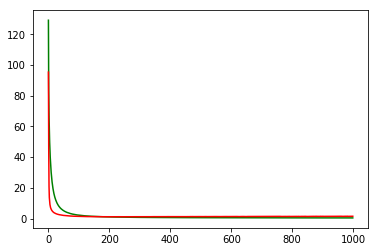

working on d,u and l,le 0.5 128 0.01 1e-05


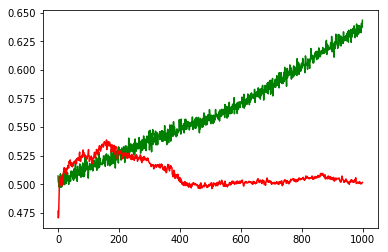

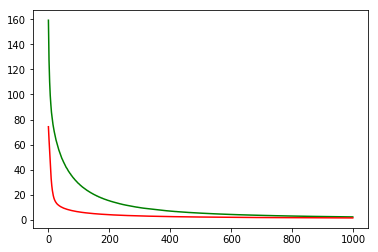

working on d,u and l,le 0.5 128 0.05 0.001


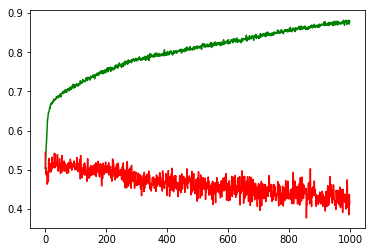

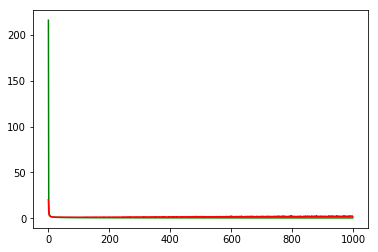

working on d,u and l,le 0.5 128 0.05 0.0001


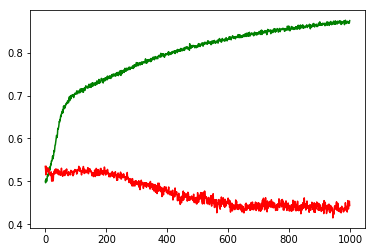

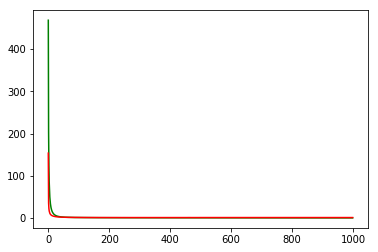

working on d,u and l,le 0.5 128 0.05 1e-05


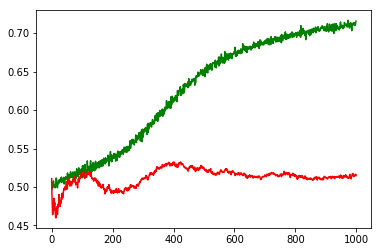

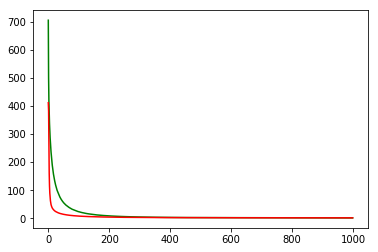

working on d,u and l,le 0.5 256 0.01 0.001


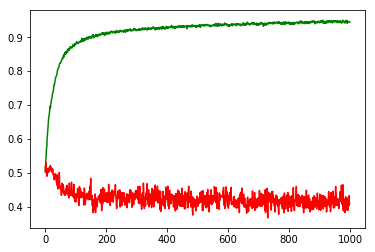

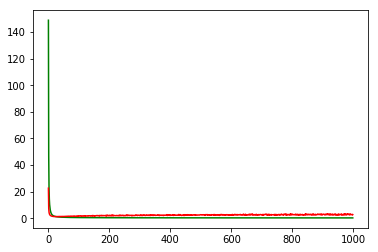

working on d,u and l,le 0.5 256 0.01 0.0001


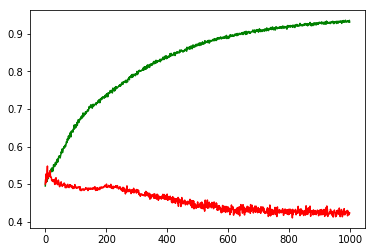

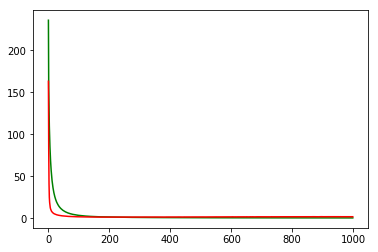

working on d,u and l,le 0.5 256 0.01 1e-05


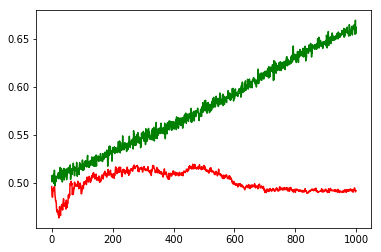

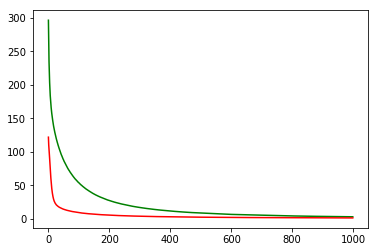

working on d,u and l,le 0.5 256 0.05 0.001


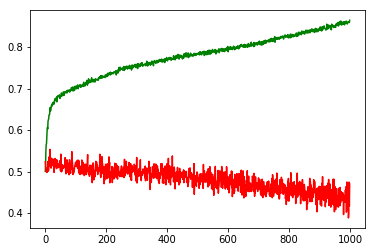

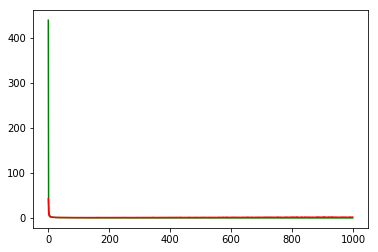

working on d,u and l,le 0.5 256 0.05 0.0001


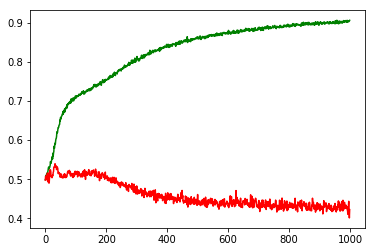

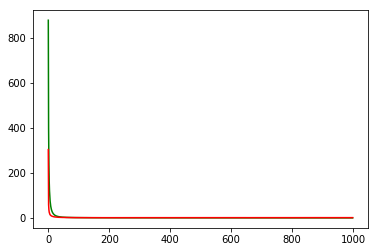

working on d,u and l,le 0.5 256 0.05 1e-05


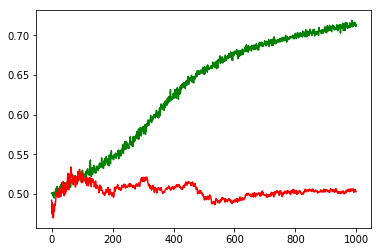

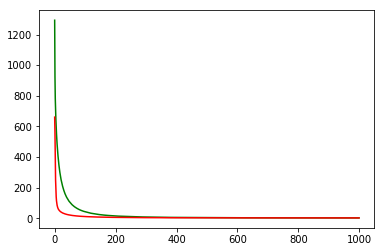

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.0001
Chart for BEST MODEL FOR: GILD


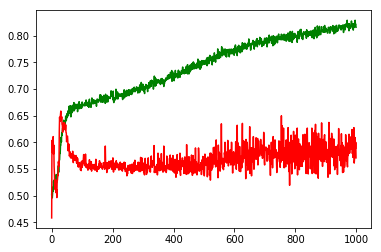

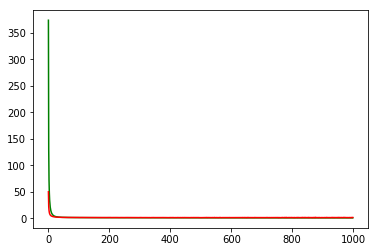

F1,score 0.6897435897435898
G-score: 0.4236295601162321
Accuracy 0.5709219860269669
Window: 140
[[106 476]
 [  8 538]]
Vol pos 3.083225834707147
Vol neg 3.4459744951788442
Real Percentage of gain: -66.62732492650905
Percentage of gain: 0.281689522947555
Total gain: 317.745781884842
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 34 305]
 [  6 263]]
608/608 [==============================] - 0s 24us/step
[1.5877133458852768, 0.48848684210526316]
Percentile:  1
[[ 39  64]
 [  2 202]]
307/307 [==============================] - 0s 33us/step
[0.6450204297851662, 0.7850162866449512]
Percentile:  2
[[ 8  4]
 [ 0 70]]
82/82 [==============================] - 0s 44us/step
[0.16812447603882813, 0.9512195121951219]
Percentile:  3
[[ 2 39]
 [ 0  0]]
41/41 [==============================] - 0s 51us/step
[1.5130903517327658, 0.04878048780487805]
Percentile:  4
[[23 63]
 [ 0  0]]
86/86 [==============================] - 0s 60us/step
[1.5900694880374642, 0.2674418608116549]
00000000

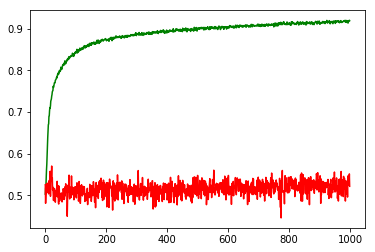

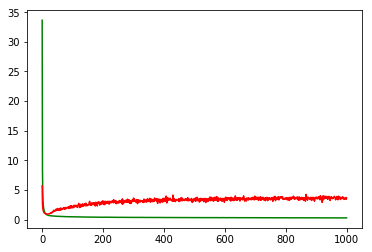

working on d,u and l,le 0.5 64 0.01 0.0001


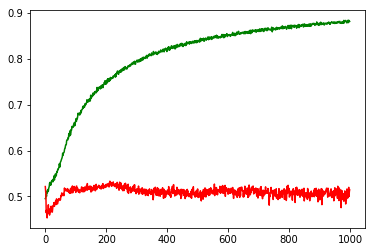

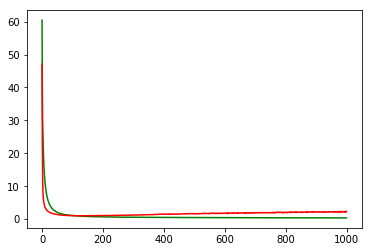

working on d,u and l,le 0.5 64 0.01 1e-05


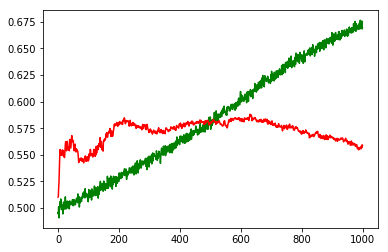

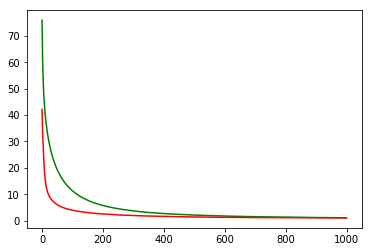

working on d,u and l,le 0.5 64 0.05 0.001


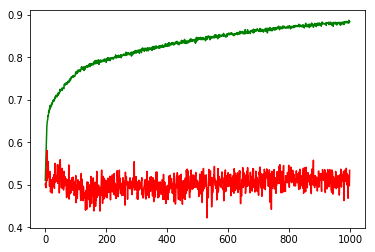

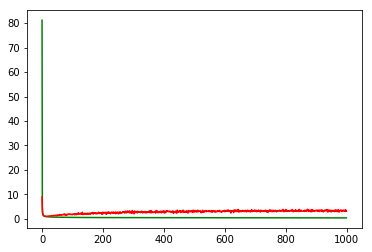

working on d,u and l,le 0.5 64 0.05 0.0001


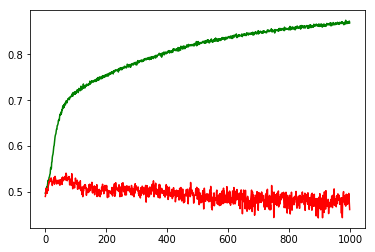

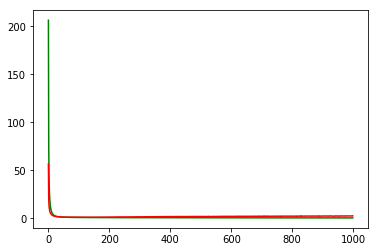

working on d,u and l,le 0.5 64 0.05 1e-05


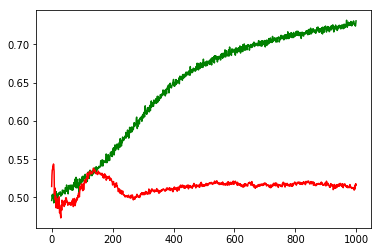

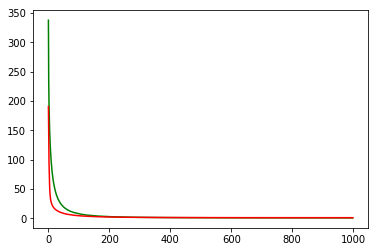

working on d,u and l,le 0.5 128 0.01 0.001


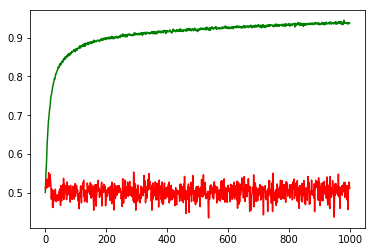

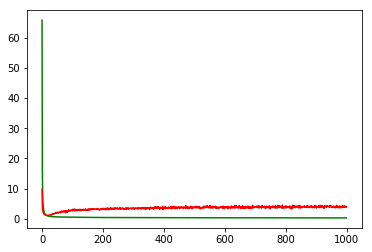

working on d,u and l,le 0.5 128 0.01 0.0001


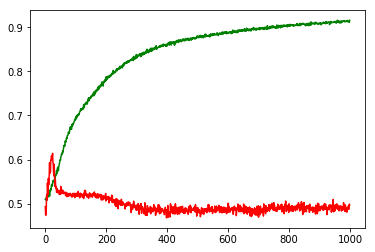

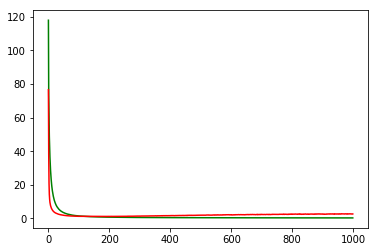

working on d,u and l,le 0.5 128 0.01 1e-05


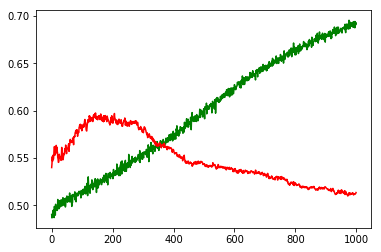

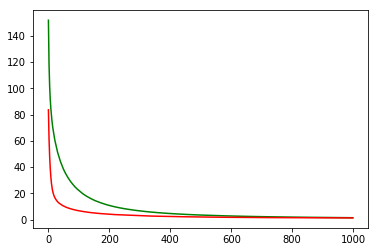

working on d,u and l,le 0.5 128 0.05 0.001


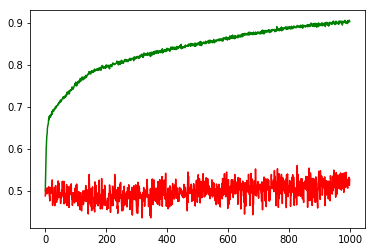

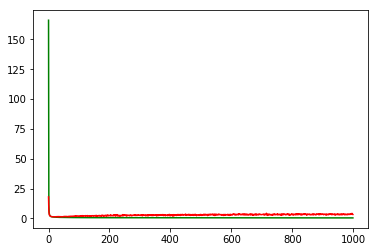

working on d,u and l,le 0.5 128 0.05 0.0001


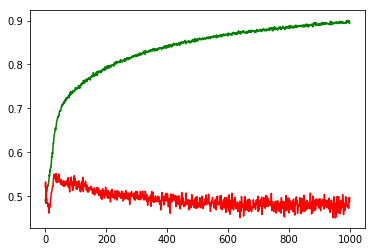

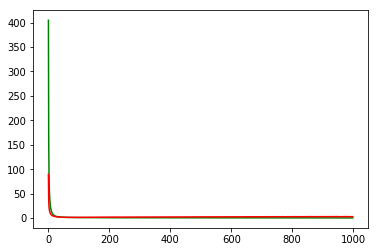

working on d,u and l,le 0.5 128 0.05 1e-05


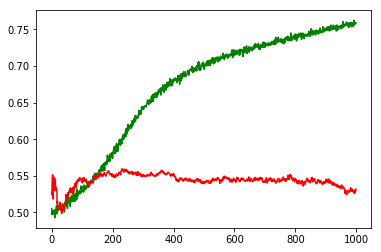

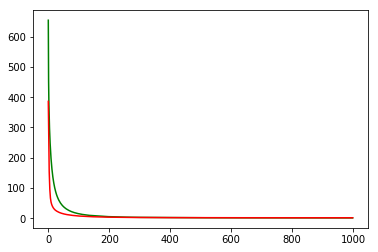

working on d,u and l,le 0.5 256 0.01 0.001


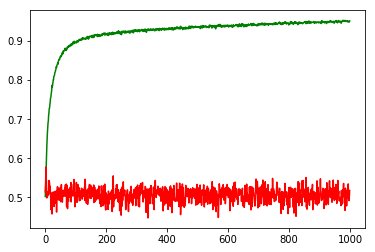

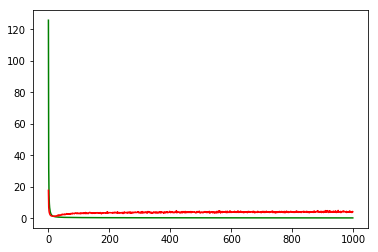

working on d,u and l,le 0.5 256 0.01 0.0001


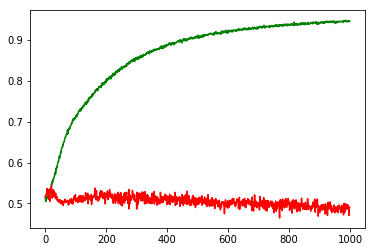

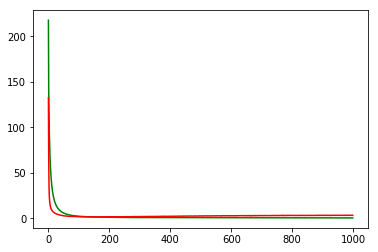

working on d,u and l,le 0.5 256 0.01 1e-05


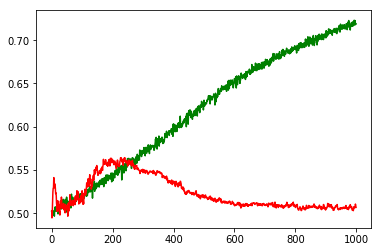

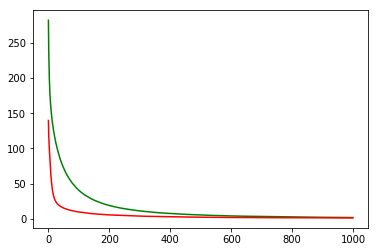

working on d,u and l,le 0.5 256 0.05 0.001


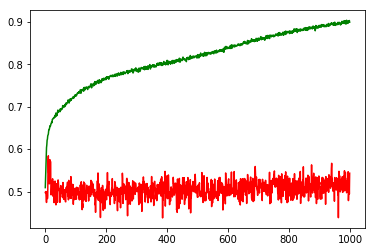

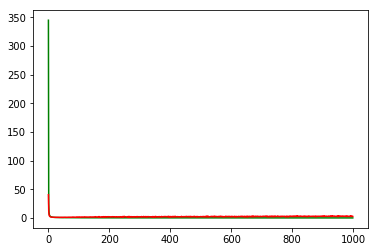

working on d,u and l,le 0.5 256 0.05 0.0001


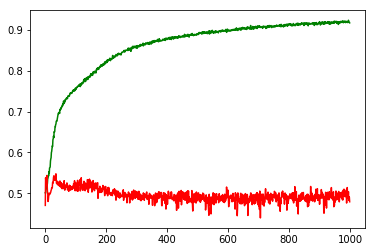

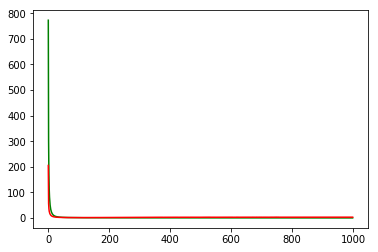

working on d,u and l,le 0.5 256 0.05 1e-05


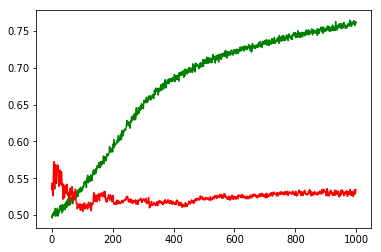

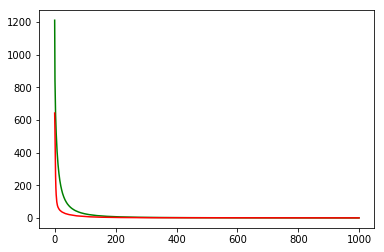

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: COST


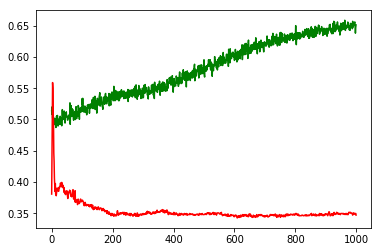

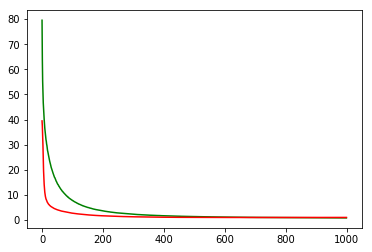

F1,score 0.046632124352331605
G-score: 0.15330571714600533
Accuracy 0.3469387755102041
Window: 140
[[373  12]
 [724  18]]
Vol pos 0.961325654336048
Vol neg 1.61424916911721
Real Percentage of gain: -223.82949848004986
Percentage of gain: -0.7206823936334267
Total gain: -812.2090576248719
000000000000000000000000000000000000000000000000
Percentile:  0
[[195   5]
 [177  10]]
387/387 [==============================] - 0s 21us/step
[0.7835828922207657, 0.5297157622739018]
Percentile:  1
[[ 97   7]
 [201   5]]
310/310 [==============================] - 0s 19us/step
[0.9127710211661554, 0.32903225806451614]
Percentile:  2
[[ 68   0]
 [203   2]]
273/273 [==============================] - 0s 20us/step
[1.0224652661508693, 0.2564102564102564]
Percentile:  3
[[12  0]
 [80  0]]
92/92 [==============================] - 0s 24us/step
[1.0640407334203306, 0.13043478260869565]
Percentile:  4
[[ 0  0]
 [62  1]]
63/63 [==============================] - 0s 33us/step
[1.1517952680587769, 0.015873015873015

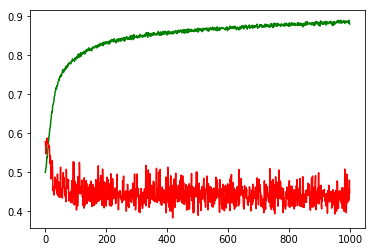

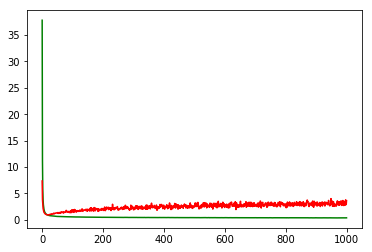

working on d,u and l,le 0.5 64 0.01 0.0001


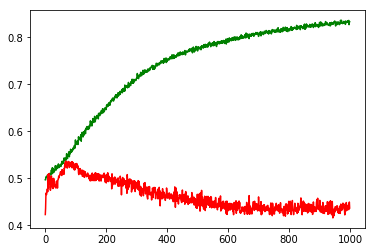

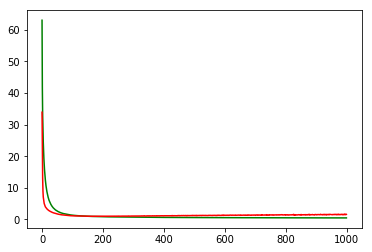

working on d,u and l,le 0.5 64 0.01 1e-05


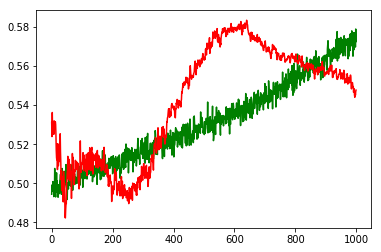

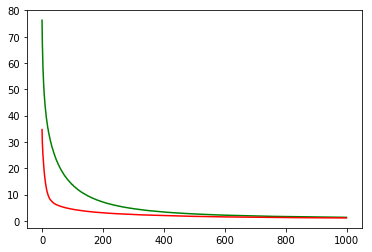

working on d,u and l,le 0.5 64 0.05 0.001


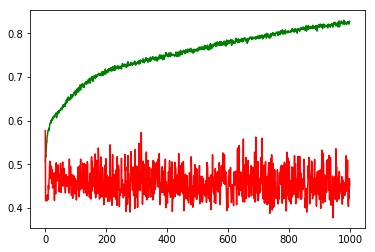

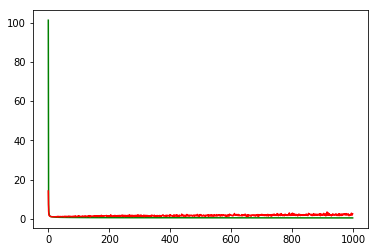

working on d,u and l,le 0.5 64 0.05 0.0001


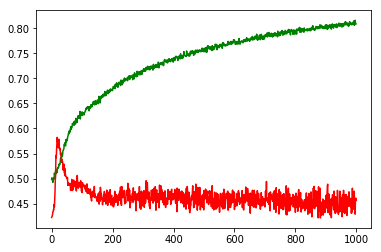

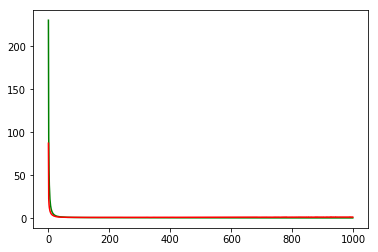

working on d,u and l,le 0.5 64 0.05 1e-05


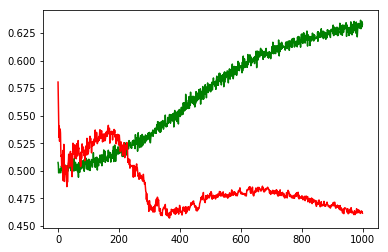

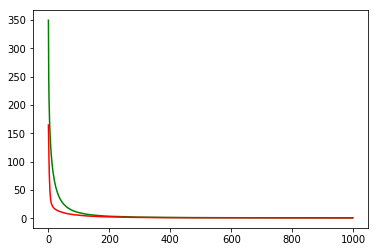

working on d,u and l,le 0.5 128 0.01 0.001


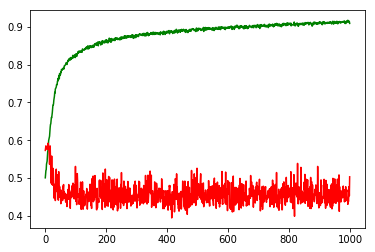

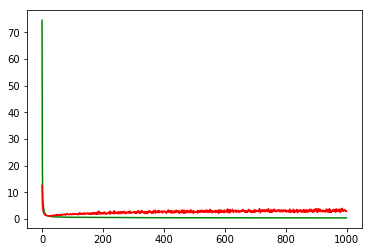

working on d,u and l,le 0.5 128 0.01 0.0001


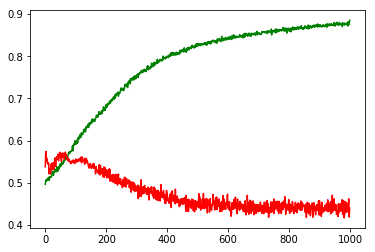

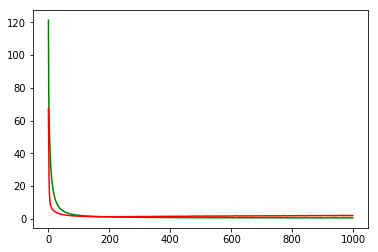

working on d,u and l,le 0.5 128 0.01 1e-05


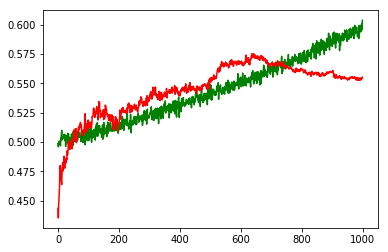

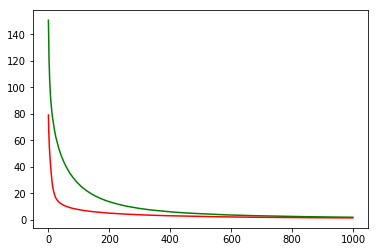

working on d,u and l,le 0.5 128 0.05 0.001


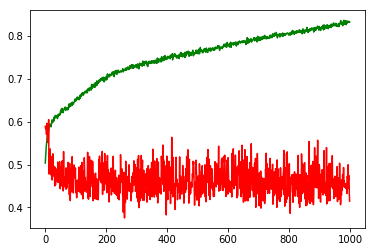

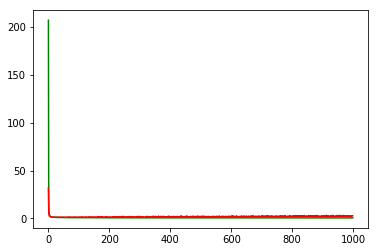

working on d,u and l,le 0.5 128 0.05 0.0001


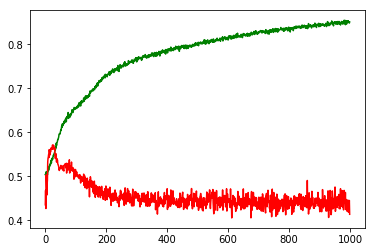

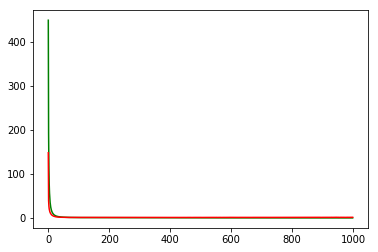

working on d,u and l,le 0.5 128 0.05 1e-05


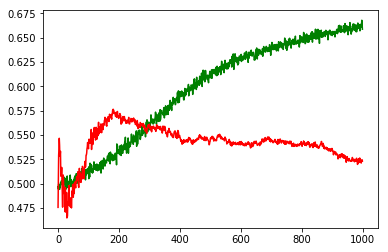

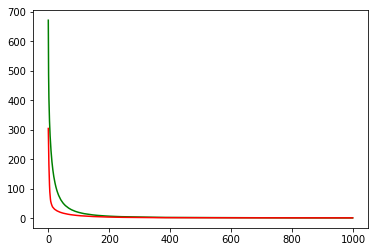

working on d,u and l,le 0.5 256 0.01 0.001


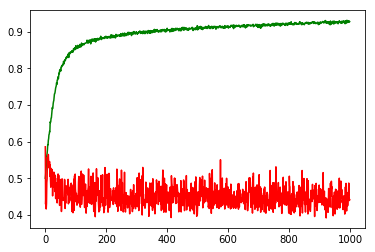

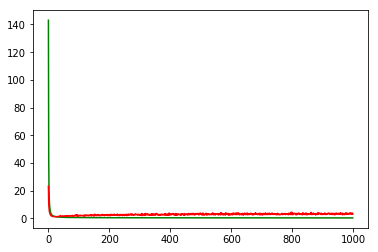

working on d,u and l,le 0.5 256 0.01 0.0001


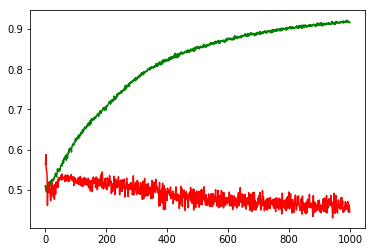

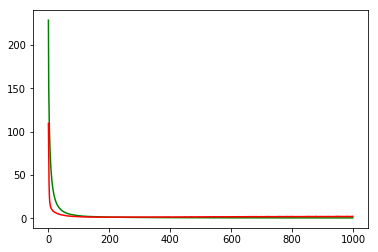

working on d,u and l,le 0.5 256 0.01 1e-05


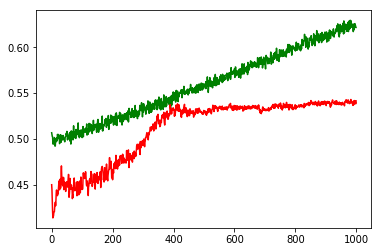

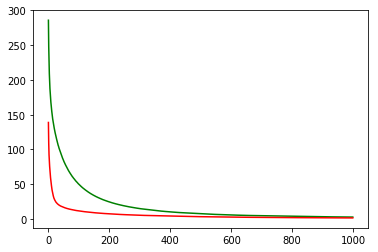

working on d,u and l,le 0.5 256 0.05 0.001


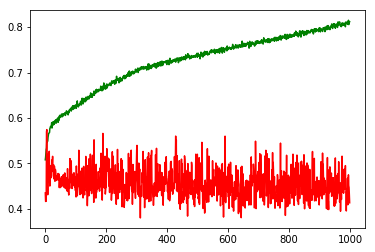

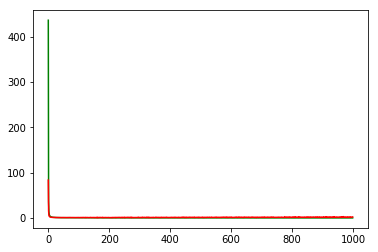

working on d,u and l,le 0.5 256 0.05 0.0001


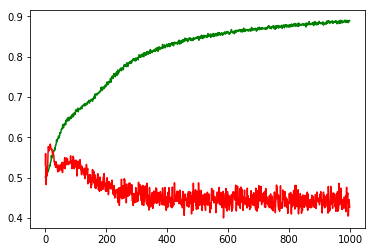

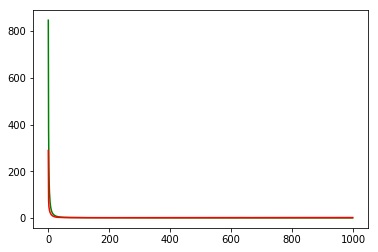

working on d,u and l,le 0.5 256 0.05 1e-05


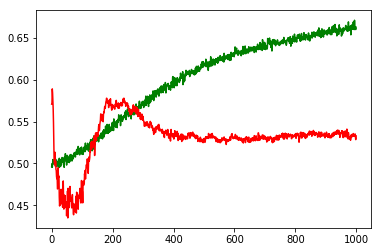

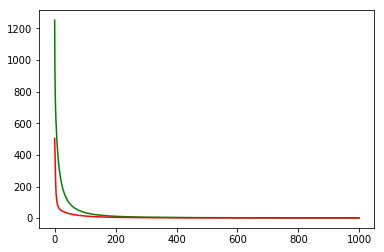

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: QCOM


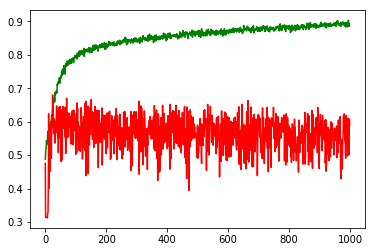

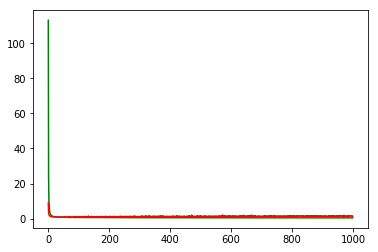

F1,score 0.6856368563685638
G-score: 0.5438049535459281
Accuracy 0.5897435883997184
Window: 140
[[161 194]
 [270 506]]
Vol pos 3.351287079377918
Vol neg 3.3524802667198474
Real Percentage of gain: 96.77850481347782
Percentage of gain: 0.6010235527737067
Total gain: 679.7576381870622
000000000000000000000000000000000000000000000000
Percentile:  0
[[115 115]
 [ 93 206]]
529/529 [==============================] - 0s 41us/step
[1.1372492957881357, 0.6068052932873566]
Percentile:  1
[[  9  39]
 [112 184]]
344/344 [==============================] - 0s 36us/step
[1.4067150188046833, 0.5610465109348297]
Percentile:  2
[[ 1 17]
 [30 60]]
108/108 [==============================] - 0s 39us/step
[1.197972465444494, 0.5648148148148148]
Percentile:  3
[[10  2]
 [33 35]]
80/80 [==============================] - 0s 46us/step
[1.0552902221679688, 0.5625]
Percentile:  4
[[26 20]
 [ 2 20]]
68/68 [==============================] - 0s 42us/step
[0.7852917374933467, 0.6764705882352942]
000000000000000000000

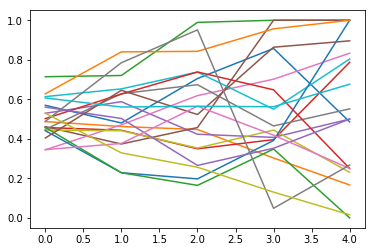

Ecco la matrice generale:
[[4401. 3075.]
 [7574. 6331.]]
Ecco le matrici per percentile
Percentile : 0
[[2596. 1686.]
 [3154. 2135.]]
Percentile : 1
[[ 917.  695.]
 [2468. 2190.]]
Percentile : 2
[[ 490.  335.]
 [1276. 1202.]]
Percentile : 3
[[338. 291.]
 [601. 523.]]
Percentile : 4
[[222. 231.]
 [232. 260.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))

for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
    senttemp=sentiment[o]
    senttemp=np.nan_to_num(np.asarray(senttemp, dtype=float))
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(np.concatenate((senttemp[i],xtemp[i])))
        
        y=np.array(y)
        x=np.array(x)
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0

                            

                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                            
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph()
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/both/'+files[o-1]+'.csv')
      
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp)
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
        del model
        del history
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        

        

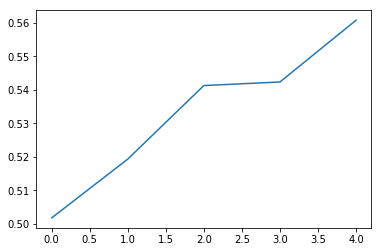

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()